<a href="https://colab.research.google.com/github/ahmedengu/feature_importance/blob/master/Forex/GBPEUR/GBPEUR_1H_High.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from IPython.display import clear_output
import pandas as pd

if pd.__version__ != '0.25.0' or False:
  # install
  !apt-get install default-jre build-essential swig
  !pip  install h2o==3.24.0.5 yfinance==0.1.43
  !pip  install git+https://github.com/ahmedengu/findatapy.git pandas==0.25.0
  clear_output(wait=True)

  !wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
  !tar -xzvf ta-lib-0.4.0-src.tar.gz
  %cd ta-lib
  !./configure --prefix=/usr
  clear_output(wait=True)
  !make
  clear_output(wait=True)
  !make install
  clear_output(wait=True)
  !pip install Ta-Lib==0.4.17
  clear_output(wait=True)
  print('RESTARTING')
  %cd /content
  
  # force restart
  import os
  os.kill(os.getpid(), 9)

In [0]:
# Experiment Config
import pandas as pd
from IPython.display import display
from IPython.core.debugger import set_trace

data_ticker = "EURGBP"
data_resample = '1H'
data_label = 'High'
data_label_name = 'y'
start_date = '1 Jan 2018'
finish_date = '1 Jan 2019'
is_duka = True
is_yahoo = False
kaggle_file = 'bitstamp' # default None
kaggle_folder = '1 Day/Stocks'

models_summary = {}
for metric in ['accuracy','F1','auc','logloss','mean_per_class_error','rmse','mse']:
  models_summary.update({metric:pd.DataFrame()})

# feature elimination config
model_selected_features = 50
PCA_k = 50
HCF_threshold = 0.90
LVF_threshold = 0.1
GLRM_k = 20
select_k = 50
select_percentile = 10
select_alpha = 0.1
select_rfe = 50

features_to_include = ['All', 'DLF', 'XGBF', 'RFE', 'Fwe'] # True for all , ['All','Fwe','RFE','Percentile','KBest','LVF','HCF','PCA','XGBF','GLMF','DLF','GLRM'] 
is_EDA = True
max_models_num = 10

# pandas options
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [4]:
# random seed
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)
import pandas as pd
import gc
import os

resample_how= {'Open': 'first', 'High': 'max', 'Low': 'min', 'Close': 'last',
                             'Volume': 'sum', 'Date': 'first'}

if is_duka:
  from findatapy.util import DataConstants

  DataConstants.market_thread_no.update({'dukascopy': 64})

  # Download dataset
  from findatapy.market import Market, MarketDataRequest, MarketDataGenerator

  market = Market(market_data_generator=MarketDataGenerator(log_every_day=30))

  md_request = MarketDataRequest(start_date=start_date, finish_date=finish_date,
                                       fields=['temp', 'ask', 'bid', 'askv', 'bidv'], vendor_fields=['temp', 'ask', 'bid', 'askv', 'bidv'],
                                       freq='tick', data_source='dukascopy',
                                       tickers=[data_ticker], vendor_tickers=[data_ticker])

  temp_dataset = market.fetch_market(md_request)
  full_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bid'].resample(data_resample).ohlc())
  full_dataset.columns = ['Open', 'High', 'Low', 'Close']
  temp_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bidv'].resample(data_resample).sum())
  temp_dataset.columns = ['Volume']
  full_dataset['Volume'] = temp_dataset['Volume']

  del temp_dataset, md_request, market, DataConstants, Market, MarketDataRequest, MarketDataGenerator

  gc.collect()

elif is_yahoo:
  import yfinance as yf
  from datetime import datetime

  full_dataset = yf.download(data_ticker, start=str(datetime.strptime(start_date, '%d %b %Y')).split(' ')[0], end=str(datetime.strptime(finish_date, '%d %b %Y')).split(' ')[0])
  full_dataset['Date']=full_dataset.index
  del yf,datetime

elif data_ticker == 'EURUSD':
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2014.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2015.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2016.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2017.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2018.zip
  !unzip -qq -o \*.zip
  full_dataset = pd.read_csv('DAT_ASCII_EURUSD_M1_2014.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';')
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2015.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2016.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2017.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2018.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset['Date'] = pd.to_datetime(full_dataset['Date'])
  full_dataset.index = full_dataset['Date']
  full_dataset = full_dataset.dropna()
  full_dataset = full_dataset.sort_index()
  full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]


    
elif data_ticker == 'APPLUSUSD':
  full_dataset=pd.read_csv('https://github.com/kyleconroy/apple-stock/raw/master/apple_stock_data.csv',index_col =0,parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > '2007-04-01']


elif data_ticker == 'COMI':
  full_dataset=pd.read_csv('https://static.mubasher.info/File.MubasherCharts/File.Historical_Stock_Charts_Dir/44507230b2b03e2da37352abf1a659545b44.csv',index_col =0,names =['Open', 'High', 'Low', 'Close','Volume'],parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Volume'] = full_dataset['Volume'] * full_dataset['Close'] 
  full_dataset = full_dataset.drop_duplicates()
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]
  
elif kaggle_file is not None:
  if not os.path.isfile('kaggle.json'):
    from google.colab import files
    files.upload()
    
    import time
    time.sleep(10)
    !ls
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/
    !ls ~/.kaggle

    !chmod 600 /root/.kaggle/kaggle.json
    del files
    
  !kaggle datasets download $data_ticker
  !unzip -qq -o \*.zip
  !unzip -qq -o \*.zip

  if data_ticker == 'mczielinski/bitcoin-historical-data':
    
    full_dataset = pd.read_csv([file for file in os.listdir() if kaggle_file in file][0])
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Volume_(Currency)','Weighted_Price']
    full_dataset.index=pd.to_datetime(full_dataset['Date'], unit='s')

    resample_how.update({'Volume_(Currency)': 'sum', 'Weighted_Price': 'last'})

    full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()[1:-1]
    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]
  
  elif data_ticker == 'borismarjanovic/daily-and-intraday-stock-price-data':
    
    full_dataset = pd.read_csv(kaggle_folder + '/' + [file for file in os.listdir(kaggle_folder) if kaggle_file in file][0])
    if 'Time' in full_dataset.columns:
      full_dataset['Date'] = pd.to_datetime(full_dataset['Date'] + ' ' + full_dataset['Time'])
      full_dataset = full_dataset.drop('Time',axis=1)
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'OpenInt']
    full_dataset.index=pd.to_datetime(full_dataset['Date'])

    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]

  
gc.collect()
full_dataset = full_dataset.dropna()

full_dataset = full_dataset.drop('Date',axis=1, errors='ignore')
full_dataset = full_dataset.sort_index()
full_dataset = full_dataset[-100000:]
display(full_dataset)
display(full_dataset.describe())
full_dataset.to_pickle('full_dataset')
del full_dataset, set_random_seed, seed
gc.collect()

2019-08-24 15:55:28,600 - findatapy.market.datavendorweb - INFO - Request Dukascopy data
2019-08-24 15:55:28,607 - findatapy.market.datavendorweb - INFO - About to download from Dukascopy... for EURGBP
2019-08-24 15:59:54,084 - findatapy.market.datavendorweb - INFO - Downloading... 2018-01-30 00:00:00
2019-08-24 16:08:45,625 - findatapy.market.datavendorweb - INFO - Downloading... 2018-03-30 00:00:00
2019-08-24 16:13:06,358 - findatapy.market.datavendorweb - INFO - Downloading... 2018-04-30 00:00:00
2019-08-24 16:17:17,202 - findatapy.market.datavendorweb - INFO - Downloading... 2018-05-30 00:00:00
2019-08-24 16:21:29,262 - findatapy.market.datavendorweb - INFO - Downloading... 2018-06-30 00:00:00
2019-08-24 16:25:28,387 - findatapy.market.datavendorweb - INFO - Downloading... 2018-07-30 00:00:00
2019-08-24 16:29:56,953 - findatapy.market.datavendorweb - INFO - Downloading... 2018-08-30 00:00:00
2019-08-24 16:34:24,215 - findatapy.market.datavendorweb - INFO - Downloading... 2018-09-30

/usr/local/lib/python3.6/dist-packages/findatapy/market/ioengine.py:264: FutureWarning: to_msgpack is deprecated and will be removed in a future version.
It is recommended to use pyarrow for on-the-wire transmission of pandas objects.
  r.set(fname, data_frame.to_msgpack(compress='blosc'))


2019-08-24 16:48:02,494 - findatapy.market.ioengine - WARNING - Couldn't push MarketDataRequest_436__abstract_curve_key-None__category-None__category_key-backtest_default-cat_dukascopy_tick_NYC_EURGBP__cut-NYC__data_source-dukascopy__environment-backtest__expiry_date-NaT__fields-temp_ask_bid_askv_bidv__finish_date-2019-01-01 00:00:00__freq-tick__freq_mult-1__gran_freq-None__resample-None__resample_how-last__start_date-2018-01-01 00:00:00__tickers-EURGBP__trade_side-trade__vendor_fields-temp_ask_bid_askv_bidv__vendor_tickers-EURGBP to Redis: Error 111 connecting to 127.0.0.1:6379. Connection refused.


,Open,High,Low,Close,Volume
Date,,,,,
2018-01-01 22:00:00,0.88906,0.88906,0.88722,0.88842,806.640015
2018-01-01 23:00:00,0.88842,0.88901,0.88795,0.88897,5997.120117
2018-01-02 00:00:00,0.88897,0.88926,0.88853,0.88922,2694.379883
2018-01-02 01:00:00,0.88921,0.88927,0.88898,0.88911,2631.209961
2018-01-02 02:00:00,0.88912,0.88915,0.88847,0.88872,2359.899902
2018-01-02 03:00:00,0.88872,0.88898,0.88856,0.88858,2626.380127
2018-01-02 04:00:00,0.88858,0.88922,0.88855,0.88922,2292.550049
2018-01-02 05:00:00,0.88920,0.88945,0.88901,0.88918,1894.869995
2018-01-02 06:00:00,0.88918,0.88965,0.88911,0.88953,3624.320068


,Open,High,Low,Close,Volume
count,6221.000000,6221.000000,6221.000000,6221.000000,6221.000000
mean,0.884675,0.885204,0.884170,0.884676,6526.284668
std,0.009026,0.009038,0.009029,0.009027,3662.397949
min,0.862280,0.863000,0.862050,0.862250,144.419998
25%,0.877380,0.877940,0.876890,0.877380,3367.900146
50%,0.884370,0.884830,0.883920,0.884370,6213.560059
75%,0.890740,0.891220,0.890220,0.890740,9064.480469
max,0.909530,0.909820,0.908940,0.909530,24843.320312


25

In [5]:
# OHLC EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('full_dataset')))
  del pp

/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/pandas_profiling/describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,6
Number of observations,6221
Total Missing (%),0.0%
Total size in memory,170.2 KiB
Average record size in memory,28.0 B
Numeric,2
Categorical,0
Boolean,0
Date,1
Text (Unique),0
Rejected,3


In [6]:
# features
from talib._ta_lib import *
import talib
import numpy as np
import uuid
import os


features_dataset = pd.read_pickle('full_dataset').sort_index()


periods = np.resize([2, 3, 3, 2], len(features_dataset['Close'])).astype(float)
timeperiods = [8, 12, 14, 20, 24, 30]
matypes = range(9)
nbdevs = [2, 3, 4, 5]

# date features
features_dataset['day'] = features_dataset.index.day
features_dataset['dayofweek'] = features_dataset.index.dayofweek
features_dataset['dayofyear'] = features_dataset.index.dayofyear
features_dataset['days_in_month'] = features_dataset.index.days_in_month
features_dataset['hour'] = features_dataset.index.hour
features_dataset['is_month_end'] = pd.factorize(features_dataset.index.is_month_end)[0]
features_dataset['is_month_start'] = pd.factorize(features_dataset.index.is_month_start)[0]
features_dataset['is_quarter_end'] = pd.factorize(features_dataset.index.is_quarter_end)[0]
features_dataset['is_quarter_start'] = pd.factorize(features_dataset.index.is_quarter_start)[0]
features_dataset['minute'] = features_dataset.index.minute
features_dataset['month'] = features_dataset.index.month
features_dataset['quarter'] = features_dataset.index.quarter
features_dataset['second'] = features_dataset.index.second
features_dataset['week'] = features_dataset.index.week
features_dataset['weekday'] = features_dataset.index.weekday
features_dataset['weekday_name'] = pd.factorize(features_dataset.index.weekday_name)[0]
features_dataset['weekofyear'] = features_dataset.index.weekofyear

# Overlap Studies
features_dataset['HT_TRENDLINE'] = HT_TRENDLINE(features_dataset['Close'])
features_dataset['mama'], features_dataset['fama'] = MAMA(features_dataset['Close'])
features_dataset['SAREXT'] = SAREXT(features_dataset['High'], features_dataset['Low'], startvalue=-4e37,
                                    offsetonreverse=-4e37, accelerationinitlong=-4e37,
                                    accelerationlong=-4e37, accelerationmaxlong=-4e37, accelerationinitshort=-4e37,
                                    accelerationshort=-4e37, accelerationmaxshort=-4e37)

for timeperiod in timeperiods:
    features_dataset['DEMA_' + str(timeperiod)] = DEMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['EMA_' + str(timeperiod)] = EMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['KAMA_' + str(timeperiod)] = KAMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIDPOINT_' + str(timeperiod)] = MIDPOINT(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIDPRICE_' + str(timeperiod)] = MIDPRICE(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['SAR_' + str(timeperiod / 100)] = SAR(features_dataset['High'], features_dataset['Low'],
                                                           acceleration=timeperiod / 100,
                                                           maximum=timeperiod / 100)
    features_dataset['SMA_' + str(timeperiod)] = SMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TEMA_' + str(timeperiod)] = TEMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TRIMA_' + str(timeperiod)] = TRIMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['WMA_' + str(timeperiod)] = WMA(features_dataset['Close'], timeperiod=timeperiod)

    for matype in matypes:
        features_dataset['MA_' + str(timeperiod) + '_' + str(matype)] = MA(features_dataset['Close'],
                                                                           timeperiod=timeperiod, matype=matype)
        features_dataset['MAVP_' + str(timeperiod) + '_' + str(matype)] = MAVP(features_dataset['Close'], periods,
                                                                               minperiod=2,
                                                                               maxperiod=timeperiod, matype=matype)
        features_dataset['T3_' + str(timeperiod) + '_' + str(matype)] = T3(features_dataset['Close'],
                                                                           timeperiod=timeperiod,
                                                                           vfactor=matype / 10)

        for nbdev in nbdevs:
            features_dataset['BBANDS_upperband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
            features_dataset['BBANDS_middleband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
            features_dataset['BBANDS_lowerband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)] = BBANDS(
                features_dataset['Close'], timeperiod=timeperiod, nbdevup=nbdev, nbdevdn=nbdev, matype=matype)

            
gc.collect()
# Momentum Indicators
features_dataset['BOP'] = BOP(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                              features_dataset['Close'])

for timeperiod in timeperiods:
    features_dataset['ADX_' + str(timeperiod)] = ADX(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ADXR_' + str(timeperiod)] = ADXR(features_dataset['High'], features_dataset['Low'],
                                                       features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['aroondown_' + str(timeperiod)], features_dataset['aroonup_' + str(timeperiod)] = AROON(
        features_dataset['High'],
        features_dataset['Low'],
        timeperiod=timeperiod)
    features_dataset['AROONOSC_' + str(timeperiod)] = AROONOSC(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['CCI_' + str(timeperiod)] = CCI(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['CMO_' + str(timeperiod)] = CMO(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['DX_' + str(timeperiod)] = DX(features_dataset['High'], features_dataset['Low'],
                                                   features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MACDFIX_' + str(timeperiod)], features_dataset['MACDFIX_signal_' + str(timeperiod)], features_dataset[
        'MACDFIX_hist_' + str(timeperiod)] = MACDFIX(features_dataset['Close'], signalperiod=timeperiod)
    features_dataset['MFI_' + str(timeperiod)] = MFI(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], features_dataset['Volume'],
                                                     timeperiod=timeperiod)
    features_dataset['MINUS_DI_' + str(timeperiod)] = MINUS_DI(features_dataset['High'], features_dataset['Low'],
                                                               features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MINUS_DM_' + str(timeperiod)] = MINUS_DM(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['MOM_' + str(timeperiod)] = MOM(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['PLUS_DI_' + str(timeperiod)] = PLUS_DI(features_dataset['High'], features_dataset['Low'],
                                                             features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['PLUS_DM_' + str(timeperiod)] = PLUS_DM(features_dataset['High'], features_dataset['Low'],
                                                             timeperiod=timeperiod)
    features_dataset['ROC_' + str(timeperiod)] = ROC(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCP_' + str(timeperiod)] = ROCP(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCR_' + str(timeperiod)] = ROCR(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCR100_' + str(timeperiod)] = ROCR100(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['RSI_' + str(timeperiod)] = RSI(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TRIX_' + str(timeperiod)] = TRIX(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['WILLR_' + str(timeperiod)] = WILLR(features_dataset['High'], features_dataset['Low'],
                                                         features_dataset['Close'], timeperiod=timeperiod)

    
gc.collect()
features_dataset['APO'] = APO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

features_dataset['MACD'], features_dataset['MACD_signal'], features_dataset['MACD_hist'] = MACD(
    features_dataset['Close'], fastperiod=12,
    slowperiod=26,
    signalperiod=9)
features_dataset['MACDEXT'], features_dataset['MACDEXT_signal'], features_dataset['MACDEXT_hist'] = MACDEXT(
    features_dataset['Close'],
    fastperiod=12,
    fastmatype=0,
    slowperiod=26,
    slowmatype=0,
    signalperiod=9,
    signalmatype=0)

features_dataset['PPO'] = PPO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

features_dataset['STOCH_slowk'], features_dataset['STOCH_slowd'] = STOCH(features_dataset['High'],
                                                                         features_dataset['Low'],
                                                                         features_dataset['Close'], fastk_period=5,
                                                                         slowk_period=3, slowk_matype=0,
                                                                         slowd_period=3, slowd_matype=0)
features_dataset['STOCHF_fastk'], features_dataset['STOCHF_fastd'] = STOCHF(features_dataset['High'],
                                                                            features_dataset['Low'],
                                                                            features_dataset['Close'], fastk_period=5,
                                                                            fastd_period=3, fastd_matype=0)
features_dataset['STOCHRSI_fastk'], features_dataset['STOCHRSI_fastd'] = STOCHRSI(features_dataset['Close'],
                                                                                  timeperiod=14,
                                                                                  fastk_period=5, fastd_period=3,
                                                                                  fastd_matype=0)
features_dataset['ULTOSC'] = ULTOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                    timeperiod1=7, timeperiod2=14, timeperiod3=28)

# Volume Indicators
features_dataset['AD'] = AD(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                            features_dataset['Volume'])
features_dataset['ADOSC'] = ADOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                  features_dataset['Volume'], fastperiod=3, slowperiod=10)
features_dataset['OBV'] = OBV(features_dataset['Close'], features_dataset['Volume'])

gc.collect()
# Volatility Indicators
for timeperiod in timeperiods:
    features_dataset['ATR_' + str(timeperiod)] = ATR(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['NATR_' + str(timeperiod)] = NATR(features_dataset['High'], features_dataset['Low'],
                                                       features_dataset['Close'], timeperiod=timeperiod)

features_dataset['TRANGE'] = TRANGE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

# Price Transform
features_dataset['AVGPRICE'] = AVGPRICE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                        features_dataset['Close'])
features_dataset['MEDPRICE'] = MEDPRICE(features_dataset['High'], features_dataset['Low'])
features_dataset['TYPPRICE'] = TYPPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])
features_dataset['WCLPRICE'] = WCLPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

gc.collect()
# Cycle Indicators
features_dataset['HT_DCPERIOD'] = HT_DCPERIOD(features_dataset['Close'])
features_dataset['HT_DCPHASE'] = HT_DCPHASE(features_dataset['Close'])
features_dataset['HT_PHASOR_inphase'], features_dataset['HT_PHASOR_quadrature'] = HT_PHASOR(features_dataset['Close'])
features_dataset['HT_SINE_sine'], features_dataset['HT_SINE_leadsine'] = HT_SINE(features_dataset['Close'])
features_dataset['HT_TRENDMODE'] = HT_TRENDMODE(features_dataset['Close'])

# Pattern Recognition
features_dataset['CDL2CROWS'] = CDL2CROWS(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDL3BLACKCROWS'] = CDL3BLACKCROWS(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3INSIDE'] = CDL3INSIDE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDL3LINESTRIKE'] = CDL3LINESTRIKE(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3OUTSIDE'] = CDL3OUTSIDE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3STARSINSOUTH'] = CDL3STARSINSOUTH(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3WHITESOLDIERS'] = CDL3WHITESOLDIERS(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLABANDONEDBABY'] = CDLABANDONEDBABY(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'],
                                                        penetration=0)
features_dataset['CDLADVANCEBLOCK'] = CDLADVANCEBLOCK(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLBELTHOLD'] = CDLBELTHOLD(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLBREAKAWAY'] = CDLBREAKAWAY(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCLOSINGMARUBOZU'] = CDLCLOSINGMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCONCEALBABYSWALL'] = CDLCONCEALBABYSWALL(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCOUNTERATTACK'] = CDLCOUNTERATTACK(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLDARKCLOUDCOVER'] = CDLDARKCLOUDCOVER(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'],
                                                          penetration=0)
features_dataset['CDLDOJI'] = CDLDOJI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                      features_dataset['Close'])
features_dataset['CDLDOJISTAR'] = CDLDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLDRAGONFLYDOJI'] = CDLDRAGONFLYDOJI(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLENGULFING'] = CDLENGULFING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLEVENINGDOJISTAR'] = CDLEVENINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
features_dataset['CDLEVENINGSTAR'] = CDLEVENINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'], penetration=0)
features_dataset['CDLGAPSIDESIDEWHITE'] = CDLGAPSIDESIDEWHITE(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLGRAVESTONEDOJI'] = CDLGRAVESTONEDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHAMMER'] = CDLHAMMER(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLHANGINGMAN'] = CDLHANGINGMAN(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHARAMI'] = CDLHARAMI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLHARAMICROSS'] = CDLHARAMICROSS(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHIGHWAVE'] = CDLHIGHWAVE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHIKKAKE'] = CDLHIKKAKE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDLHIKKAKEMOD'] = CDLHIKKAKEMOD(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHOMINGPIGEON'] = CDLHOMINGPIGEON(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLIDENTICAL3CROWS'] = CDLIDENTICAL3CROWS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLINNECK'] = CDLINNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLINVERTEDHAMMER'] = CDLINVERTEDHAMMER(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLKICKING'] = CDLKICKING(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDLKICKINGBYLENGTH'] = CDLKICKINGBYLENGTH(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLADDERBOTTOM'] = CDLLADDERBOTTOM(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLONGLEGGEDDOJI'] = CDLLONGLEGGEDDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLONGLINE'] = CDLLONGLINE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMARUBOZU'] = CDLMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMATCHINGLOW'] = CDLMATCHINGLOW(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMATHOLD'] = CDLMATHOLD(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'], penetration=0)
features_dataset['CDLMORNINGDOJISTAR'] = CDLMORNINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
features_dataset['CDLMORNINGSTAR'] = CDLMORNINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'], penetration=0)
features_dataset['CDLONNECK'] = CDLONNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLPIERCING'] = CDLPIERCING(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLRICKSHAWMAN'] = CDLRICKSHAWMAN(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLRISEFALL3METHODS'] = CDLRISEFALL3METHODS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSEPARATINGLINES'] = CDLSEPARATINGLINES(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSHOOTINGSTAR'] = CDLSHOOTINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSHORTLINE'] = CDLSHORTLINE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSPINNINGTOP'] = CDLSPINNINGTOP(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSTALLEDPATTERN'] = CDLSTALLEDPATTERN(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSTICKSANDWICH'] = CDLSTICKSANDWICH(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLTAKURI'] = CDLTAKURI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLTASUKIGAP'] = CDLTASUKIGAP(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLTHRUSTING'] = CDLTHRUSTING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLUNIQUE3RIVER'] = CDLUNIQUE3RIVER(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLUPSIDEGAP2CROWS'] = CDLUPSIDEGAP2CROWS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLXSIDEGAP3METHODS'] = CDLXSIDEGAP3METHODS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
gc.collect()

# Statistic Functions
for timeperiod in timeperiods:
    features_dataset['BETA_' + str(timeperiod)] = BETA(features_dataset['High'], features_dataset['Low'],
                                                       timeperiod=timeperiod)
    features_dataset['CORREL_' + str(timeperiod)] = CORREL(features_dataset['High'], features_dataset['Low'],
                                                           timeperiod=timeperiod)
    features_dataset['LINEARREG_' + str(timeperiod)] = LINEARREG(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['LINEARREG_ANGLE_' + str(timeperiod)] = LINEARREG_ANGLE(features_dataset['Close'],
                                                                             timeperiod=timeperiod)
    features_dataset['LINEARREG_INTERCEPT_' + str(timeperiod)] = LINEARREG_INTERCEPT(features_dataset['Close'],
                                                                                     timeperiod=timeperiod)
    features_dataset['LINEARREG_SLOPE_' + str(timeperiod)] = LINEARREG_SLOPE(features_dataset['Close'],
                                                                             timeperiod=timeperiod)
    features_dataset['STDDEV_' + str(timeperiod)] = STDDEV(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)
    features_dataset['TSF_' + str(timeperiod)] = TSF(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['VAR_' + str(timeperiod)] = VAR(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)

    
gc.collect()
# Math Transform
features_dataset['ACOS'] = ACOS(features_dataset['Close'])
features_dataset['ASIN'] = ASIN(features_dataset['Close'])
features_dataset['ATAN'] = ATAN(features_dataset['Close'])
features_dataset['CEIL'] = CEIL(features_dataset['Close'])
features_dataset['COS'] = COS(features_dataset['Close'])
features_dataset['COSH'] = COSH(features_dataset['Close'])
features_dataset['EXP'] = EXP(features_dataset['Close'])
features_dataset['FLOOR'] = FLOOR(features_dataset['Close'])
features_dataset['LN'] = LN(features_dataset['Close'])
features_dataset['LOG10'] = LOG10(features_dataset['Close'])
features_dataset['SIN'] = SIN(features_dataset['Close'])
features_dataset['SINH'] = SINH(features_dataset['Close'])
features_dataset['SQRT'] = SQRT(features_dataset['Close'])
features_dataset['TAN'] = TAN(features_dataset['Close'])
features_dataset['TANH'] = TANH(features_dataset['Close'])

gc.collect()
# Math Operator
features_dataset['ADD'] = ADD(features_dataset['High'], features_dataset['Low'])
features_dataset['DIV'] = DIV(features_dataset['High'], features_dataset['Low'])
features_dataset['MULT'] = MULT(features_dataset['High'], features_dataset['Low'])
features_dataset['SUB'] = SUB(features_dataset['High'], features_dataset['Low'])

for timeperiod in timeperiods:
    features_dataset['MAX_' + str(timeperiod)] = MAX(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIN_' + str(timeperiod)] = MIN(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MINMAX_min_' + str(timeperiod)], features_dataset['MINMAX_max_' + str(timeperiod)] = MINMAX(
        features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['SUM_' + str(timeperiod)] = SUM(features_dataset['Close'], timeperiod=timeperiod)
    
gc.collect()


features_dataset = features_dataset.drop(features_dataset.std()[(features_dataset.std() == 0)].index, axis=1)
features_dataset = features_dataset[50:].replace([np.inf, -np.inf], np.nan).dropna(axis=1)
features_dataset.to_pickle('features_dataset')
display(features_dataset)
display(features_dataset.describe())

for name in dir():
  if any( n in name for n in talib.get_functions()):
    del globals()[name]

del periods, timeperiods, matypes, nbdevs, features_dataset, talib
gc.collect()

,Open,High,Low,Close,Volume,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBA

,Open,High,Low,Close,Volume,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBA

36

In [7]:
# features EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('features_dataset')))
  del pp

Output hidden; open in https://colab.research.google.com to view.

In [8]:
# label and scale
import numpy as np
from sklearn.preprocessing import minmax_scale
import os
import pandas as pd

features_dataset = pd.read_pickle('features_dataset')
label_df = features_dataset[[data_label]][:-1]
label_df[data_label_name] = pd.DataFrame(features_dataset[data_label][1:].values / features_dataset[data_label][:-1].values,
                             index=label_df.index).clip(0,1).astype(int)

scaled_df = features_dataset
scaled_df = pd.DataFrame(minmax_scale(scaled_df, axis=0, feature_range=(0, 1)), columns=scaled_df.columns,
                         index=scaled_df.index)
categorical_columns = features_dataset.select_dtypes(exclude=['float64', 'float32', 'float16', 'float_']).columns

scaled_df[categorical_columns] = features_dataset[categorical_columns]
scaled_df = scaled_df[:-1]
scaled_df[data_label_name] = label_df[data_label_name]

display(scaled_df)
scaled_df.to_pickle('scaled_df') 

label_df[-50:].to_pickle('predict_df')
del features_dataset, categorical_columns, scaled_df, label_df, minmax_scale
gc.collect()

,Open,High,Low,Close,Volume,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBA

140232

In [9]:
# load data into h2o
import h2o
import pandas as pd
from h2o.automl import H2OAutoML
import uuid
import matplotlib.pyplot as plt
import matplotlib as mpl
import time
import gc
import numpy as np

def load_h2o():
  global train_hf, index_splits
  try:
    h2o.cluster().shutdown()
    time.sleep(5)
  except:
    pass

  h2o.init(min_mem_size="9g",nthreads=-1)
  h2o.remove_all()
  train_hf = h2o.H2OFrame(pd.read_pickle('scaled_df'))
  
  gc.collect()
  train_hf[data_label_name] = train_hf[data_label_name].ascharacter().asfactor()
  index_splits = [int(len(train_hf)*0.7),int(len(train_hf)*0.9)]
  gc.collect()


try:
  load_h2o()
except:
  pass

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.4" 2019-07-16; OpenJDK Runtime Environment (build 11.0.4+11-post-Ubuntu-1ubuntu218.04.3); OpenJDK 64-Bit Server VM (build 11.0.4+11-post-Ubuntu-1ubuntu218.04.3, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.6/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp_uhpzro3
  JVM stdout: /tmp/tmp_uhpzro3/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp_uhpzro3/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O cluster uptime:,02 secs
H2O cluster timezone:,Etc/UTC
H2O data parsing timezone:,UTC
H2O cluster version:,3.24.0.5
H2O cluster version age:,2 months and 5 days
H2O cluster name:,H2O_from_python_unknownUser_lplqlb
H2O cluster total nodes:,1
H2O cluster free memory:,9 Gb
H2O cluster total cores:,2
H2O cluster allowed cores:,2
H2O cluster status:,"accepting new members, healthy"


Parse progress: |█████████████████████████████████████████████████████████| 100%


In [0]:
# define the model
%matplotlib inline

def model_train(feature_name='All', model_algo = None,features_list=None,training_frame=None, 
                nfolds=0,max_models=None):
  
  global train_hf, models_summary, features_to_include, max_models_num
  if features_to_include is not True and feature_name not in features_to_include:
    return []
  
  gc.collect()
  model_algo = [model_algo] if isinstance(model_algo,str) else model_algo
  for _ in range(3):
    try:
      aml = H2OAutoML(seed=1, nfolds=nfolds, max_models=(max_models or max_models_num),
                      include_algos=model_algo,project_name=str(uuid.uuid4()))
      t_hf = (training_frame or train_hf)

      aml.train(x=(features_list or list(t_hf.columns[:-1])), y=data_label_name, training_frame=t_hf[:index_splits[0],:], validation_frame=t_hf[index_splits[0]:index_splits[1],:], leaderboard_frame=t_hf[index_splits[1]:,:])
      if aml.leader is None:
        return None
      break
    except KeyboardInterrupt:
      return None
    except Exception as e:
      print(e)
      load_h2o()
      
  
  important_features = None
  try:
    display(aml.leaderboard.as_data_frame())
    important_features = aml.leader.varimp(use_pandas=True)
    display(important_features)
    important_features = list(important_features['variable'].values)
    aml.leader.varimp_plot()
    display(aml.leader)
    model_performance = aml.leader.model_performance(test_data=t_hf[index_splits[1]:,:])
    for k in models_summary:
      result = getattr(model_performance, k)()
      result = result[0][1] if isinstance(result,list) else result
      models_summary[k] = models_summary[k].append(pd.DataFrame({(model_algo[0] if model_algo is not None else 'All'):[result]},index=[feature_name]))
      display((k,result))
  except Exception as e:
    print(e)
  
  try:
    start_idx = max(-index_splits[1],-20)
    predicted = aml.leader.predict(t_hf[start_idx:,:])
    predicted = predicted.as_data_frame()[['predict']]
    predict_df = pd.read_pickle('predict_df')[start_idx:]
    predicted.index = predict_df.index
    predicted[data_label] = predict_df[data_label]

    up_mask = predicted['predict'] == 1
    down_mask = predicted['predict'] == 0

    plt.plot(predicted[data_label], color='tab:blue', label='Actual')
    plt.scatter(predicted.index[up_mask], predicted[data_label][up_mask], marker=mpl.markers.CARETUPBASE, color='tab:green', s=100, label='Up')
    plt.scatter(predicted.index[down_mask], predicted[data_label][down_mask],marker=mpl.markers.CARETDOWNBASE, color='tab:red', s=100, label='Down')
    plt.xticks(rotation = '60')
    
    plt.legend(loc='upper right')
    plt.show()
  except Exception as e:
    print(e)
  
  try:
    display(model_performance)
    model_performance.plot()
  except Exception as e:
    print(e)

  try:
    aml.leader.std_coef_plot()
  except Exception as e:
    print(e)
  
  try:
    aml.leader.plot()
  except Exception as e:
    print(e)
  
  import json
  from PIL import Image
  try:
    model_path = aml.leader.download_mojo(get_genmodel_jar=True)
    h2o.remove([h2o_key for h2o_key in list(h2o.ls()['key'].values) if (train_hf.frame_id != h2o_key and t_hf.frame_id != h2o_key)])
    gc.collect()

    try:
      !wget -c https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip && unzip -n h2o-3.24.0.5.zip 

      !java -Xmx6g -cp h2o-3.24.0.5/h2o.jar hex.genmodel.tools.PrintMojo --tree 0 -i $model_path -o model.gv --levels 3 -f 9
      !dot -Tpng model.gv -o model.png

      display(Image.open('model.png'))
    except Exception as e:
      pass

    try:
      !unzip -o -qq $model_path

      with open('experimental/modelDetails.json') as f:
          display(json.load(f)['parameters'])
    except:
      pass
  
  except Exception as e:
    print(e)

  try:
    del aml, predicted, Image, json, model_performance
  except Exception as e:
    print(e)

  h2o.remove([h2o_key for h2o_key in list(h2o.ls()['key'].values) if (train_hf.frame_id != h2o_key and t_hf.frame_id != h2o_key)])
  gc.collect()

  return important_features

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190824_170359_mod...,0.734326,0.662907,0.358170,0.483676,0.233942
1,DeepLearning_grid_1_AutoML_20190824_170359_mod...,0.733375,0.629402,0.367823,0.470690,0.221549
2,DeepLearning_grid_1_AutoML_20190824_170359_mod...,0.733255,0.712672,0.331500,0.498330,0.248332
3,DeepLearning_grid_1_AutoML_20190824_170359_mod...,0.713898,0.671861,0.381011,0.485152,0.235372
4,DeepLearning_grid_1_AutoML_20190824_170359_mod...,0.708522,0.669349,0.382724,0.476948,0.227480
5,DeepLearning_grid_1_AutoML_20190824_170359_mod...,0.707908,0.752999,0.386150,0.500812,0.250812
6,DeepLearning_grid_1_AutoML_20190824_170359_mod...,0.677422,2.387484,0.385745,0.584441,0.341572
7,DeepLearning_1_AutoML_20190824_170359,0.670902,0.717651,0.382282,0.505225,0.255252


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.011966
1,CDLCLOSINGMARUBOZU,0.633076,0.633076,0.007575
2,CDLLONGLINE,0.613571,0.613571,0.007342
3,CDLSHORTLINE,0.448808,0.448808,0.005370
4,SUB,0.383033,0.383033,0.004583
5,TRANGE,0.379262,0.379262,0.004538
6,DIV,0.362786,0.362786,0.004341
7,STOCHF_fastk,0.359138,0.359138,0.004297
8,CDLENGULFING,0.336447,0.336447,0.004026
9,CDLBELTHOLD,0.266233,0.266233,0.003186


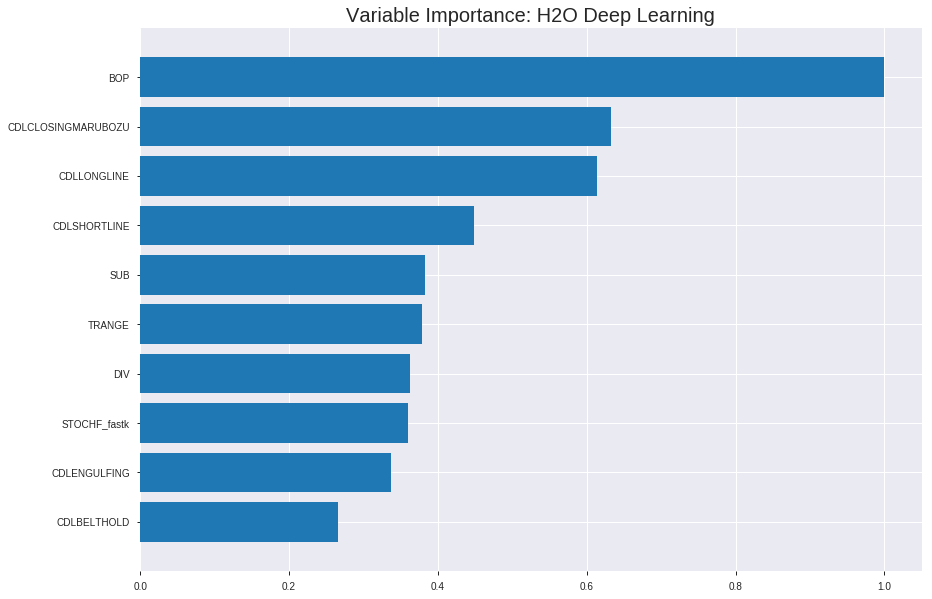

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190824_170359_model_7


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.1949166349512742
RMSE: 0.441493640895624
LogLoss: 0.5740074420132979
Mean Per-Class Error: 0.28331899695396623
AUC: 0.7784295765584109
pr_auc: 0.7576737140189347
Gini: 0.5568591531168219
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4526075278862353: 


,0,1,Error,Rate
0,1315.0,885.0,0.4023,(885.0/2200.0)
1,392.0,1727.0,0.185,(392.0/2119.0)
Total,1707.0,2612.0,0.2957,(1277.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4526075,0.7300782,232.0
max f2,0.2128194,0.8383089,338.0
max f0point5,0.5249668,0.7119875,190.0
max accuracy,0.4851655,0.7161380,212.0
max precision,0.9693669,0.9545455,4.0
max recall,0.0123331,1.0,397.0
max specificity,0.9862033,0.9995455,0.0
max absolute_mcc,0.4851655,0.4338236,212.0
max min_per_class_accuracy,0.4978123,0.7140909,205.0
max mean_per_class_accuracy,0.4851655,0.7166810,212.0


Gains/Lift Table: Avg response rate: 49.06 %, avg score: 50.80 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.9573250,1.8992557,1.8992557,0.9318182,0.9678278,0.9318182,0.9678278,0.0193487,0.0193487,89.9255652,89.9255652
,2,0.0201436,0.9353855,1.9434244,1.9210862,0.9534884,0.9456720,0.9425287,0.9568772,0.0193487,0.0386975,94.3424388,92.1086177
,3,0.0300996,0.9124671,1.8486232,1.8971177,0.9069767,0.9251213,0.9307692,0.9463733,0.0184049,0.0571024,84.8623199,89.7117653
,4,0.0400556,0.8923908,1.7064214,1.8497192,0.8372093,0.9022902,0.9075145,0.9354163,0.0169891,0.0740916,70.6421414,84.9719166
,5,0.0500116,0.8771614,1.7538220,1.8306285,0.8604651,0.8847243,0.8981481,0.9253248,0.0174611,0.0915526,75.3822009,83.0628528
,6,0.1000232,0.8063948,1.6702126,1.7504206,0.8194444,0.8383697,0.8587963,0.8818472,0.0835300,0.1750826,67.0212627,75.0420577
,7,0.1500347,0.7530592,1.6419039,1.7142484,0.8055556,0.7794841,0.8410494,0.8477262,0.0821142,0.2571968,64.1903938,71.4248364
,8,0.2000463,0.7034260,1.5381054,1.6702126,0.7546296,0.7273044,0.8194444,0.8176207,0.0769231,0.3341199,53.8105413,67.0212627
,9,0.3000695,0.6186709,1.3965620,1.5789957,0.6851852,0.6605248,0.7746914,0.7652554,0.1396885,0.4738084,39.6561970,57.8995741
,10,0.4000926,0.5417816,1.2691729,1.5015400,0.6226852,0.5784831,0.7366898,0.7185623,0.1269467,0.6007551,26.9172872,50.1540024




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.19898933865413043
RMSE: 0.44608221064522446
LogLoss: 0.5820251301940504
Mean Per-Class Error: 0.292486456222252
AUC: 0.7689645745768637
pr_auc: 0.7544469251021646
Gini: 0.5379291491537275
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3427832125703201: 


,0,1,Error,Rate
0,287.0,346.0,0.5466,(346.0/633.0)
1,68.0,533.0,0.1131,(68.0/601.0)
Total,355.0,879.0,0.3355,(414.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3427832,0.7202703,267.0
max f2,0.0914663,0.8324053,374.0
max f0point5,0.4859764,0.7112320,183.0
max accuracy,0.4760630,0.7090762,190.0
max precision,0.9843487,1.0,0.0
max recall,0.0479189,1.0,388.0
max specificity,0.9843487,1.0,0.0
max absolute_mcc,0.4760630,0.4189324,190.0
max min_per_class_accuracy,0.4540289,0.6971714,205.0
max mean_per_class_accuracy,0.4746321,0.7075135,191.0


Gains/Lift Table: Avg response rate: 48.70 %, avg score: 45.74 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.9396751,2.0532446,2.0532446,1.0,0.9616857,1.0,0.9616857,0.0216306,0.0216306,105.3244592,105.3244592
,2,0.0202593,0.9272523,1.8821409,1.9711148,0.9166667,0.9337855,0.96,0.9482936,0.0183028,0.0399334,88.2140876,97.1114809
,3,0.0299838,0.8972322,1.7110372,1.8867653,0.8333333,0.9116827,0.9189189,0.9364198,0.0166389,0.0565724,71.1037160,88.6765301
,4,0.0405186,0.8668288,1.8953027,1.8889850,0.9230769,0.8831795,0.92,0.9225773,0.0199667,0.0765391,89.5302701,88.8985025
,5,0.0502431,0.8486735,1.5399334,1.8214267,0.75,0.8568078,0.8870968,0.9098477,0.0149750,0.0915141,53.9933444,82.1426655
,6,0.1004862,0.7666160,1.7220761,1.7717514,0.8387097,0.8080373,0.8629032,0.8589425,0.0865225,0.1780366,72.2076110,77.1751382
,7,0.1499190,0.6908901,1.6829874,1.7424832,0.8196721,0.7262334,0.8486486,0.8151844,0.0831947,0.2612313,68.2987371,74.2483249
,8,0.2001621,0.6284030,1.5564919,1.6957972,0.7580645,0.6600509,0.8259109,0.7762440,0.0782030,0.3394343,55.6491868,69.5797153
,9,0.2998379,0.5292832,1.3688297,1.5871026,0.6666667,0.5782459,0.7729730,0.7104230,0.1364393,0.4758735,36.8829728,58.7102577
,10,0.4003241,0.4847752,1.3246739,1.5212298,0.6451613,0.5059060,0.7408907,0.6590868,0.1331115,0.6089850,32.4673931,52.1229799



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 17:56:40,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-24 17:56:43,15 min 13.586 sec,185 obs/sec,0.1187775,1,513.0,0.6956047,3.4241115,-0.9361444,0.5745034,0.5584094,1.3896993,0.5093772,0.6933557,3.3728162,-0.9242622,0.5780098,0.5612931,1.5794189,0.4983793
,2019-08-24 17:58:02,16 min 32.597 sec,348 obs/sec,5.9620282,48,25750.0,0.4800555,0.6514357,0.0778624,0.6572047,0.6471182,1.7602857,0.4216254,0.4831547,0.6587152,0.0656179,0.6534515,0.6369585,1.8953027,0.4157212
,2019-08-24 17:59:21,17 min 51.454 sec,359 obs/sec,12.0831211,98,52187.0,0.4575381,0.6049259,0.1623409,0.7508943,0.7325037,1.8066090,0.3410512,0.4606065,0.6130773,0.1507956,0.7443768,0.7286580,2.0532446,0.3314425
,2019-08-24 18:00:40,19 min 10.298 sec,368 obs/sec,18.4415374,150,79649.0,0.4479975,0.5864139,0.1969104,0.7687000,0.7481849,1.8529323,0.3047002,0.4601334,0.6154827,0.1525389,0.7522941,0.7426594,2.0532446,0.3192869
,2019-08-24 18:01:59,20 min 29.526 sec,374 obs/sec,24.9416532,203,107723.0,0.4450832,0.5832429,0.2073249,0.7766275,0.7534086,1.8529323,0.3060894,0.4519599,0.6048824,0.1823792,0.7643278,0.7521213,1.8953027,0.3184765
,2019-08-24 18:03:19,21 min 50.274 sec,379 obs/sec,31.5661033,257,136334.0,0.4414936,0.5740074,0.2200591,0.7784296,0.7576737,1.8992557,0.2956703,0.4460822,0.5820251,0.2035070,0.7689646,0.7544469,2.0532446,0.3354943


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0119661
CDLCLOSINGMARUBOZU,0.6330757,0.6330757,0.0075754
CDLLONGLINE,0.6135707,0.6135707,0.0073420
CDLSHORTLINE,0.4488083,0.4488083,0.0053705
SUB,0.3830330,0.3830330,0.0045834
---,---,---,---
BBANDS_lowerband_12_0_3,0.0577849,0.0577849,0.0006915
T3_8_5,0.0577152,0.0577152,0.0006906
BBANDS_lowerband_8_6_2,0.0566277,0.0566277,0.0006776
CDLHIKKAKEMOD,0.0537644,0.0537644,0.0006433



See the whole table with table.as_data_frame()


('accuracy', 0.6807131280388979)

('F1', 0.725219573400251)

('auc', 0.7343263976460698)

('logloss', 0.6629067361773555)

('mean_per_class_error', 0.32011874737284574)

('rmse', 0.4836756017436065)

('mse', 0.23394208772203984)

deeplearning prediction progress: |███████████████████████████████████████| 100%


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


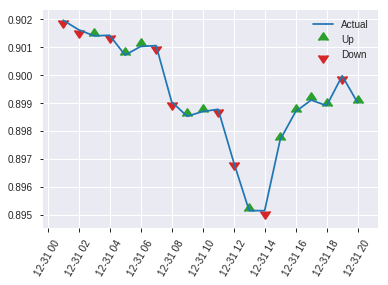


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.23394208772203984
RMSE: 0.4836756017436065
LogLoss: 0.6629067361773555
Mean Per-Class Error: 0.32011874737284574
AUC: 0.7343263976460698
pr_auc: 0.7181180346071413
Gini: 0.46865279529213955
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.19936064881349627: 


,0,1,Error,Rate
0,109.0,196.0,0.6426,(196.0/305.0)
1,23.0,289.0,0.0737,(23.0/312.0)
Total,132.0,485.0,0.3549,(219.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1993606,0.7252196,308.0
max f2,0.0830317,0.8466190,364.0
max f0point5,0.2989010,0.6784065,234.0
max accuracy,0.2989010,0.6807131,234.0
max precision,0.9005252,1.0,0.0
max recall,0.0226684,1.0,396.0
max specificity,0.9005252,1.0,0.0
max absolute_mcc,0.2989010,0.3638968,234.0
max min_per_class_accuracy,0.3296091,0.6688525,211.0
max mean_per_class_accuracy,0.2989010,0.6798813,234.0


Gains/Lift Table: Avg response rate: 50.57 %, avg score: 34.95 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8501431,1.4125458,1.4125458,0.7142857,0.8785010,0.7142857,0.8785010,0.0160256,0.0160256,41.2545788,41.2545788
,2,0.0210697,0.8118592,1.9775641,1.6733235,1.0,0.8280598,0.8461538,0.8552205,0.0192308,0.0352564,97.7564103,67.3323471
,3,0.0307942,0.7730576,1.6479701,1.6653171,0.8333333,0.7956368,0.8421053,0.8364046,0.0160256,0.0512821,64.7970085,66.5317139
,4,0.0405186,0.7523296,1.9775641,1.7402564,1.0,0.7631327,0.88,0.8188193,0.0192308,0.0705128,97.7564103,74.0256410
,5,0.0502431,0.6984189,1.9775641,1.7861869,1.0,0.7365093,0.9032258,0.8028883,0.0192308,0.0897436,97.7564103,78.6186931
,6,0.1004862,0.5801504,1.5948098,1.6904983,0.8064516,0.6365448,0.8548387,0.7197166,0.0801282,0.1698718,59.4809760,69.0498346
,7,0.1507293,0.5313880,1.3396402,1.5735456,0.6774194,0.5533989,0.7956989,0.6642773,0.0673077,0.2371795,33.9640199,57.3545630
,8,0.2009724,0.4938843,1.2758478,1.4991212,0.6451613,0.5114879,0.7580645,0.6260800,0.0641026,0.3012821,27.5847808,49.9121175
,9,0.2998379,0.4403018,1.3940206,1.4644664,0.7049180,0.4683373,0.7405405,0.5740675,0.1378205,0.4391026,39.4020597,46.4466389
,10,0.4003241,0.3823283,1.1801592,1.3931018,0.5967742,0.4095907,0.7044534,0.5327818,0.1185897,0.5576923,18.0159222,39.3101837


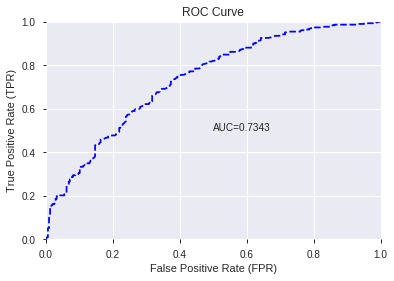

This function is available for GLM models only


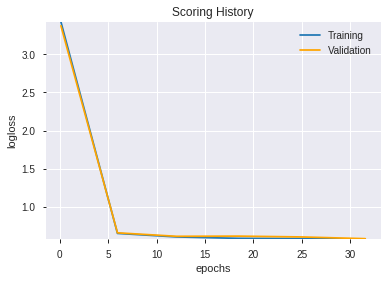

--2019-08-24 18:04:16--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.98.147
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.98.147|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190824_170359_model_7',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190824_170359_model_7',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_2_sid_ad7c',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl

In [11]:
# DeepLearning
features_list = model_train(feature_name='All',model_algo="DeepLearning")

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190824_180514_model_8,0.749953,0.589292,0.342901,0.449758,0.202282
1,DeepLearning_grid_1_AutoML_20190824_180514_model_2,0.745182,0.681751,0.350194,0.473305,0.224017
2,DeepLearning_grid_1_AutoML_20190824_180514_model_5,0.741252,0.632351,0.338167,0.462948,0.214321
3,DeepLearning_grid_1_AutoML_20190824_180514_model_9,0.740742,0.601781,0.346548,0.454612,0.206672
4,DeepLearning_grid_1_AutoML_20190824_180514_model_6,0.738031,0.615747,0.346474,0.460315,0.211890
5,DeepLearning_grid_1_AutoML_20190824_180514_model_7,0.733796,0.773913,0.341189,0.489535,0.239644
6,DeepLearning_grid_1_AutoML_20190824_180514_model_4,0.729708,0.692325,0.361192,0.481316,0.231665
7,DeepLearning_grid_1_AutoML_20190824_180514_model_3,0.728011,0.741833,0.376387,0.480239,0.230629
8,DeepLearning_1_AutoML_20190824_180514,0.727611,0.641507,0.367712,0.468510,0.219501
9,DeepLearning_grid_1_AutoML_20190824_180514_model_1,0.711055,0.913213,0.372998,0.508457,0.258528


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.044210
1,CDLCLOSINGMARUBOZU,0.735446,0.735446,0.032514
2,SUB,0.611119,0.611119,0.027017
3,HT_TRENDMODE,0.594481,0.594481,0.026282
4,aroonup_12,0.589733,0.589733,0.026072
5,DIV,0.583396,0.583396,0.025792
6,SAREXT,0.579668,0.579668,0.025627
7,CDLSHORTLINE,0.568578,0.568578,0.025137
8,TRANGE,0.565304,0.565304,0.024992
9,STOCHRSI_fastk,0.559773,0.559773,0.024747


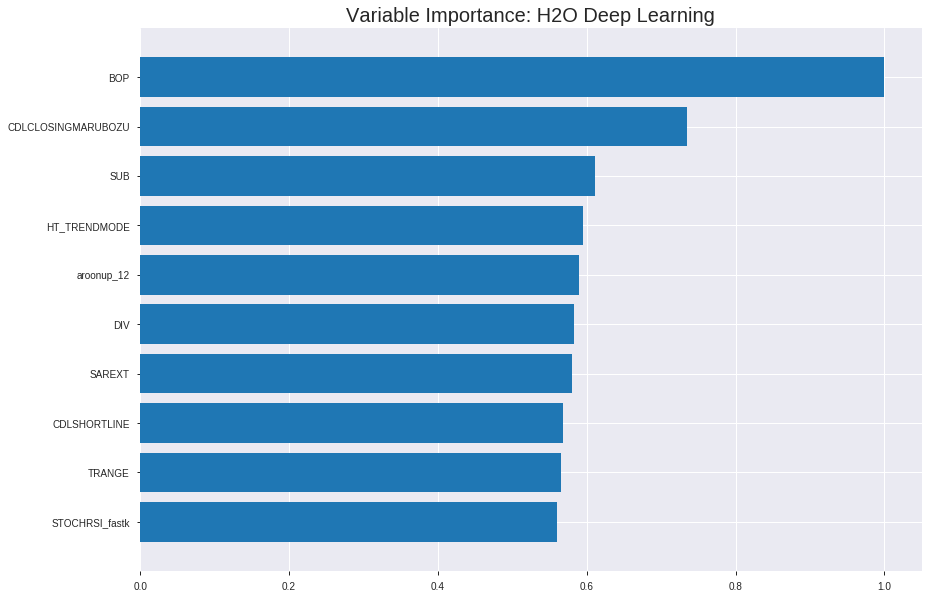

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190824_180514_model_8


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.18759668576607547
RMSE: 0.43312433060967087
LogLoss: 0.5557640862961125
Mean Per-Class Error: 0.266257561456948
AUC: 0.8027411085846669
pr_auc: 0.781992821807484
Gini: 0.6054822171693337
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.511028408179138: 


,0,1,Error,Rate
0,1380.0,820.0,0.3727,(820.0/2200.0)
1,369.0,1750.0,0.1741,(369.0/2119.0)
Total,1749.0,2570.0,0.2753,(1189.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5110284,0.7464278,213.0
max f2,0.2672907,0.8485319,318.0
max f0point5,0.6153254,0.7336190,157.0
max accuracy,0.5510920,0.7332716,192.0
max precision,0.9901180,1.0,0.0
max recall,0.0512884,1.0,393.0
max specificity,0.9901180,1.0,0.0
max absolute_mcc,0.5380748,0.4679006,199.0
max min_per_class_accuracy,0.5617945,0.7290909,186.0
max mean_per_class_accuracy,0.5510920,0.7337424,192.0


Gains/Lift Table: Avg response rate: 49.06 %, avg score: 54.86 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.9724332,1.8992557,1.8992557,0.9318182,0.9799645,0.9318182,0.9799645,0.0193487,0.0193487,89.9255652,89.9255652
,2,0.0201436,0.9539787,1.8486232,1.8742304,0.9069767,0.9632700,0.9195402,0.9717132,0.0184049,0.0377537,84.8623199,87.4230417
,3,0.0300996,0.9354227,1.9908250,1.9127963,0.9767442,0.9451139,0.9384615,0.9629150,0.0198207,0.0575743,99.0824983,91.2796312
,4,0.0400556,0.9145757,1.9434244,1.9204091,0.9534884,0.9262811,0.9421965,0.9538094,0.0193487,0.0769231,94.3424388,92.0409071
,5,0.0500116,0.8963209,1.6590208,1.8683734,0.8139535,0.9048666,0.9166667,0.9440662,0.0165172,0.0934403,65.9020819,86.8373447
,6,0.1000232,0.8351672,1.7457025,1.8070380,0.8564815,0.8660017,0.8865741,0.9050339,0.0873053,0.1807456,74.5702463,80.7037955
,7,0.1500347,0.7885563,1.5664141,1.7268300,0.7685185,0.8107911,0.8472222,0.8736197,0.0783388,0.2590845,56.6414102,72.6830004
,8,0.2000463,0.7506070,1.6041590,1.6961623,0.7870370,0.7700629,0.8321759,0.8477305,0.0802265,0.3393110,60.4159020,69.6162258
,9,0.3000695,0.6769121,1.5145148,1.6356131,0.7430556,0.7116983,0.8024691,0.8023864,0.1514866,0.4907975,51.4514839,63.5613118
,10,0.4000926,0.6105292,1.3257902,1.5581574,0.6504630,0.6439387,0.7644676,0.7627745,0.1326097,0.6234073,32.5790249,55.8157401




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.18939902101871717
RMSE: 0.4351999781924594
LogLoss: 0.5577172571668266
Mean Per-Class Error: 0.28831752240210506
AUC: 0.7869427731032796
pr_auc: 0.7825843172850442
Gini: 0.5738855462065593
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3891728177468047: 


,0,1,Error,Rate
0,321.0,312.0,0.4929,(312.0/633.0)
1,72.0,529.0,0.1198,(72.0/601.0)
Total,393.0,841.0,0.3112,(384.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3891728,0.7337032,263.0
max f2,0.2488069,0.8381254,330.0
max f0point5,0.6010629,0.7165533,144.0
max accuracy,0.5187544,0.7123177,192.0
max precision,0.9873670,1.0,0.0
max recall,0.0746803,1.0,391.0
max specificity,0.9873670,1.0,0.0
max absolute_mcc,0.5187544,0.4239856,192.0
max min_per_class_accuracy,0.5075284,0.7054908,200.0
max mean_per_class_accuracy,0.5187544,0.7116825,192.0


Gains/Lift Table: Avg response rate: 48.70 %, avg score: 50.19 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.9625774,2.0532446,2.0532446,1.0,0.9716067,1.0,0.9716067,0.0216306,0.0216306,105.3244592,105.3244592
,2,0.0202593,0.9508096,2.0532446,2.0532446,1.0,0.9572298,1.0,0.9647058,0.0199667,0.0415973,105.3244592,105.3244592
,3,0.0299838,0.9289216,1.8821409,1.9977515,0.9166667,0.9407536,0.9729730,0.9569375,0.0183028,0.0599002,88.2140876,99.7751495
,4,0.0405186,0.8985384,1.8953027,1.9711148,0.9230769,0.9163449,0.96,0.9463834,0.0199667,0.0798669,89.5302701,97.1114809
,5,0.0502431,0.8809795,2.0532446,1.9870109,1.0,0.8891745,0.9677419,0.9353107,0.0199667,0.0998336,105.3244592,98.7010896
,6,0.1004862,0.7865264,1.8545435,1.9207772,0.9032258,0.8294545,0.9354839,0.8823826,0.0931780,0.1930116,85.4543503,92.0777199
,7,0.1499190,0.7360917,1.6493276,1.8312722,0.8032787,0.7605467,0.8918919,0.8422097,0.0815308,0.2745424,64.9327623,83.1272204
,8,0.2001621,0.6929635,1.4902582,1.7456735,0.7258065,0.7152782,0.8502024,0.8103483,0.0748752,0.3494176,49.0258172,74.5673540
,9,0.2998379,0.6186148,1.4189089,1.6370464,0.6910569,0.6541735,0.7972973,0.7584308,0.1414309,0.4908486,41.8908865,63.7046364
,10,0.4003241,0.5583114,1.1094144,1.5046043,0.5403226,0.5856994,0.7327935,0.7150731,0.1114809,0.6023295,10.9414417,50.4604337



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 18:18:28,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-24 18:18:30,4 min 4.261 sec,452 obs/sec,0.2495948,1,1078.0,0.5195297,0.7911020,-0.0800242,0.7379558,0.7142917,1.9455790,0.3503126,0.5296220,0.8338731,-0.1227530,0.7333841,0.7154929,1.8953027,0.3500810
,2019-08-24 18:19:13,4 min 46.890 sec,926 obs/sec,8.8576059,34,38256.0,0.4328700,0.5554337,0.2502305,0.7896101,0.7656878,1.9455790,0.3023848,0.4373058,0.5630543,0.2345399,0.7832772,0.7823058,2.0532446,0.3282010
,2019-08-24 18:19:51,5 min 24.676 sec,1062 obs/sec,18.5454966,71,80098.0,0.4331243,0.5557641,0.2493492,0.8027411,0.7819928,1.8992557,0.2752952,0.4352000,0.5577173,0.2418941,0.7869428,0.7825843,2.0532446,0.3111831
,2019-08-24 18:20:28,6 min 1.811 sec,1141 obs/sec,28.7851354,110,124323.0,0.4262595,0.5378218,0.2729557,0.8135762,0.8002187,1.9919023,0.2757583,0.4396331,0.5703609,0.2263708,0.7809667,0.7686253,1.8953027,0.3273906
,2019-08-24 18:21:05,6 min 38.197 sec,1189 obs/sec,38.9687428,149,168306.0,0.4154957,0.5190321,0.3092105,0.8334994,0.8225297,2.0382256,0.2565409,0.4431953,0.5744301,0.2137830,0.7742349,0.7583626,1.8953027,0.3282010
,2019-08-24 18:21:42,7 min 15.608 sec,1222 obs/sec,49.6137995,190,214282.0,0.4021508,0.4850195,0.3528714,0.8465857,0.8304218,2.0382256,0.2486687,0.4448704,0.5832560,0.2078285,0.7729167,0.7612799,2.0532446,0.3273906
,2019-08-24 18:22:19,7 min 53.069 sec,1247 obs/sec,60.4021764,231,260877.0,0.3910280,0.4610579,0.3881733,0.8625396,0.8449408,2.0382256,0.2380181,0.4544968,0.6118478,0.1731745,0.7570413,0.7390948,1.8953027,0.3379254
,2019-08-24 18:22:23,7 min 57.015 sec,1247 obs/sec,60.4021764,231,260877.0,0.4331243,0.5557641,0.2493492,0.8027411,0.7819928,1.8992557,0.2752952,0.4352000,0.5577173,0.2418941,0.7869428,0.7825843,2.0532446,0.3111831


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0442097
CDLCLOSINGMARUBOZU,0.7354457,0.7354457,0.0325138
SUB,0.6111191,0.6111191,0.0270174
HT_TRENDMODE,0.5944812,0.5944812,0.0262818
aroonup_12,0.5897325,0.5897325,0.0260719
---,---,---,---
CDLTAKURI,0.3220808,0.3220808,0.0142391
CORREL_20,0.3203771,0.3203771,0.0141638
CDLHANGINGMAN,0.3181843,0.3181843,0.0140668
is_month_end,0.3157123,0.3157123,0.0139575



See the whole table with table.as_data_frame()


('accuracy', 0.6839546191247974)

('F1', 0.7236842105263157)

('auc', 0.7499527112232031)

('logloss', 0.5892921561940334)

('mean_per_class_error', 0.316104455653636)

('rmse', 0.4497580984813553)

('mse', 0.2022823471495645)

deeplearning prediction progress: |███████████████████████████████████████| 100%


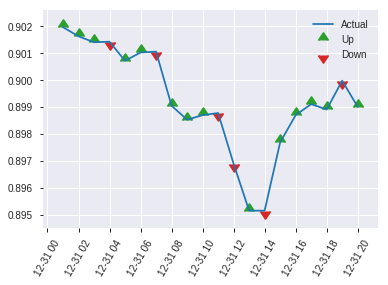


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.2022823471495645
RMSE: 0.4497580984813553
LogLoss: 0.5892921561940334
Mean Per-Class Error: 0.316104455653636
AUC: 0.7499527112232031
pr_auc: 0.7480043584305819
Gini: 0.4999054224464061
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.33820616199259146: 


,0,1,Error,Rate
0,132.0,173.0,0.5672,(173.0/305.0)
1,37.0,275.0,0.1186,(37.0/312.0)
Total,169.0,448.0,0.3404,(210.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3382062,0.7236842,288.0
max f2,0.1734019,0.8503589,361.0
max f0point5,0.5186506,0.6878492,190.0
max accuracy,0.4897088,0.6839546,210.0
max precision,0.9848726,1.0,0.0
max recall,0.0498310,1.0,396.0
max specificity,0.9848726,1.0,0.0
max absolute_mcc,0.4026535,0.3719625,256.0
max min_per_class_accuracy,0.4949920,0.6819672,208.0
max mean_per_class_accuracy,0.4897088,0.6838955,210.0


Gains/Lift Table: Avg response rate: 50.57 %, avg score: 48.68 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.9598685,1.9775641,1.9775641,1.0,0.9731386,1.0,0.9731386,0.0224359,0.0224359,97.7564103,97.7564103
,2,0.0210697,0.9495631,1.9775641,1.9775641,1.0,0.9548184,1.0,0.9646831,0.0192308,0.0416667,97.7564103,97.7564103
,3,0.0307942,0.9119607,0.9887821,1.6653171,0.5,0.9296324,0.8421053,0.9536145,0.0096154,0.0512821,-1.1217949,66.5317139
,4,0.0405186,0.8970889,1.9775641,1.7402564,1.0,0.9057713,0.88,0.9421321,0.0192308,0.0705128,97.7564103,74.0256410
,5,0.0502431,0.8737590,1.9775641,1.7861869,1.0,0.8888306,0.9032258,0.9318157,0.0192308,0.0897436,97.7564103,78.6186931
,6,0.1004862,0.7773855,1.7223945,1.7542907,0.8709677,0.8199179,0.8870968,0.8758668,0.0865385,0.1762821,72.2394541,75.4290736
,7,0.1507293,0.7207398,1.4672250,1.6586022,0.7419355,0.7499933,0.8387097,0.8339090,0.0737179,0.25,46.7224979,65.8602151
,8,0.2009724,0.6727479,1.8499793,1.7064464,0.9354839,0.6952220,0.8629032,0.7992372,0.0929487,0.3429487,84.9979322,70.6446443
,9,0.2998379,0.6022948,1.1670870,1.5286036,0.5901639,0.6322676,0.7729730,0.7441824,0.1153846,0.4583333,16.7087011,52.8603604
,10,0.4003241,0.5399587,0.9249897,1.3770892,0.4677419,0.5687022,0.6963563,0.7001347,0.0929487,0.5512821,-7.5010339,37.7089173


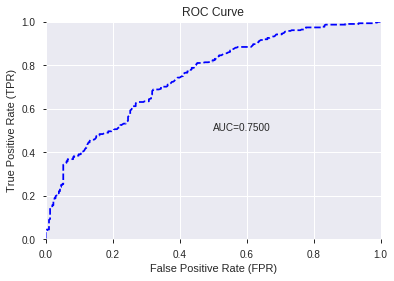

This function is available for GLM models only


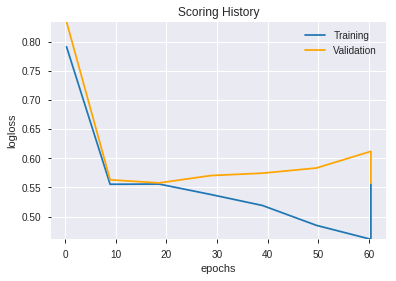

--2019-08-24 18:29:57--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.9.203
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.9.203|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190824_180514_model_8',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190824_180514_model_8',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_10_sid_ad7c',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'CDLCLOSINGMARUBOZU',
 'SUB',
 'HT_TRENDMODE',
 'aroonup_12',
 'DIV',
 'SAREXT',
 'CDLSHORTLINE',
 'TRANGE',
 'STOCHRSI_fastk',
 'CDLLONGLINE',
 'Volume',
 'ULTOSC',
 'aroonup_24',
 'STOCH_slowd',
 'quarter',
 'aroondown_30',
 'aroondown_24',
 'STOCHF_fastk',
 'ATR_8',
 'CDLSPINNINGTOP',
 'MFI_8',
 'CDLHARAMI',
 'aroondown_8',
 'NATR_8',
 'CCI_8',
 'MINUS_DI_8',
 'WILLR_30',
 'AROONOSC_8',
 'WILLR_12',
 'CDLENGULFING',
 'ADOSC',
 'CORREL_24',
 'CDLBELTHOLD',
 'WILLR_8',
 'CCI_14',
 'CDLMARUBOZU',
 'PLUS_DM_8',
 'WILLR_20',
 'PLUS_DI_8',
 'WILLR_14',
 'is_month_start',
 'CDLHAMMER',
 'CDLHIKKAKE',
 'RSI_8',
 'CDLTAKURI',
 'CORREL_20',
 'CDLHANGINGMAN',
 'is_month_end',
 'CDLDRAGONFLYDOJI']

In [12]:
# DeepLearning with top DeepLearning features
model_train(feature_name='DLF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190824_183055_model_1,0.745245,0.616868,0.36167,0.459749,0.211369


,variable,relative_importance,scaled_importance,percentage
0,SUB,2.019363,1.000000,0.192419
1,DIV,1.617843,0.801165,0.154159
2,BOP,0.849559,0.420706,0.080952
3,ATR_8,0.647895,0.320841,0.061736
4,NATR_8,0.417165,0.206583,0.039750
5,PLUS_DI_8,0.349141,0.172896,0.033269
6,PLUS_DM_8,0.329650,0.163245,0.031411
7,STOCHF_fastk,0.302257,0.149680,0.028801
8,STOCH_slowd,0.277344,0.137343,0.026427
9,RSI_8,0.235442,0.116592,0.022434


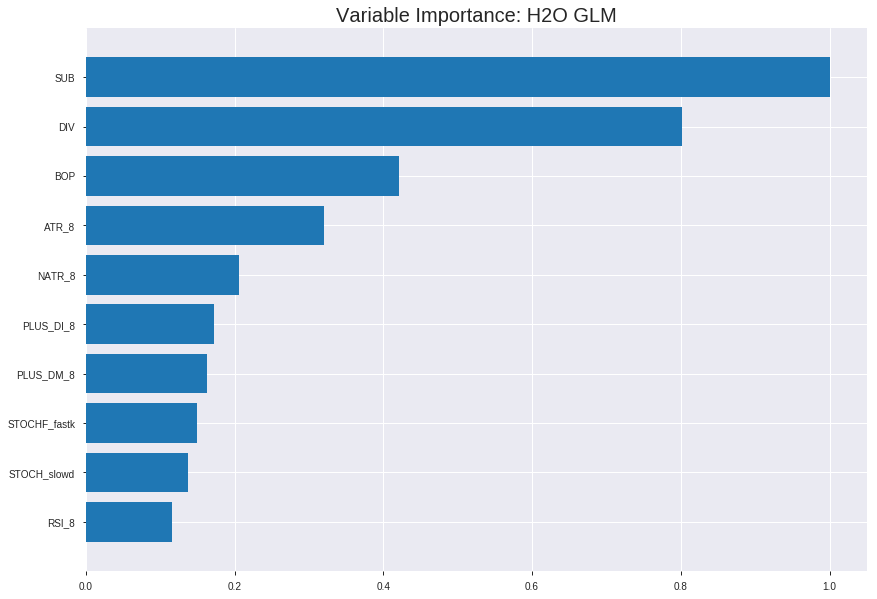

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190824_183055_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.18949243543363686
RMSE: 0.4353072885142596
LogLoss: 0.560485338970126
Null degrees of freedom: 4318
Residual degrees of freedom: 4268
Null deviance: 5985.886154969303
Residual deviance: 4841.472358023947
AIC: 4943.472358023947
AUC: 0.7839025698228153
pr_auc: 0.7635608581761156
Gini: 0.5678051396456305
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4049511475373628: 


,0,1,Error,Rate
0,1275.0,925.0,0.4205,(925.0/2200.0)
1,361.0,1758.0,0.1704,(361.0/2119.0)
Total,1636.0,2683.0,0.2978,(1286.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4049511,0.7321949,241.0
max f2,0.2514700,0.8404068,308.0
max f0point5,0.5386026,0.7181463,176.0
max accuracy,0.5353351,0.7184533,178.0
max precision,0.9826976,1.0,0.0
max recall,0.0304304,1.0,393.0
max specificity,0.9826976,1.0,0.0
max absolute_mcc,0.5353351,0.4368518,178.0
max min_per_class_accuracy,0.5069695,0.7159091,191.0
max mean_per_class_accuracy,0.5353351,0.7177983,178.0


Gains/Lift Table: Avg response rate: 49.06 %, avg score: 49.06 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.9262284,1.9455790,1.9455790,0.9545455,0.9430715,0.9545455,0.9430715,0.0198207,0.0198207,94.5578961,94.5578961
,2,0.0201436,0.8994581,1.9908250,1.9679419,0.9767442,0.9119273,0.9655172,0.9276784,0.0198207,0.0396413,99.0824983,96.7941937
,3,0.0300996,0.8783669,1.7538220,1.8971177,0.8604651,0.8895941,0.9307692,0.9150813,0.0174611,0.0571024,75.3822009,89.7117653
,4,0.0400556,0.8662603,1.8486232,1.8850641,0.9069767,0.8718331,0.9248555,0.9043317,0.0184049,0.0755073,84.8623199,88.5064118
,5,0.0500116,0.8557866,1.7064214,1.8495010,0.8372093,0.8607771,0.9074074,0.8956611,0.0169891,0.0924965,70.6421414,84.9500988
,6,0.1000232,0.8089078,1.6135952,1.7315481,0.7916667,0.8311366,0.8495370,0.8633989,0.0806984,0.1731949,61.3595249,73.1548118
,7,0.1500347,0.7701288,1.6419039,1.7016667,0.8055556,0.7883075,0.8348765,0.8383684,0.0821142,0.2553091,64.1903938,70.1666725
,8,0.2000463,0.7345036,1.5758503,1.6702126,0.7731481,0.7524967,0.8194444,0.8169005,0.0788108,0.3341199,57.5850331,67.0212627
,9,0.3000695,0.6635662,1.4484612,1.5962955,0.7106481,0.6992426,0.7831790,0.7776812,0.1448797,0.4789995,44.8461233,59.6295495
,10,0.4000926,0.5825416,1.3069178,1.5239511,0.6412037,0.6247195,0.7476852,0.7394408,0.1307220,0.6097216,30.6917790,52.3951069




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.19386912945674506
RMSE: 0.44030572271632473
LogLoss: 0.5724828002488458
Null degrees of freedom: 1233
Residual degrees of freedom: 1183
Null deviance: 1709.9209284159656
Residual deviance: 1412.8875510141518
AIC: 1514.8875510141518
AUC: 0.7761366653260889
pr_auc: 0.7724217746827511
Gini: 0.5522733306521779
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.38544571607578515: 


,0,1,Error,Rate
0,388.0,245.0,0.387,(245.0/633.0)
1,124.0,477.0,0.2063,(124.0/601.0)
Total,512.0,722.0,0.299,(369.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3854457,0.7210884,235.0
max f2,0.0973320,0.8380441,361.0
max f0point5,0.5547334,0.7113738,159.0
max accuracy,0.4948957,0.7115073,185.0
max precision,0.9644462,1.0,0.0
max recall,0.0140442,1.0,396.0
max specificity,0.9644462,1.0,0.0
max absolute_mcc,0.4948957,0.4228080,185.0
max min_per_class_accuracy,0.4601951,0.7030016,201.0
max mean_per_class_accuracy,0.4909119,0.7104720,187.0


Gains/Lift Table: Avg response rate: 48.70 %, avg score: 44.90 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.9267990,2.0532446,2.0532446,1.0,0.9441451,1.0,0.9441451,0.0216306,0.0216306,105.3244592,105.3244592
,2,0.0202593,0.8950191,1.8821409,1.9711148,0.9166667,0.9089651,0.96,0.9272587,0.0183028,0.0399334,88.2140876,97.1114809
,3,0.0299838,0.8612280,1.8821409,1.9422584,0.9166667,0.8763231,0.9459459,0.9107390,0.0183028,0.0582363,88.2140876,94.2258398
,4,0.0405186,0.8482650,2.0532446,1.9711148,1.0,0.8546321,0.96,0.8961512,0.0216306,0.0798669,105.3244592,97.1114809
,5,0.0502431,0.8379386,1.7110372,1.9207772,0.8333333,0.8439446,0.9354839,0.8860467,0.0166389,0.0965058,71.1037160,92.0777199
,6,0.1004862,0.7755241,1.8876604,1.9042188,0.9193548,0.8046334,0.9274194,0.8453400,0.0948419,0.1913478,88.7660351,90.4218775
,7,0.1499190,0.7347995,1.7166471,1.8423708,0.8360656,0.7566476,0.8972973,0.8160955,0.0848586,0.2762063,71.6647118,84.2370823
,8,0.2001621,0.6858837,1.3577908,1.7207353,0.6612903,0.7088764,0.8380567,0.7891822,0.0682196,0.3444260,35.7790779,72.0735347
,9,0.2998379,0.6000521,1.3688297,1.6037505,0.6666667,0.6430276,0.7810811,0.7405957,0.1364393,0.4808652,36.8829728,60.3750506
,10,0.4003241,0.5317297,1.2253234,1.5087607,0.5967742,0.5684983,0.7348178,0.6973971,0.1231281,0.6039933,22.5323386,50.8760702



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-24 18:30:56,0.000 sec,2,.21E2,51,1.3664831,1.3670820
,2019-08-24 18:30:56,0.064 sec,4,.13E2,51,1.3565900,1.3575617
,2019-08-24 18:30:56,0.109 sec,6,.8E1,51,1.3429044,1.3443215
,2019-08-24 18:30:56,0.178 sec,8,.5E1,51,1.3250034,1.3269028
,2019-08-24 18:30:56,0.240 sec,10,.31E1,51,1.3030055,1.3054153
---,---,---,---,---,---,---,---
,2019-08-24 18:30:57,1.087 sec,45,.14E-3,51,1.1214317,1.1485558
,2019-08-24 18:30:57,1.119 sec,46,.87E-4,51,1.1213169,1.1475548
,2019-08-24 18:30:57,1.153 sec,47,.54E-4,51,1.1212011,1.1465989
,2019-08-24 18:30:57,1.176 sec,48,.34E-4,51,1.1210853,1.1457384



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6758508914100486)

('F1', 0.7274969173859432)

('auc', 0.7452448507776376)

('logloss', 0.6168684338039258)

('mean_per_class_error', 0.324963219840269)

('rmse', 0.4597485588762724)

('mse', 0.21136873738880935)

glm prediction progress: |████████████████████████████████████████████████| 100%


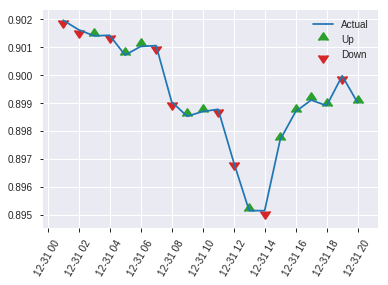


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.21136873738880935
RMSE: 0.4597485588762724
LogLoss: 0.6168684338039258
Null degrees of freedom: 616
Residual degrees of freedom: 566
Null deviance: 855.8232650727789
Residual deviance: 761.2156473140444
AIC: 863.2156473140444
AUC: 0.7452448507776376
pr_auc: 0.746755087842882
Gini: 0.49048970155527516
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.17224208602025626: 


,0,1,Error,Rate
0,101.0,204.0,0.6689,(204.0/305.0)
1,17.0,295.0,0.0545,(17.0/312.0)
Total,118.0,499.0,0.3582,(221.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1722421,0.7274969,326.0
max f2,0.0986279,0.8472222,358.0
max f0point5,0.5262177,0.6885246,158.0
max accuracy,0.3704480,0.6758509,234.0
max precision,0.9553320,1.0,0.0
max recall,0.0059657,1.0,398.0
max specificity,0.9553320,1.0,0.0
max absolute_mcc,0.3131287,0.3621720,257.0
max min_per_class_accuracy,0.4282450,0.6590164,205.0
max mean_per_class_accuracy,0.3704480,0.6750368,234.0


Gains/Lift Table: Avg response rate: 50.57 %, avg score: 42.68 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.9142321,1.9775641,1.9775641,1.0,0.9301793,1.0,0.9301793,0.0224359,0.0224359,97.7564103,97.7564103
,2,0.0210697,0.8828575,1.3183761,1.6733235,0.6666667,0.8990885,0.8461538,0.9158297,0.0128205,0.0352564,31.8376068,67.3323471
,3,0.0307942,0.8444247,1.9775641,1.7693995,1.0,0.8575882,0.8947368,0.8974376,0.0192308,0.0544872,97.7564103,76.9399460
,4,0.0405186,0.8280123,1.9775641,1.8193590,1.0,0.8361848,0.92,0.8827370,0.0192308,0.0737179,97.7564103,81.9358974
,5,0.0502431,0.8166270,1.9775641,1.8499793,1.0,0.8233576,0.9354839,0.8712442,0.0192308,0.0929487,97.7564103,84.9979322
,6,0.1004862,0.7626635,1.7861869,1.8180831,0.9032258,0.7925524,0.9193548,0.8318983,0.0897436,0.1826923,78.6186931,81.8083127
,7,0.1507293,0.7207605,1.4672250,1.7011304,0.7419355,0.7388255,0.8602151,0.8008740,0.0737179,0.2564103,46.7224979,70.1130411
,8,0.2009724,0.6572766,1.4672250,1.6426541,0.7419355,0.6903624,0.8306452,0.7732461,0.0737179,0.3301282,46.7224979,64.2654053
,9,0.2998379,0.5777158,1.1022488,1.4644664,0.5573770,0.6189130,0.7405405,0.7223579,0.1089744,0.4391026,10.2248844,46.4466389
,10,0.4003241,0.5044391,1.3077440,1.4251272,0.6612903,0.5410716,0.7206478,0.6768528,0.1314103,0.5705128,30.7744003,42.5127167


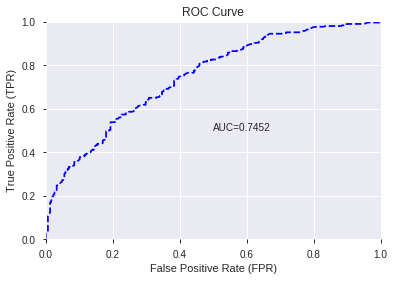

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


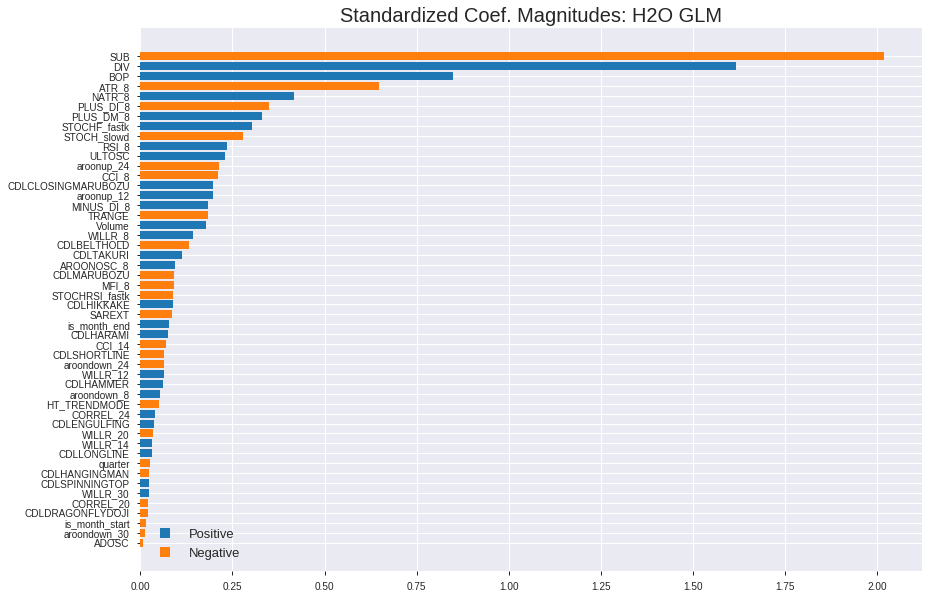

'log_likelihood'
--2019-08-24 18:31:07--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.205.171
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.205.171|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190824_183055_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190824_183055_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_18_sid_ad7c',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_18_s

['SUB',
 'DIV',
 'BOP',
 'ATR_8',
 'NATR_8',
 'PLUS_DI_8',
 'PLUS_DM_8',
 'STOCHF_fastk',
 'STOCH_slowd',
 'RSI_8',
 'ULTOSC',
 'aroonup_24',
 'CCI_8',
 'CDLCLOSINGMARUBOZU',
 'aroonup_12',
 'MINUS_DI_8',
 'TRANGE',
 'Volume',
 'WILLR_8',
 'CDLBELTHOLD',
 'CDLTAKURI',
 'AROONOSC_8',
 'CDLMARUBOZU',
 'MFI_8',
 'STOCHRSI_fastk',
 'CDLHIKKAKE',
 'SAREXT',
 'is_month_end',
 'CDLHARAMI',
 'CCI_14',
 'CDLSHORTLINE',
 'aroondown_24',
 'WILLR_12',
 'CDLHAMMER',
 'aroondown_8',
 'HT_TRENDMODE',
 'CORREL_24',
 'CDLENGULFING',
 'WILLR_20',
 'WILLR_14',
 'CDLLONGLINE',
 'quarter',
 'CDLHANGINGMAN',
 'CDLSPINNINGTOP',
 'WILLR_30',
 'CORREL_20',
 'CDLDRAGONFLYDOJI',
 'is_month_start',
 'aroondown_30',
 'ADOSC']

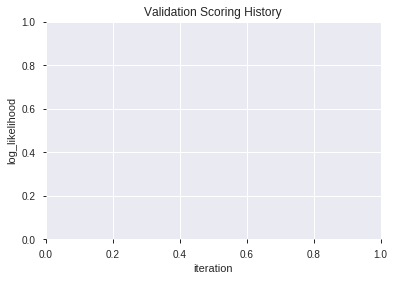

In [13]:
# GLM with top DeepLearning features
model_train(feature_name='DLF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_2_AutoML_20190824_183204,0.758423,0.599968,0.346401,0.453312,0.205492
1,XGBoost_1_AutoML_20190824_183204,0.756941,0.603700,0.284311,0.455734,0.207693
2,XGBoost_grid_1_AutoML_20190824_183204_model_2,0.754393,0.599509,0.333065,0.454031,0.206144
3,XGBoost_grid_1_AutoML_20190824_183204_model_1,0.751597,0.601535,0.321443,0.454382,0.206463
4,XGBoost_grid_1_AutoML_20190824_183204_model_3,0.751235,0.603847,0.329456,0.455415,0.207402
5,XGBoost_grid_1_AutoML_20190824_183204_model_7,0.749974,0.607930,0.328037,0.458003,0.209767
6,XGBoost_grid_1_AutoML_20190824_183204_model_4,0.749743,0.604198,0.322714,0.455920,0.207863
7,XGBoost_grid_1_AutoML_20190824_183204_model_6,0.749590,0.603244,0.336197,0.455388,0.207378
8,XGBoost_3_AutoML_20190824_183204,0.748550,0.603168,0.353105,0.456047,0.207979
9,XGBoost_grid_1_AutoML_20190824_183204_model_5,0.746243,0.619405,0.354745,0.461225,0.212728


,variable,relative_importance,scaled_importance,percentage
0,BOP,4917.768555,1.000000,0.245570
1,STOCHF_fastk,1316.057495,0.267613,0.065718
2,DIV,943.414246,0.191838,0.047110
3,CCI_8,834.834839,0.169759,0.041688
4,TRANGE,801.906555,0.163063,0.040043
5,STOCHRSI_fastk,780.783264,0.158768,0.038989
6,STOCH_slowd,654.284119,0.133045,0.032672
7,Volume,599.846130,0.121975,0.029953
8,CCI_14,556.645935,0.113191,0.027796
9,SAREXT,545.629578,0.110951,0.027246


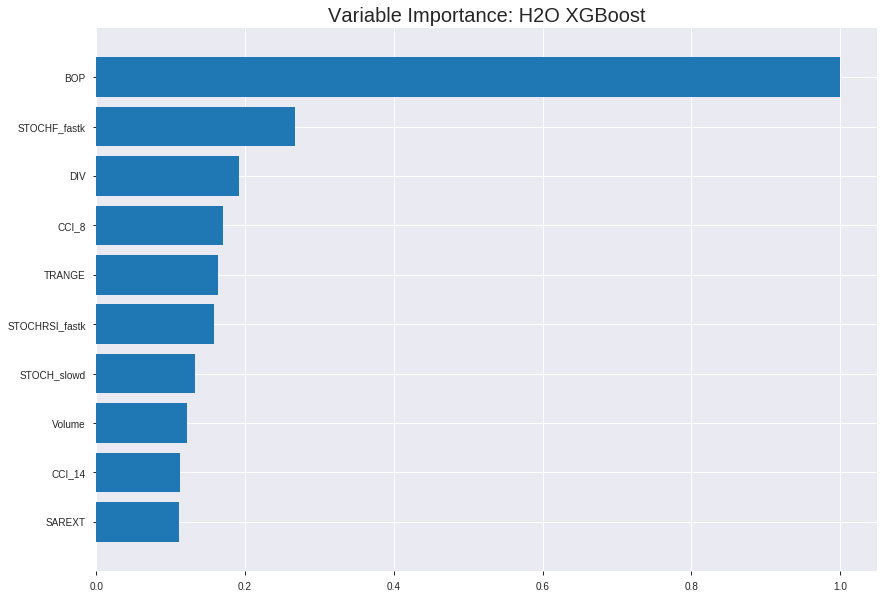

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_2_AutoML_20190824_183204


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.13268132696422769
RMSE: 0.36425448104893327
LogLoss: 0.427419675902129
Mean Per-Class Error: 0.16408876399673944
AUC: 0.9124724355399202
pr_auc: 0.9112291628707391
Gini: 0.8249448710798404
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5077677137321897: 


,0,1,Error,Rate
0,1858.0,342.0,0.1555,(342.0/2200.0)
1,366.0,1753.0,0.1727,(366.0/2119.0)
Total,2224.0,2095.0,0.1639,(708.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5077677,0.8319886,192.0
max f2,0.3229272,0.8910761,274.0
max f0point5,0.6089030,0.8476333,150.0
max accuracy,0.5077677,0.8360732,192.0
max precision,0.9579276,1.0,0.0
max recall,0.0855221,1.0,383.0
max specificity,0.9579276,1.0,0.0
max absolute_mcc,0.5077677,0.6720041,192.0
max min_per_class_accuracy,0.5021926,0.8319962,194.0
max mean_per_class_accuracy,0.5077677,0.8359112,192.0


Gains/Lift Table: Avg response rate: 49.06 %, avg score: 49.10 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.9236206,2.0382256,2.0382256,1.0,0.9361261,1.0,0.9361261,0.0207645,0.0207645,103.8225578,103.8225578
,2,0.0201436,0.9038097,2.0382256,2.0382256,1.0,0.9125657,1.0,0.9244813,0.0202926,0.0410571,103.8225578,103.8225578
,3,0.0300996,0.8929217,2.0382256,2.0382256,1.0,0.8984972,1.0,0.9158866,0.0202926,0.0613497,103.8225578,103.8225578
,4,0.0400556,0.8823690,1.9908250,2.0264439,0.9767442,0.8868787,0.9942197,0.9086765,0.0198207,0.0811704,99.0824983,102.6443927
,5,0.0500116,0.8730941,1.9908250,2.0193531,0.9767442,0.8775910,0.9907407,0.9024882,0.0198207,0.1009910,99.0824983,101.9353119
,6,0.1000232,0.8290467,1.9910444,2.0051988,0.9768519,0.8503464,0.9837963,0.8764173,0.0995753,0.2005663,99.1044430,100.5198775
,7,0.1500347,0.7955138,1.9816082,1.9973353,0.9722222,0.8120103,0.9799383,0.8549483,0.0991034,0.2996697,98.1608201,99.7335250
,8,0.2000463,0.7562149,1.9249908,1.9792491,0.9444444,0.7767333,0.9710648,0.8353945,0.0962718,0.3959415,92.4990824,97.9249144
,9,0.3000695,0.6770381,1.7504206,1.9029730,0.8587963,0.7176276,0.9336420,0.7961389,0.1750826,0.5710241,75.0420577,90.2972955
,10,0.4000926,0.5905962,1.5050786,1.8034994,0.7384259,0.6344342,0.8848380,0.7557127,0.1505427,0.7215668,50.5078610,80.3499369




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.19303542182427583
RMSE: 0.4393579654726608
LogLoss: 0.5663138993738035
Mean Per-Class Error: 0.291561194743884
AUC: 0.775334947283753
pr_auc: 0.7686079044380343
Gini: 0.5506698945675059
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36725615710020065: 


,0,1,Error,Rate
0,369.0,264.0,0.4171,(264.0/633.0)
1,112.0,489.0,0.1864,(112.0/601.0)
Total,481.0,753.0,0.3047,(376.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3672562,0.7223043,255.0
max f2,0.1565804,0.8421656,351.0
max f0point5,0.5735349,0.7096644,162.0
max accuracy,0.4962491,0.7090762,200.0
max precision,0.9559764,1.0,0.0
max recall,0.0704365,1.0,388.0
max specificity,0.9559764,1.0,0.0
max absolute_mcc,0.4962491,0.4174888,200.0
max min_per_class_accuracy,0.4685157,0.7038270,210.0
max mean_per_class_accuracy,0.4962491,0.7084388,200.0


Gains/Lift Table: Avg response rate: 48.70 %, avg score: 46.69 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.9232136,2.0532446,2.0532446,1.0,0.9334803,1.0,0.9334803,0.0216306,0.0216306,105.3244592,105.3244592
,2,0.0202593,0.8996070,2.0532446,2.0532446,1.0,0.9103335,1.0,0.9223698,0.0199667,0.0415973,105.3244592,105.3244592
,3,0.0299838,0.8791759,1.8821409,1.9977515,0.9166667,0.8903197,0.9729730,0.9119752,0.0183028,0.0599002,88.2140876,99.7751495
,4,0.0405186,0.8603572,1.8953027,1.9711148,0.9230769,0.8703689,0.96,0.9011576,0.0199667,0.0798669,89.5302701,97.1114809
,5,0.0502431,0.8518207,2.0532446,1.9870109,1.0,0.8558970,0.9677419,0.8923975,0.0199667,0.0998336,105.3244592,98.7010896
,6,0.1004862,0.7884393,1.7551930,1.8711019,0.8548387,0.8194717,0.9112903,0.8559346,0.0881864,0.1880200,75.5192958,87.1101927
,7,0.1499190,0.7503700,1.4137094,1.7202860,0.6885246,0.7693665,0.8378378,0.8273905,0.0698835,0.2579035,41.3709391,72.0286010
,8,0.2001621,0.7100261,1.5896087,1.6874844,0.7741935,0.7306670,0.8218623,0.8031117,0.0798669,0.3377704,58.9608717,68.7484422
,9,0.2998379,0.6355606,1.4356019,1.6037505,0.6991870,0.6744996,0.7810811,0.7603569,0.1430948,0.4808652,43.5601910,60.3750506
,10,0.4003241,0.5558979,1.2087650,1.5046043,0.5887097,0.5972148,0.7327935,0.7194062,0.1214642,0.6023295,20.8764962,50.4604337



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 18:32:09,0.004 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5093772,0.5,0.6931472,0.5,0.0,1.0,0.5129660
,2019-08-24 18:32:09,0.172 sec,5.0,0.4728452,0.6399732,0.8235942,0.8131419,1.9919023,0.2769160,0.4792538,0.6522601,0.7560582,0.7379547,2.0532446,0.3087520
,2019-08-24 18:32:09,0.306 sec,10.0,0.4528640,0.6015416,0.8361497,0.8310978,2.0382256,0.2681176,0.4649926,0.6242387,0.7648416,0.7528417,2.0532446,0.3055105
,2019-08-24 18:32:10,0.449 sec,15.0,0.4380745,0.5729607,0.8472772,0.8419194,2.0382256,0.2681176,0.4573398,0.6086781,0.7648574,0.7555272,2.0532446,0.3022690
,2019-08-24 18:32:10,0.582 sec,20.0,0.4263143,0.5499085,0.8548286,0.8504867,2.0382256,0.2556147,0.4512846,0.5959146,0.7683298,0.7615661,2.0532446,0.3022690
,2019-08-24 18:32:10,0.729 sec,25.0,0.4170374,0.5315522,0.8620422,0.8572468,2.0382256,0.2264413,0.4476636,0.5877521,0.7692721,0.7581080,2.0532446,0.3038898
,2019-08-24 18:32:10,0.870 sec,30.0,0.4087175,0.5147735,0.8685023,0.8622810,2.0382256,0.2269044,0.4451489,0.5815108,0.7693575,0.7569533,2.0532446,0.3119935
,2019-08-24 18:32:10,1.009 sec,35.0,0.4019216,0.5009988,0.8739554,0.8696621,2.0382256,0.2218106,0.4432864,0.5768922,0.7707362,0.7607986,2.0532446,0.3022690
,2019-08-24 18:32:10,1.203 sec,40.0,0.3959181,0.4889976,0.8801458,0.8762519,2.0382256,0.2137069,0.4420102,0.5737835,0.7719782,0.7604312,2.0532446,0.3192869
,2019-08-24 18:32:10,1.369 sec,45.0,0.3907289,0.4783408,0.8840164,0.8805865,2.0382256,0.2076870,0.4418707,0.5728792,0.7708861,0.7634388,2.0532446,0.3192869


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,4917.7685547,1.0,0.2455703
STOCHF_fastk,1316.0574951,0.2676127,0.0657177
DIV,943.4142456,0.1918379,0.0471097
CCI_8,834.8348389,0.1697589,0.0416877
TRANGE,801.9065552,0.1630631,0.0400434
---,---,---,---
CDLSPINNINGTOP,37.1203079,0.0075482,0.0018536
CDLHAMMER,24.3263016,0.0049466,0.0012147
CDLTAKURI,18.7826309,0.0038193,0.0009379
CDLBELTHOLD,17.7470589,0.0036088,0.0008862



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6985413290113452)

('F1', 0.7260981912144702)

('auc', 0.7584226565783942)

('logloss', 0.5999681368727492)

('mean_per_class_error', 0.30197562000840694)

('rmse', 0.4533122937694283)

('mse', 0.20549203568250046)

xgboost prediction progress: |████████████████████████████████████████████| 100%


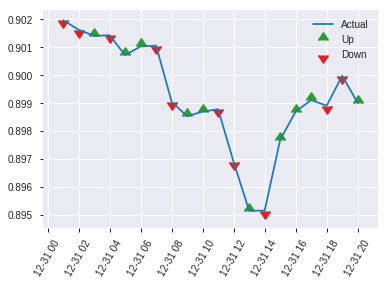


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.20549203568250046
RMSE: 0.4533122937694283
LogLoss: 0.5999681368727492
Mean Per-Class Error: 0.30197562000840694
AUC: 0.7584226565783942
pr_auc: 0.743945696666309
Gini: 0.5168453131567885
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2232656478881836: 


,0,1,Error,Rate
0,124.0,181.0,0.5934,(181.0/305.0)
1,31.0,281.0,0.0994,(31.0/312.0)
Total,155.0,462.0,0.3436,(212.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2232656,0.7260982,305.0
max f2,0.0705880,0.8487486,380.0
max f0point5,0.5359623,0.7026144,154.0
max accuracy,0.3949385,0.6985413,223.0
max precision,0.9174893,1.0,0.0
max recall,0.0705880,1.0,380.0
max specificity,0.9174893,1.0,0.0
max absolute_mcc,0.3896932,0.3982310,226.0
max min_per_class_accuracy,0.4355073,0.6852459,206.0
max mean_per_class_accuracy,0.3949385,0.6980244,223.0


Gains/Lift Table: Avg response rate: 50.57 %, avg score: 43.51 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8934352,1.6950549,1.6950549,0.8571429,0.9046418,0.8571429,0.9046418,0.0192308,0.0192308,69.5054945,69.5054945
,2,0.0210697,0.8649254,1.3183761,1.5212032,0.6666667,0.8773255,0.7692308,0.8920343,0.0128205,0.0320513,31.8376068,52.1203156
,3,0.0307942,0.8488734,1.6479701,1.5612348,0.8333333,0.8549649,0.7894737,0.8803282,0.0160256,0.0480769,64.7970085,56.1234818
,4,0.0405186,0.8391872,1.9775641,1.6611538,1.0,0.8441198,0.84,0.8716382,0.0192308,0.0673077,97.7564103,66.1153846
,5,0.0502431,0.8278982,1.9775641,1.7223945,1.0,0.8343018,0.8709677,0.8644118,0.0192308,0.0865385,97.7564103,72.2394541
,6,0.1004862,0.7646945,1.6586022,1.6904983,0.8387097,0.7911475,0.8548387,0.8277796,0.0833333,0.1698718,65.8602151,69.0498346
,7,0.1507293,0.7169659,1.6586022,1.6798663,0.8387097,0.7396649,0.8494624,0.7984081,0.0833333,0.2532051,65.8602151,67.9866281
,8,0.2009724,0.6836644,1.5948098,1.6586022,0.8064516,0.7009236,0.8387097,0.7740369,0.0801282,0.3333333,59.4809760,65.8602151
,9,0.2998379,0.5984846,1.2967633,1.5392931,0.6557377,0.6351332,0.7783784,0.7282362,0.1282051,0.4615385,29.6763346,53.9293139
,10,0.4003241,0.5174484,1.1801592,1.4491462,0.5967742,0.5555286,0.7327935,0.6848845,0.1185897,0.5801282,18.0159222,44.9146164


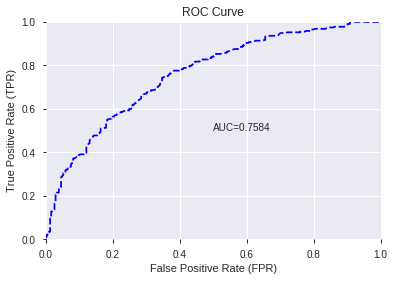

This function is available for GLM models only


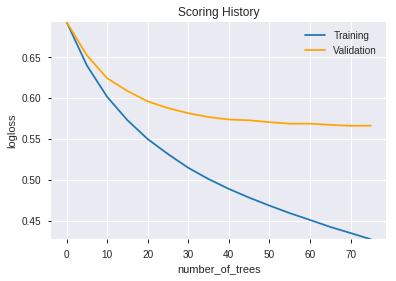

--2019-08-24 18:32:48--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.113.3
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.113.3|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip


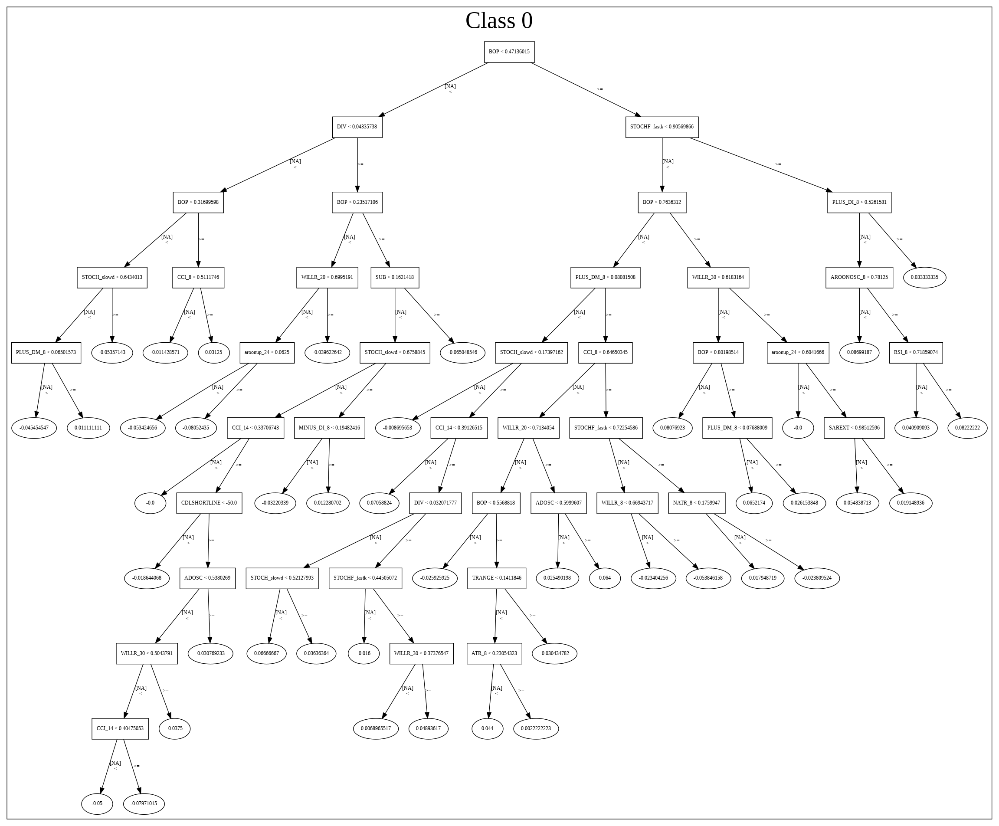

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_2_AutoML_20190824_183204',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_2_AutoML_20190824_183204',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_26_sid_ad7c',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_26_sid_ad7c',
   'type

['BOP',
 'STOCHF_fastk',
 'DIV',
 'CCI_8',
 'TRANGE',
 'STOCHRSI_fastk',
 'STOCH_slowd',
 'Volume',
 'CCI_14',
 'SAREXT',
 'ADOSC',
 'MFI_8',
 'ULTOSC',
 'WILLR_8',
 'aroonup_24',
 'PLUS_DM_8',
 'WILLR_12',
 'NATR_8',
 'MINUS_DI_8',
 'PLUS_DI_8',
 'SUB',
 'WILLR_30',
 'WILLR_20',
 'ATR_8',
 'aroonup_12',
 'RSI_8',
 'aroondown_30',
 'WILLR_14',
 'aroondown_24',
 'aroondown_8',
 'AROONOSC_8',
 'CDLCLOSINGMARUBOZU',
 'quarter',
 'CDLSHORTLINE',
 'HT_TRENDMODE',
 'CDLLONGLINE',
 'CORREL_24',
 'CDLDRAGONFLYDOJI',
 'CDLSPINNINGTOP',
 'CDLHAMMER',
 'CDLTAKURI',
 'CDLBELTHOLD',
 'CDLHIKKAKE']

In [14]:
# XGBoost with top DeepLearning features
model_train(feature_name='DLF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190824_183346_model_1,0.755459,0.598307,0.344872,0.451718,0.204049


,variable,relative_importance,scaled_importance,percentage
0,BOP,6.402089e-01,1.000000,2.800374e-02
1,STOCH_slowd,2.495544e-01,0.389801,1.091590e-02
2,CCI_30,2.377986e-01,0.371439,1.040168e-02
3,STOCHF_fastk,2.151026e-01,0.335988,9.408926e-03
4,PLUS_DI_8,2.116500e-01,0.330595,9.257902e-03
5,ULTOSC,2.070068e-01,0.323343,9.054801e-03
6,SUB,1.982672e-01,0.309691,8.672520e-03
7,quarter,1.863425e-01,0.291065,8.150915e-03
8,TRANGE,1.824830e-01,0.285037,7.982093e-03
9,CDLCLOSINGMARUBOZU,1.821020e-01,0.284442,7.965428e-03


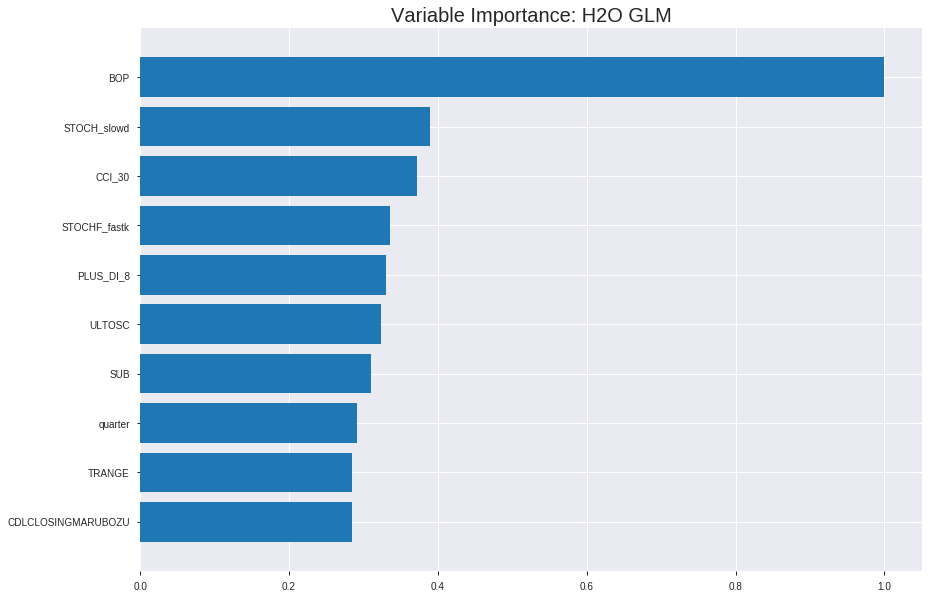

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190824_183346_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.1816830704459285
RMSE: 0.4262429711396171
LogLoss: 0.5415388443613957
Null degrees of freedom: 4318
Residual degrees of freedom: 3277
Null deviance: 5985.886154969303
Residual deviance: 4677.812537593736
AIC: 6761.812537593736
AUC: 0.8020670127418594
pr_auc: 0.7862286851282674
Gini: 0.6041340254837189
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.42240366975761223: 


,0,1,Error,Rate
0,1369.0,831.0,0.3777,(831.0/2200.0)
1,364.0,1755.0,0.1718,(364.0/2119.0)
Total,1733.0,2586.0,0.2767,(1195.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4224037,0.7460149,236.0
max f2,0.1624032,0.8447377,346.0
max f0point5,0.5655791,0.7374616,170.0
max accuracy,0.5410130,0.7348923,181.0
max precision,0.9942948,1.0,0.0
max recall,0.0093819,1.0,397.0
max specificity,0.9942948,1.0,0.0
max absolute_mcc,0.5410130,0.4703432,181.0
max min_per_class_accuracy,0.5048131,0.7318182,198.0
max mean_per_class_accuracy,0.5395663,0.7340910,182.0


Gains/Lift Table: Avg response rate: 49.06 %, avg score: 49.06 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.9273549,1.9919023,1.9919023,0.9772727,0.9565265,0.9772727,0.9565265,0.0202926,0.0202926,99.1902270,99.1902270
,2,0.0201436,0.9043403,1.9908250,1.9913698,0.9767442,0.9172343,0.9770115,0.9371062,0.0198207,0.0401133,99.0824983,99.1369818
,3,0.0300996,0.8892310,1.8486232,1.9441536,0.9069767,0.8967716,0.9538462,0.9237647,0.0184049,0.0585182,84.8623199,94.4153628
,4,0.0400556,0.8726927,1.8960238,1.9321907,0.9302326,0.8799172,0.9479769,0.9128662,0.0188768,0.0773950,89.6023794,93.2190721
,5,0.0500116,0.8611729,1.8960238,1.9249908,0.9302326,0.8672130,0.9444444,0.9037779,0.0188768,0.0962718,89.6023794,92.4990824
,6,0.1000232,0.8134618,1.6607764,1.7928836,0.8148148,0.8351864,0.8796296,0.8694821,0.0830580,0.1793299,66.0776397,79.2883610
,7,0.1500347,0.7723085,1.6985213,1.7614295,0.8333333,0.7919763,0.8641975,0.8436469,0.0849457,0.2642756,69.8521315,76.1429512
,8,0.2000463,0.7379503,1.5286692,1.7032394,0.75,0.7556749,0.8356481,0.8216539,0.0764512,0.3407268,52.8669184,70.3239430
,9,0.3000695,0.6675899,1.4626156,1.6230315,0.7175926,0.7029764,0.7962963,0.7820947,0.1462954,0.4870222,46.2615577,62.3031479
,10,0.4000926,0.5878703,1.3776895,1.5616960,0.6759259,0.6266340,0.7662037,0.7432295,0.1378008,0.6248230,37.7689511,56.1695987




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.19327985766600045
RMSE: 0.43963605137204165
LogLoss: 0.5754800454670324
Null degrees of freedom: 1233
Residual degrees of freedom: 192
Null deviance: 1709.9209284159656
Residual deviance: 1420.2847522126358
AIC: 3504.284752212636
AUC: 0.7764271238299516
pr_auc: 0.760939991084634
Gini: 0.5528542476599032
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.38349657901912887: 


,0,1,Error,Rate
0,378.0,255.0,0.4028,(255.0/633.0)
1,118.0,483.0,0.1963,(118.0/601.0)
Total,496.0,738.0,0.3023,(373.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3834966,0.7214339,240.0
max f2,0.1083890,0.8349844,362.0
max f0point5,0.5520081,0.7123394,168.0
max accuracy,0.4844407,0.7179903,198.0
max precision,0.9885462,1.0,0.0
max recall,0.0025573,1.0,398.0
max specificity,0.9885462,1.0,0.0
max absolute_mcc,0.4844407,0.4354792,198.0
max min_per_class_accuracy,0.4765526,0.7121464,202.0
max mean_per_class_accuracy,0.4844407,0.7176743,198.0


Gains/Lift Table: Avg response rate: 48.70 %, avg score: 46.74 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.9452708,1.5794189,1.5794189,0.7692308,0.9597947,0.7692308,0.9597947,0.0166389,0.0166389,57.9418917,57.9418917
,2,0.0202593,0.9159288,2.0532446,1.8068552,1.0,0.9293156,0.88,0.9451648,0.0199667,0.0366057,105.3244592,80.6855241
,3,0.0299838,0.8995512,1.7110372,1.7757791,0.8333333,0.9071417,0.8648649,0.9328330,0.0166389,0.0532446,71.1037160,77.5779107
,4,0.0405186,0.8852973,2.0532446,1.8479201,1.0,0.8914928,0.9,0.9220845,0.0216306,0.0748752,105.3244592,84.7920133
,5,0.0502431,0.8633915,2.0532446,1.8876604,1.0,0.8708858,0.9193548,0.9121751,0.0199667,0.0948419,105.3244592,88.7660351
,6,0.1004862,0.8100788,1.8876604,1.8876604,0.9193548,0.8341712,0.9193548,0.8731732,0.0948419,0.1896839,88.7660351,88.7660351
,7,0.1499190,0.7695400,1.5820081,1.7868777,0.7704918,0.7908547,0.8702703,0.8460303,0.0782030,0.2678869,58.2008129,78.6877726
,8,0.2001621,0.7212540,1.4240245,1.6957972,0.6935484,0.7463148,0.8259109,0.8210005,0.0715474,0.3394343,42.4024475,69.5797153
,9,0.2998379,0.6380043,1.4522950,1.6148491,0.7073171,0.6795073,0.7864865,0.7739636,0.1447587,0.4841930,45.2294956,61.4849125
,10,0.4003241,0.5504723,1.2418818,1.5212298,0.6048387,0.5940985,0.7408907,0.7288153,0.1247920,0.6089850,24.1881810,52.1229799



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-24 18:33:55,0.000 sec,2,.21E2,1033,1.3590633,1.3603298
,2019-08-24 18:34:00,5.373 sec,4,.15E2,1040,1.3519567,1.3538210
,2019-08-24 18:34:06,10.631 sec,6,.11E2,1041,1.3432370,1.3457602
,2019-08-24 18:34:11,16.232 sec,8,.8E1,1041,1.3327904,1.3360325
,2019-08-24 18:34:16,21.463 sec,10,.58E1,1042,1.3205059,1.3245051
---,---,---,---,---,---,---,---
,2019-08-24 18:36:08,2 min 13.486 sec,52,.74E-2,1042,1.0830777,1.1509601
,2019-08-24 18:36:14,2 min 18.721 sec,54,.54E-2,1042,1.0797893,1.1513590
,2019-08-24 18:36:19,2 min 24.171 sec,56,.39E-2,1042,1.0765988,1.1521420
,2019-08-24 18:36:24,2 min 29.443 sec,58,.29E-2,1042,1.0734526,1.1532767



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6904376012965965)

('F1', 0.7291399229781771)

('auc', 0.755459226565784)

('logloss', 0.5983071431213648)

('mean_per_class_error', 0.3084804539722572)

('rmse', 0.451717544274928)

('mse', 0.2040487398057715)

glm prediction progress: |████████████████████████████████████████████████| 100%


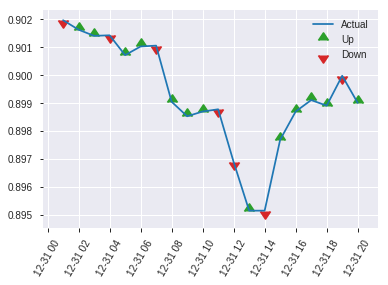


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.2040487398057715
RMSE: 0.451717544274928
LogLoss: 0.5983071431213648
Null degrees of freedom: 616
Residual degrees of freedom: -425
Null deviance: 855.8232650727789
Residual deviance: 738.3110146117642
AIC: 2822.311014611764
AUC: 0.755459226565784
pr_auc: 0.74663461567063
Gini: 0.510918453131568
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.24432701691022568: 


,0,1,Error,Rate
0,122.0,183.0,0.6,(183.0/305.0)
1,28.0,284.0,0.0897,(28.0/312.0)
Total,150.0,467.0,0.342,(211.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2443270,0.7291399,299.0
max f2,0.0843777,0.8466630,362.0
max f0point5,0.5532284,0.7066869,161.0
max accuracy,0.5532284,0.6904376,161.0
max precision,0.9621919,1.0,0.0
max recall,0.0132088,1.0,396.0
max specificity,0.9621919,1.0,0.0
max absolute_mcc,0.5532284,0.3898458,161.0
max min_per_class_accuracy,0.4605571,0.6786885,201.0
max mean_per_class_accuracy,0.5532284,0.6915195,161.0


Gains/Lift Table: Avg response rate: 50.57 %, avg score: 46.07 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.9361825,1.6950549,1.6950549,0.8571429,0.9475394,0.8571429,0.9475394,0.0192308,0.0192308,69.5054945,69.5054945
,2,0.0210697,0.9211307,1.9775641,1.8254438,1.0,0.9240786,0.9230769,0.9367113,0.0192308,0.0384615,97.7564103,82.5443787
,3,0.0307942,0.8762891,1.6479701,1.7693995,0.8333333,0.9001760,0.8947368,0.9251739,0.0160256,0.0544872,64.7970085,76.9399460
,4,0.0405186,0.8577104,1.6479701,1.7402564,0.8333333,0.8648847,0.88,0.9107045,0.0160256,0.0705128,64.7970085,74.0256410
,5,0.0502431,0.8479101,1.9775641,1.7861869,1.0,0.8535106,0.9032258,0.8996347,0.0192308,0.0897436,97.7564103,78.6186931
,6,0.1004862,0.7982363,1.6586022,1.7223945,0.8387097,0.8219975,0.8709677,0.8608161,0.0833333,0.1730769,65.8602151,72.2394541
,7,0.1507293,0.7565421,1.4034326,1.6160739,0.7096774,0.7798337,0.8172043,0.8338220,0.0705128,0.2435897,40.3432589,61.6073890
,8,0.2009724,0.7221097,1.6586022,1.6267060,0.8387097,0.7358525,0.8225806,0.8093296,0.0833333,0.3269231,65.8602151,62.6705955
,9,0.2998379,0.6325954,1.3616015,1.5392931,0.6885246,0.6729331,0.7783784,0.7643556,0.1346154,0.4615385,36.1601513,53.9293139
,10,0.4003241,0.5577475,1.2439516,1.4651588,0.6290323,0.5913484,0.7408907,0.7209287,0.125,0.5865385,24.3951613,46.5158829


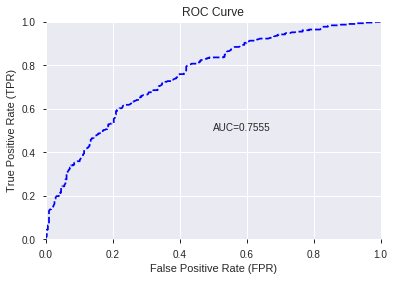

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


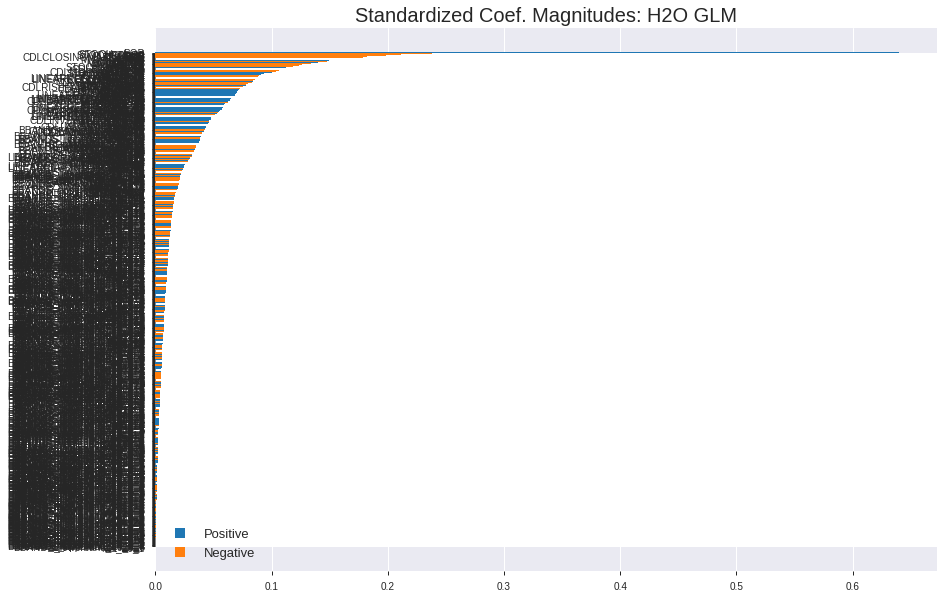

'log_likelihood'
--2019-08-24 18:36:57--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.107.92
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.107.92|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


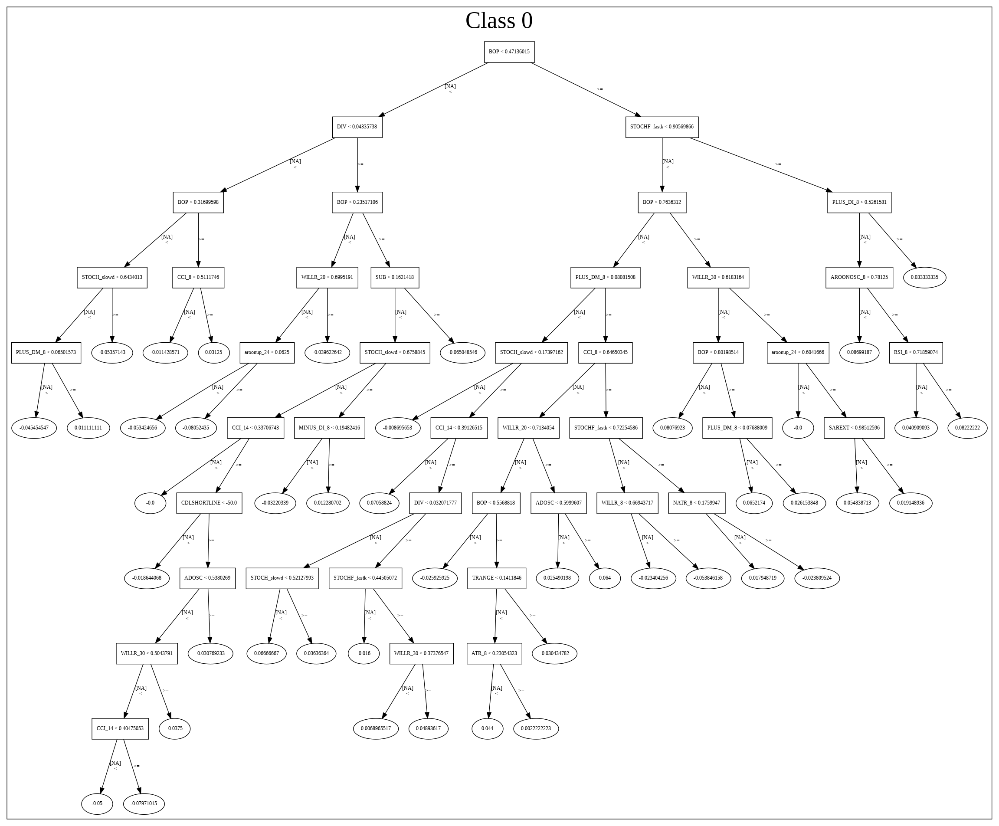

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190824_183346_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190824_183346_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_34_sid_ad7c',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_34_s

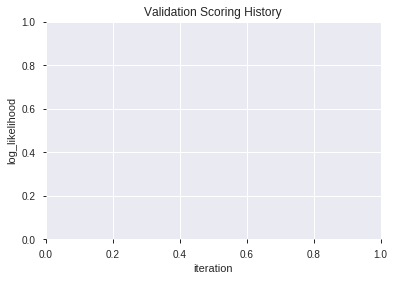

In [15]:
# GLM
glm_features = model_train(feature_name='All',model_algo="GLM")

In [16]:
# DeepLearning with top GLM features
model_train(feature_name='GLMF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

[]

In [17]:
# GLM with top GLM features
model_train(feature_name='GLMF',model_algo="GLM",features_list = features_list[:model_selected_features])

[]

In [18]:
# XGBoost with top GLM features
model_train(feature_name='GLMF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

[]

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_3_AutoML_20190824_183754,0.760172,0.594258,0.338241,0.451907,0.204219
1,XGBoost_grid_1_AutoML_20190824_183754_model_1,0.756699,0.597161,0.319767,0.452539,0.204791
2,XGBoost_grid_1_AutoML_20190824_183754_model_2,0.755543,0.601644,0.343269,0.454725,0.206774
3,XGBoost_grid_1_AutoML_20190824_183754_model_3,0.750888,0.604140,0.327890,0.456171,0.208092
4,XGBoost_grid_1_AutoML_20190824_183754_model_4,0.750168,0.602585,0.332845,0.455541,0.207518
5,XGBoost_grid_1_AutoML_20190824_183754_model_6,0.749995,0.603922,0.334705,0.456082,0.208011
6,XGBoost_grid_1_AutoML_20190824_183754_model_5,0.749343,0.617614,0.384400,0.459777,0.211395
7,XGBoost_grid_1_AutoML_20190824_183754_model_7,0.748539,0.612136,0.355002,0.459876,0.211486
8,XGBoost_1_AutoML_20190824_183754,0.747688,0.614433,0.332955,0.460692,0.212237
9,XGBoost_2_AutoML_20190824_183754,0.741614,0.616412,0.356384,0.462478,0.213886


,variable,relative_importance,scaled_importance,percentage
0,BOP,4962.921875,1.000000,0.240174
1,STOCHF_fastk,1290.762573,0.260081,0.062465
2,TRANGE,882.177551,0.177754,0.042692
3,STOCHRSI_fastk,642.787476,0.129518,0.031107
4,SUB,577.016235,0.116265,0.027924
5,hour,539.081665,0.108622,0.026088
6,DIV,488.865601,0.098504,0.023658
7,CCI_8,399.736053,0.080544,0.019345
8,CDLLONGLINE,281.333191,0.056687,0.013615
9,CDLCLOSINGMARUBOZU,280.661865,0.056552,0.013582


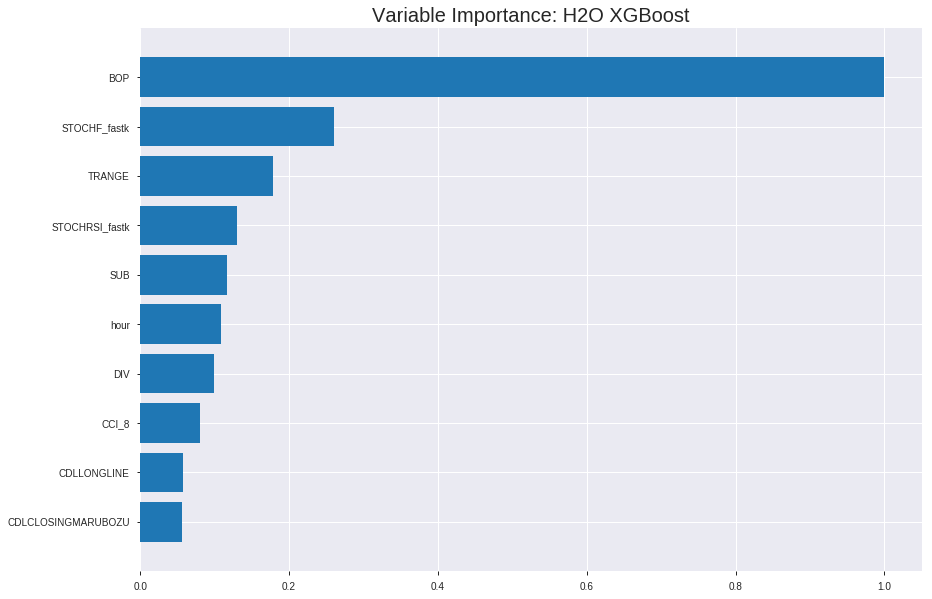

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_3_AutoML_20190824_183754


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.13784537124393473
RMSE: 0.37127533077749014
LogLoss: 0.4392561915276008
Mean Per-Class Error: 0.18158908576086485
AUC: 0.9096813462611009
pr_auc: 0.9114542632640968
Gini: 0.8193626925222017
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.43226414106108924: 


,0,1,Error,Rate
0,1577.0,623.0,0.2832,(623.0/2200.0)
1,246.0,1873.0,0.1161,(246.0/2119.0)
Total,1823.0,2496.0,0.2012,(869.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4322641,0.8117010,230.0
max f2,0.2799646,0.8909540,301.0
max f0point5,0.5963479,0.8496620,153.0
max accuracy,0.5709559,0.8198657,165.0
max precision,0.9609910,1.0,0.0
max recall,0.1800869,1.0,346.0
max specificity,0.9609910,1.0,0.0
max absolute_mcc,0.5709559,0.6465651,165.0
max min_per_class_accuracy,0.5070144,0.8069844,196.0
max mean_per_class_accuracy,0.5594456,0.8184109,171.0


Gains/Lift Table: Avg response rate: 49.06 %, avg score: 49.13 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.9219552,2.0382256,2.0382256,1.0,0.9344582,1.0,0.9344582,0.0207645,0.0207645,103.8225578,103.8225578
,2,0.0201436,0.9045685,2.0382256,2.0382256,1.0,0.9125409,1.0,0.9236255,0.0202926,0.0410571,103.8225578,103.8225578
,3,0.0300996,0.8884531,2.0382256,2.0382256,1.0,0.8963644,1.0,0.9146084,0.0202926,0.0613497,103.8225578,103.8225578
,4,0.0400556,0.8762055,2.0382256,2.0382256,1.0,0.8820431,1.0,0.9065141,0.0202926,0.0816423,103.8225578,103.8225578
,5,0.0500116,0.8627334,2.0382256,2.0382256,1.0,0.8699100,1.0,0.8992272,0.0202926,0.1019349,103.8225578,103.8225578
,6,0.1000232,0.8109390,2.0382256,2.0382256,1.0,0.8359571,1.0,0.8675922,0.1019349,0.2038697,103.8225578,103.8225578
,7,0.1500347,0.7672587,1.9532995,2.0099169,0.9583333,0.7885657,0.9861111,0.8412500,0.0976876,0.3015573,95.3299512,100.9916890
,8,0.2000463,0.7314258,1.9344271,1.9910444,0.9490741,0.7489827,0.9768519,0.8181832,0.0967437,0.3983011,93.4427053,99.1044430
,9,0.3000695,0.6628619,1.7409843,1.9076911,0.8541667,0.6970852,0.9359568,0.7778172,0.1741387,0.5724398,74.0984348,90.7691070
,10,0.4000926,0.5812225,1.4909243,1.8034994,0.7314815,0.6210642,0.8848380,0.7386289,0.1491269,0.7215668,49.0924265,80.3499369




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.19233855323019633
RMSE: 0.438564195107394
LogLoss: 0.5657018195620666
Mean Per-Class Error: 0.29124313611069486
AUC: 0.7776770154008722
pr_auc: 0.7684140405584232
Gini: 0.5553540308017444
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.35853670835494994: 


,0,1,Error,Rate
0,348.0,285.0,0.4502,(285.0/633.0)
1,101.0,500.0,0.1681,(101.0/601.0)
Total,449.0,785.0,0.3128,(386.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3585367,0.7215007,263.0
max f2,0.2020519,0.8381587,337.0
max f0point5,0.5602681,0.7131753,168.0
max accuracy,0.5485339,0.7106969,175.0
max precision,0.9489892,1.0,0.0
max recall,0.0889534,1.0,385.0
max specificity,0.9489892,1.0,0.0
max absolute_mcc,0.5485339,0.4228521,175.0
max min_per_class_accuracy,0.4929345,0.7021631,205.0
max mean_per_class_accuracy,0.5485339,0.7087569,175.0


Gains/Lift Table: Avg response rate: 48.70 %, avg score: 46.98 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.9151838,2.0532446,2.0532446,1.0,0.9306095,1.0,0.9306095,0.0216306,0.0216306,105.3244592,105.3244592
,2,0.0202593,0.8880259,2.0532446,2.0532446,1.0,0.9012439,1.0,0.9165140,0.0199667,0.0415973,105.3244592,105.3244592
,3,0.0299838,0.8603546,2.0532446,2.0532446,1.0,0.8707169,1.0,0.9016609,0.0199667,0.0615641,105.3244592,105.3244592
,4,0.0405186,0.8482545,1.7373608,1.9711148,0.8461538,0.8556534,0.96,0.8896989,0.0183028,0.0798669,73.7360809,97.1114809
,5,0.0502431,0.8285786,1.8821409,1.9538940,0.9166667,0.8406767,0.9516129,0.8802108,0.0183028,0.0981697,88.2140876,95.3894048
,6,0.1004862,0.7708455,1.6558424,1.8048682,0.8064516,0.7995405,0.8790323,0.8398756,0.0831947,0.1813644,65.5842413,80.4868230
,7,0.1499190,0.7242715,1.7839666,1.7979763,0.8688525,0.7472252,0.8756757,0.8093261,0.0881864,0.2695507,78.3966613,79.7976346
,8,0.2001621,0.6864269,1.5233750,1.7290481,0.7419355,0.7048800,0.8421053,0.7831088,0.0765391,0.3460899,52.3375020,72.9048078
,9,0.2998379,0.6193306,1.3521367,1.6037505,0.6585366,0.6536403,0.7810811,0.7400693,0.1347754,0.4808652,35.2136683,60.3750506
,10,0.4003241,0.5588662,1.3081155,1.5295425,0.6370968,0.5866891,0.7449393,0.7015690,0.1314476,0.6123128,30.8115506,52.9542530



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 18:38:34,0.004 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5093772,0.5,0.6931472,0.5,0.0,1.0,0.5129660
,2019-08-24 18:38:35,1.239 sec,5.0,0.4777451,0.6493746,0.8089004,0.7936454,1.9939163,0.2813151,0.4829388,0.6594134,0.7465191,0.7275344,2.0532446,0.3273906
,2019-08-24 18:38:36,1.654 sec,10.0,0.4587657,0.6126911,0.8255438,0.8157221,1.9919023,0.2789998,0.4698993,0.6337503,0.7527515,0.7378301,2.0532446,0.3273906
,2019-08-24 18:38:36,2.060 sec,15.0,0.4456112,0.5869537,0.8314875,0.8227356,2.0382256,0.2746006,0.4609144,0.6156204,0.7588406,0.7503987,2.0532446,0.3411669
,2019-08-24 18:38:36,2.540 sec,20.0,0.4356430,0.5670358,0.8376864,0.8319686,2.0382256,0.2752952,0.4558939,0.6049202,0.7586369,0.7489682,2.0532446,0.3395462
,2019-08-24 18:38:37,3.003 sec,25.0,0.4271551,0.5498106,0.8453882,0.8417455,2.0382256,0.2697384,0.4514870,0.5953461,0.7623051,0.7544343,2.0532446,0.3403566
,2019-08-24 18:38:37,3.427 sec,30.0,0.4195289,0.5344008,0.8528351,0.8507093,2.0382256,0.2630238,0.4485880,0.5888795,0.7642279,0.7564070,2.0532446,0.3387358
,2019-08-24 18:38:38,3.843 sec,35.0,0.4138275,0.5222985,0.8566871,0.8557857,2.0382256,0.2567724,0.4469245,0.5845838,0.7638152,0.7549504,2.0532446,0.3581848
,2019-08-24 18:38:38,4.276 sec,40.0,0.4085137,0.5115582,0.8632815,0.8625386,2.0382256,0.2546886,0.4458837,0.5821148,0.7648048,0.7550080,2.0532446,0.3387358
,2019-08-24 18:38:39,4.698 sec,45.0,0.4033492,0.5010826,0.8693246,0.8689939,2.0382256,0.2523732,0.4443199,0.5785686,0.7671417,0.7597489,2.0532446,0.3395462


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,4962.9218750,1.0,0.2401737
STOCHF_fastk,1290.7625732,0.2600812,0.0624647
TRANGE,882.1775513,0.1777537,0.0426918
STOCHRSI_fastk,642.7874756,0.1295180,0.0311068
SUB,577.0162354,0.1162654,0.0279239
---,---,---,---
T3_8_6,1.0349588,0.0002085,0.0000501
BBANDS_upperband_24_2_3,0.7676376,0.0001547,0.0000371
BBANDS_upperband_14_6_3,0.6535943,0.0001317,0.0000316
weekofyear,0.6165657,0.0001242,0.0000298



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6969205834683955)

('F1', 0.7315175097276265)

('auc', 0.7601723413198823)

('logloss', 0.5942578370063506)

('mean_per_class_error', 0.3026218999579655)

('rmse', 0.4519065149209465)

('mse', 0.20421949822799565)

xgboost prediction progress: |████████████████████████████████████████████| 100%


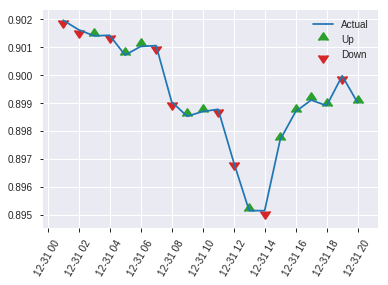


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.20421949822799565
RMSE: 0.4519065149209465
LogLoss: 0.5942578370063506
Mean Per-Class Error: 0.3026218999579655
AUC: 0.7601723413198823
pr_auc: 0.7529765306996554
Gini: 0.5203446826397646
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.25117383897304535: 


,0,1,Error,Rate
0,128.0,177.0,0.5803,(177.0/305.0)
1,30.0,282.0,0.0962,(30.0/312.0)
Total,158.0,459.0,0.3355,(207.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2511738,0.7315175,298.0
max f2,0.1402858,0.8514796,356.0
max f0point5,0.5213594,0.7070312,162.0
max accuracy,0.4610484,0.6969206,191.0
max precision,0.9311621,1.0,0.0
max recall,0.0758056,1.0,390.0
max specificity,0.9311621,1.0,0.0
max absolute_mcc,0.4610484,0.3958810,191.0
max min_per_class_accuracy,0.4387192,0.6918033,204.0
max mean_per_class_accuracy,0.4610484,0.6973781,191.0


Gains/Lift Table: Avg response rate: 50.57 %, avg score: 43.25 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8585783,1.9775641,1.9775641,1.0,0.8903974,1.0,0.8903974,0.0224359,0.0224359,97.7564103,97.7564103
,2,0.0210697,0.8350386,1.3183761,1.6733235,0.6666667,0.8469029,0.8461538,0.8703230,0.0128205,0.0352564,31.8376068,67.3323471
,3,0.0307942,0.8195448,1.6479701,1.6653171,0.8333333,0.8256882,0.8421053,0.8562278,0.0160256,0.0512821,64.7970085,66.5317139
,4,0.0405186,0.8117038,1.9775641,1.7402564,1.0,0.8149262,0.88,0.8463154,0.0192308,0.0705128,97.7564103,74.0256410
,5,0.0502431,0.7980296,1.9775641,1.7861869,1.0,0.8100446,0.9032258,0.8392953,0.0192308,0.0897436,97.7564103,78.6186931
,6,0.1004862,0.7316648,1.7223945,1.7542907,0.8709677,0.7635038,0.8870968,0.8013995,0.0865385,0.1762821,72.2394541,75.4290736
,7,0.1507293,0.6771420,1.7861869,1.7649228,0.9032258,0.7065300,0.8924731,0.7697763,0.0897436,0.2660256,78.6186931,76.4922801
,8,0.2009724,0.6436354,1.3396402,1.6586022,0.6774194,0.6610993,0.8387097,0.7426071,0.0673077,0.3333333,33.9640199,65.8602151
,9,0.2998379,0.5747904,1.1670870,1.4965350,0.5901639,0.6051504,0.7567568,0.6972835,0.1153846,0.4487179,16.7087011,49.6534997
,10,0.4003241,0.5163262,1.3396402,1.4571525,0.6774194,0.5490406,0.7368421,0.6600728,0.1346154,0.5833333,33.9640199,45.7152497


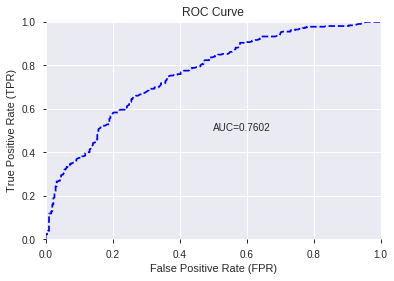

This function is available for GLM models only


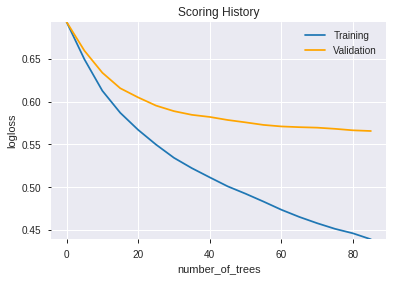

--2019-08-24 18:40:27--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.146.243
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.146.243|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoMo

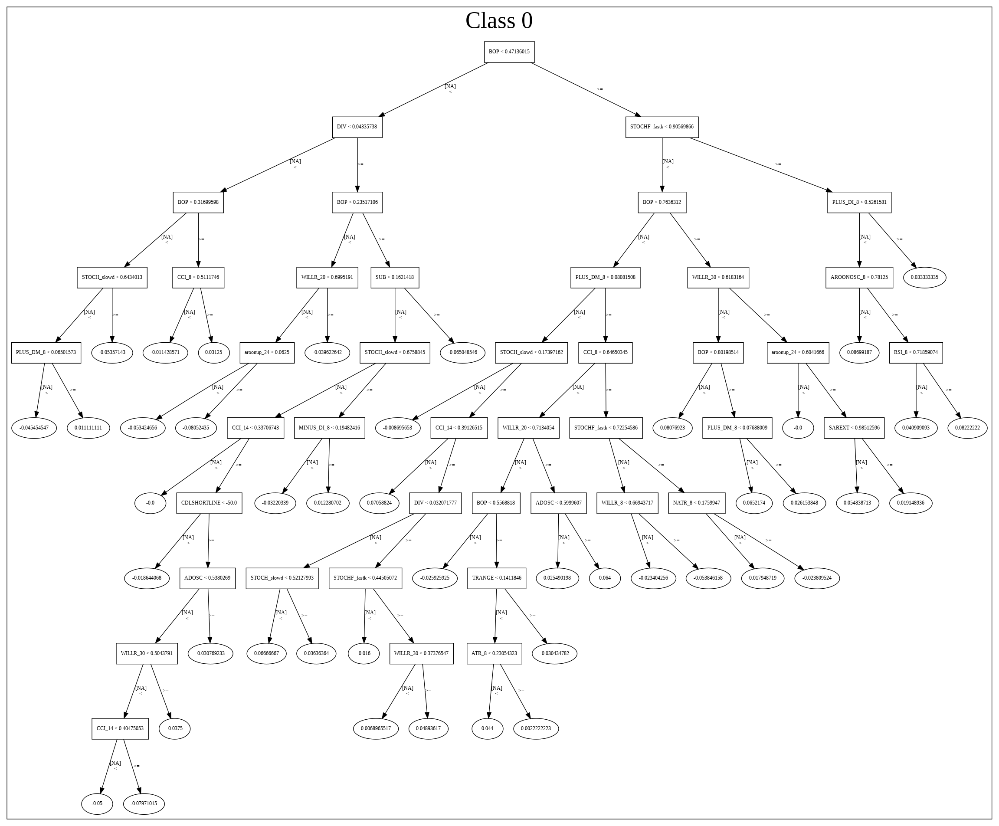

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_3_AutoML_20190824_183754',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_3_AutoML_20190824_183754',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_42_sid_ad7c',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_42_sid_ad7c',
   'type

In [19]:
# XGBoost
xgb_features = model_train(feature_name='All',model_algo="XGBoost")

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190824_184124_model_6,0.753463,0.609882,0.310335,0.455551,0.207527
1,DeepLearning_grid_1_AutoML_20190824_184124_model_5,0.743012,0.607298,0.329750,0.456107,0.208033
2,DeepLearning_grid_1_AutoML_20190824_184124_model_4,0.742334,0.670949,0.363162,0.472981,0.223711
3,DeepLearning_grid_1_AutoML_20190824_184124_model_9,0.741078,0.601713,0.361780,0.455733,0.207693
4,DeepLearning_grid_1_AutoML_20190824_184124_model_8,0.740773,0.602601,0.359994,0.454673,0.206727
5,DeepLearning_grid_1_AutoML_20190824_184124_model_7,0.727622,0.873548,0.356384,0.502639,0.252646
6,DeepLearning_grid_1_AutoML_20190824_184124_model_3,0.725604,0.734194,0.342865,0.482702,0.233002
7,DeepLearning_1_AutoML_20190824_184124,0.723229,0.648950,0.357729,0.472270,0.223039
8,DeepLearning_grid_1_AutoML_20190824_184124_model_2,0.722320,0.751366,0.335719,0.491198,0.241275
9,DeepLearning_grid_1_AutoML_20190824_184124_model_1,0.689449,0.954449,0.391104,0.519455,0.269834


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.050128
1,CDLLONGLINE,0.778259,0.778259,0.039013
2,CDLCLOSINGMARUBOZU,0.769321,0.769321,0.038565
3,CDLSHORTLINE,0.715154,0.715154,0.035849
4,SUB,0.681778,0.681778,0.034176
5,DIV,0.669961,0.669961,0.033584
6,TRANGE,0.660508,0.660508,0.033110
7,ULTOSC,0.435537,0.435537,0.021833
8,aroonup_12,0.434552,0.434552,0.021783
9,SAREXT,0.429174,0.429174,0.021514


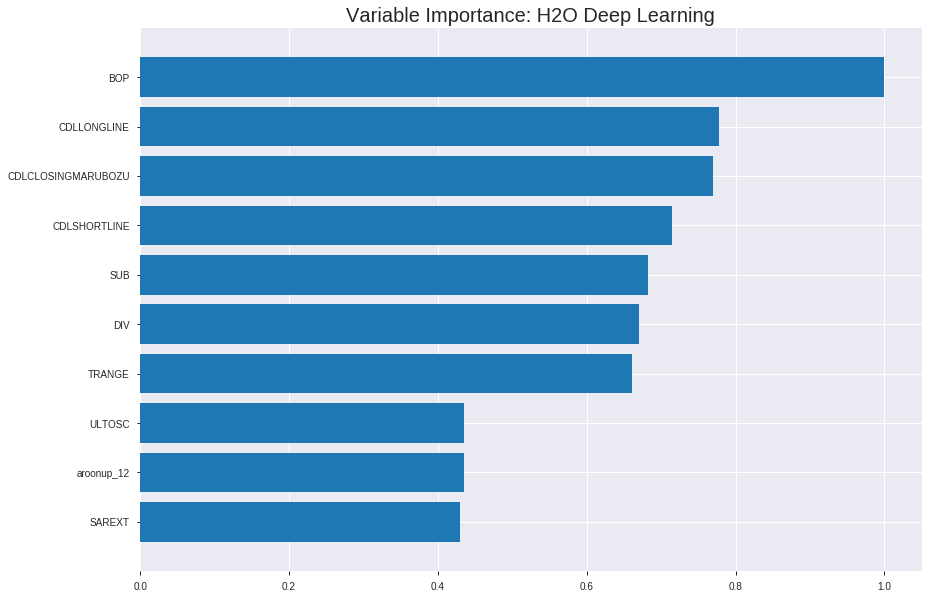

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190824_184124_model_6


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.18478753961360253
RMSE: 0.4298692122187893
LogLoss: 0.550421409444275
Mean Per-Class Error: 0.2716891544038784
AUC: 0.7974946372645759
pr_auc: 0.7785102840871077
Gini: 0.5949892745291518
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4387463081696925: 


,0,1,Error,Rate
0,1344.0,856.0,0.3891,(856.0/2200.0)
1,368.0,1751.0,0.1737,(368.0/2119.0)
Total,1712.0,2607.0,0.2834,(1224.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4387463,0.7410072,231.0
max f2,0.2107731,0.8444463,325.0
max f0point5,0.6315304,0.7299025,148.0
max accuracy,0.5453609,0.7286409,185.0
max precision,0.9871258,1.0,0.0
max recall,0.0231481,1.0,397.0
max specificity,0.9871258,1.0,0.0
max absolute_mcc,0.5453609,0.4569870,185.0
max min_per_class_accuracy,0.5290131,0.725,192.0
max mean_per_class_accuracy,0.5427183,0.7283108,186.0


Gains/Lift Table: Avg response rate: 49.06 %, avg score: 52.29 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.9716718,2.0382256,2.0382256,1.0,0.9775724,1.0,0.9775724,0.0207645,0.0207645,103.8225578,103.8225578
,2,0.0201436,0.9626696,1.8012226,1.9210862,0.8837209,0.9675052,0.9425287,0.9725967,0.0179330,0.0386975,80.1222604,92.1086177
,3,0.0300996,0.9520149,1.8486232,1.8971177,0.9069767,0.9562628,0.9307692,0.9671939,0.0184049,0.0571024,84.8623199,89.7117653
,4,0.0400556,0.9430649,1.8960238,1.8968458,0.9302326,0.9468411,0.9306358,0.9621351,0.0188768,0.0759792,89.6023794,89.6845769
,5,0.0500116,0.9332753,1.8012226,1.8778097,0.8837209,0.9378006,0.9212963,0.9572908,0.0179330,0.0939122,80.1222604,87.7809676
,6,0.1000232,0.8798783,1.7079575,1.7928836,0.8379630,0.9054376,0.8796296,0.9313642,0.0854176,0.1793299,70.7957545,79.2883610
,7,0.1500347,0.8305080,1.5947228,1.7268300,0.7824074,0.8550790,0.8472222,0.9059358,0.0797546,0.2590845,59.4722790,72.6830004
,8,0.2000463,0.7947457,1.6135952,1.6985213,0.7916667,0.8137287,0.8333333,0.8828840,0.0806984,0.3397829,61.3595249,69.8521315
,9,0.3000695,0.7223722,1.5050786,1.6340404,0.7384259,0.7596976,0.8016975,0.8418219,0.1505427,0.4903256,50.5078610,63.4040413
,10,0.4000926,0.6212549,1.3069178,1.5522598,0.6412037,0.6775051,0.7615741,0.8007427,0.1307220,0.6210477,30.6917790,55.2259757




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.19123933945026642
RMSE: 0.43730920348223457
LogLoss: 0.5634550323815366
Mean Per-Class Error: 0.28324172718980734
AUC: 0.779789082440272
pr_auc: 0.7719090797103817
Gini: 0.559578164880544
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3371513841050896: 


,0,1,Error,Rate
0,344.0,289.0,0.4566,(289.0/633.0)
1,98.0,503.0,0.1631,(98.0/601.0)
Total,442.0,792.0,0.3136,(387.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3371514,0.7221823,264.0
max f2,0.1223580,0.8347530,359.0
max f0point5,0.4708507,0.7109085,200.0
max accuracy,0.4708507,0.7171799,200.0
max precision,0.9851089,1.0,0.0
max recall,0.0430880,1.0,391.0
max specificity,0.9851089,1.0,0.0
max absolute_mcc,0.4708507,0.4337863,200.0
max min_per_class_accuracy,0.4456539,0.7109005,211.0
max mean_per_class_accuracy,0.4708507,0.7167583,200.0


Gains/Lift Table: Avg response rate: 48.70 %, avg score: 46.96 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.9612785,1.8953027,1.8953027,0.9230769,0.9695260,0.9230769,0.9695260,0.0199667,0.0199667,89.5302701,89.5302701
,2,0.0202593,0.9488313,1.8821409,1.8889850,0.9166667,0.9529370,0.92,0.9615633,0.0183028,0.0382696,88.2140876,88.8985025
,3,0.0299838,0.9403897,2.0532446,1.9422584,1.0,0.9451494,0.9459459,0.9562399,0.0199667,0.0582363,105.3244592,94.2258398
,4,0.0405186,0.9278710,2.0532446,1.9711148,1.0,0.9347038,0.96,0.9506405,0.0216306,0.0798669,105.3244592,97.1114809
,5,0.0502431,0.9168919,2.0532446,1.9870109,1.0,0.9223197,0.9677419,0.9451591,0.0199667,0.0998336,105.3244592,98.7010896
,6,0.1004862,0.8420649,1.7220761,1.8545435,0.8387097,0.8753068,0.9032258,0.9102330,0.0865225,0.1863561,72.2076110,85.4543503
,7,0.1499190,0.7731679,1.7166471,1.8090750,0.8360656,0.8015078,0.8810811,0.8743830,0.0848586,0.2712146,71.6647118,80.9074965
,8,0.2001621,0.7312608,1.4571413,1.7207353,0.7096774,0.7537564,0.8380567,0.8441043,0.0732113,0.3444260,45.7141324,72.0735347
,9,0.2998379,0.6351163,1.4022158,1.6148491,0.6829268,0.6866049,0.7864865,0.7917464,0.1397671,0.4841930,40.2215819,61.4849125
,10,0.4003241,0.5290003,1.2253234,1.5170734,0.5967742,0.5799244,0.7388664,0.7385765,0.1231281,0.6073211,22.5323386,51.7073434



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 18:48:27,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-24 18:48:30,5 min 8.953 sec,703 obs/sec,0.4781199,1,2065.0,0.5006535,0.8882634,-0.0029686,0.7415100,0.6894026,1.8529323,0.3322528,0.4939580,0.8775829,0.0233651,0.7405102,0.6985929,2.0532446,0.3517018
,2019-08-24 18:48:50,5 min 28.785 sec,1940 obs/sec,9.3278537,19,40287.0,0.4386343,0.5669644,0.2301291,0.7801603,0.7607380,1.9455790,0.3188238,0.4386370,0.5644315,0.2298724,0.7762418,0.7641889,1.8953027,0.3136143
,2019-08-24 18:49:10,5 min 48.830 sec,2175 obs/sec,19.5964344,40,84637.0,0.4372788,0.5728142,0.2348798,0.7871930,0.7677215,1.9919023,0.3005325,0.4438398,0.5884276,0.2114945,0.7739168,0.7672751,1.8953027,0.3241491
,2019-08-24 18:49:29,6 min 7.975 sec,2336 obs/sec,30.3635101,62,131140.0,0.4298692,0.5504214,0.2605898,0.7974946,0.7785103,2.0382256,0.2833989,0.4373092,0.5634550,0.2345279,0.7797891,0.7719091,1.8953027,0.3136143
,2019-08-24 18:49:48,6 min 27.356 sec,2442 obs/sec,41.6165779,85,179742.0,0.4255129,0.5412755,0.2755002,0.8074678,0.7859197,1.8992557,0.2868720,0.4386375,0.5676552,0.2298706,0.7791832,0.7640102,1.8953027,0.3225284
,2019-08-24 18:50:08,6 min 46.894 sec,2524 obs/sec,53.3116462,109,230253.0,0.4232148,0.5353528,0.2833047,0.8150441,0.7958441,1.9919023,0.2776106,0.4405583,0.5725440,0.2231111,0.7742165,0.7598249,1.8953027,0.3209076
,2019-08-24 18:50:27,7 min 6.524 sec,2598 obs/sec,65.5010419,134,282899.0,0.4179659,0.5234740,0.3009723,0.8190734,0.8064444,2.0382256,0.2766844,0.4443852,0.5823101,0.2095555,0.7685755,0.7494584,1.8953027,0.3298217
,2019-08-24 18:50:29,7 min 8.506 sec,2597 obs/sec,65.5010419,134,282899.0,0.4298692,0.5504214,0.2605898,0.7974946,0.7785103,2.0382256,0.2833989,0.4373092,0.5634550,0.2345279,0.7797891,0.7719091,1.8953027,0.3136143


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0501282
CDLLONGLINE,0.7782591,0.7782591,0.0390128
CDLCLOSINGMARUBOZU,0.7693214,0.7693214,0.0385647
CDLSHORTLINE,0.7151542,0.7151542,0.0358494
SUB,0.6817782,0.6817782,0.0341763
---,---,---,---
RSI_8,0.2715533,0.2715533,0.0136125
CORREL_20,0.2691707,0.2691707,0.0134931
WILLR_20,0.2665232,0.2665232,0.0133603
CDLBELTHOLD,0.2644854,0.2644854,0.0132582



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6952998379254457)

('F1', 0.7473404255319149)

('auc', 0.7534625893232451)

('logloss', 0.6098815039875648)

('mean_per_class_error', 0.3068358554014292)

('rmse', 0.45555082841519745)

('mse', 0.20752655726977268)

deeplearning prediction progress: |███████████████████████████████████████| 100%


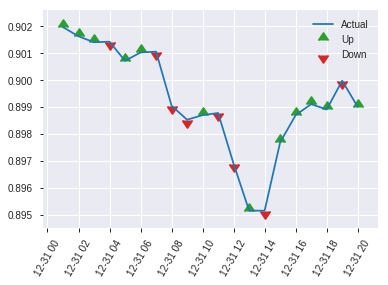


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.20752655726977268
RMSE: 0.45555082841519745
LogLoss: 0.6098815039875648
Mean Per-Class Error: 0.3068358554014292
AUC: 0.7534625893232451
pr_auc: 0.7256284199452961
Gini: 0.5069251786464901
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.26245283875441755: 


,0,1,Error,Rate
0,146.0,159.0,0.5213,(159.0/305.0)
1,31.0,281.0,0.0994,(31.0/312.0)
Total,177.0,440.0,0.3079,(190.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2624528,0.7473404,291.0
max f2,0.1144509,0.8453437,364.0
max f0point5,0.4855159,0.6964286,192.0
max accuracy,0.2815570,0.6952998,282.0
max precision,0.9852102,1.0,0.0
max recall,0.0259723,1.0,398.0
max specificity,0.9852102,1.0,0.0
max absolute_mcc,0.2624528,0.4193058,291.0
max min_per_class_accuracy,0.4137364,0.6794872,220.0
max mean_per_class_accuracy,0.2815570,0.6931641,282.0


Gains/Lift Table: Avg response rate: 50.57 %, avg score: 45.65 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.9581627,1.4125458,1.4125458,0.7142857,0.9677667,0.7142857,0.9677667,0.0160256,0.0160256,41.2545788,41.2545788
,2,0.0210697,0.9476671,1.9775641,1.6733235,1.0,0.9520597,0.8461538,0.9605173,0.0192308,0.0352564,97.7564103,67.3323471
,3,0.0307942,0.9296343,0.9887821,1.4571525,0.5,0.9358080,0.7368421,0.9527144,0.0096154,0.0448718,-1.1217949,45.7152497
,4,0.0405186,0.9256498,1.6479701,1.5029487,0.8333333,0.9278430,0.76,0.9467452,0.0160256,0.0608974,64.7970085,50.2948718
,5,0.0502431,0.9092040,1.6479701,1.5310174,0.8333333,0.9205405,0.7741935,0.9416734,0.0160256,0.0769231,64.7970085,53.1017370
,6,0.1004862,0.8455525,1.6586022,1.5948098,0.8387097,0.8785504,0.8064516,0.9101119,0.0833333,0.1602564,65.8602151,59.4809760
,7,0.1507293,0.7742977,1.7223945,1.6373380,0.8709677,0.8071390,0.8279570,0.8757876,0.0865385,0.2467949,72.2394541,63.7338020
,8,0.2009724,0.7221087,1.5948098,1.6267060,0.8064516,0.7481728,0.8225806,0.8438839,0.0801282,0.3269231,59.4809760,62.6705955
,9,0.2998379,0.6160416,1.2967633,1.5179141,0.6557377,0.6687014,0.7675676,0.7861210,0.1282051,0.4551282,29.6763346,51.7914068
,10,0.4003241,0.5141997,1.1163668,1.4171208,0.5645161,0.5693361,0.7165992,0.7317054,0.1121795,0.5673077,11.6366832,41.7120835


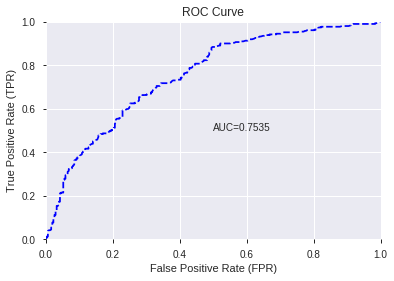

This function is available for GLM models only


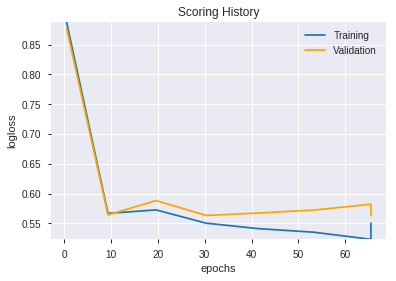

--2019-08-24 19:04:27--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.236.147
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.236.147|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


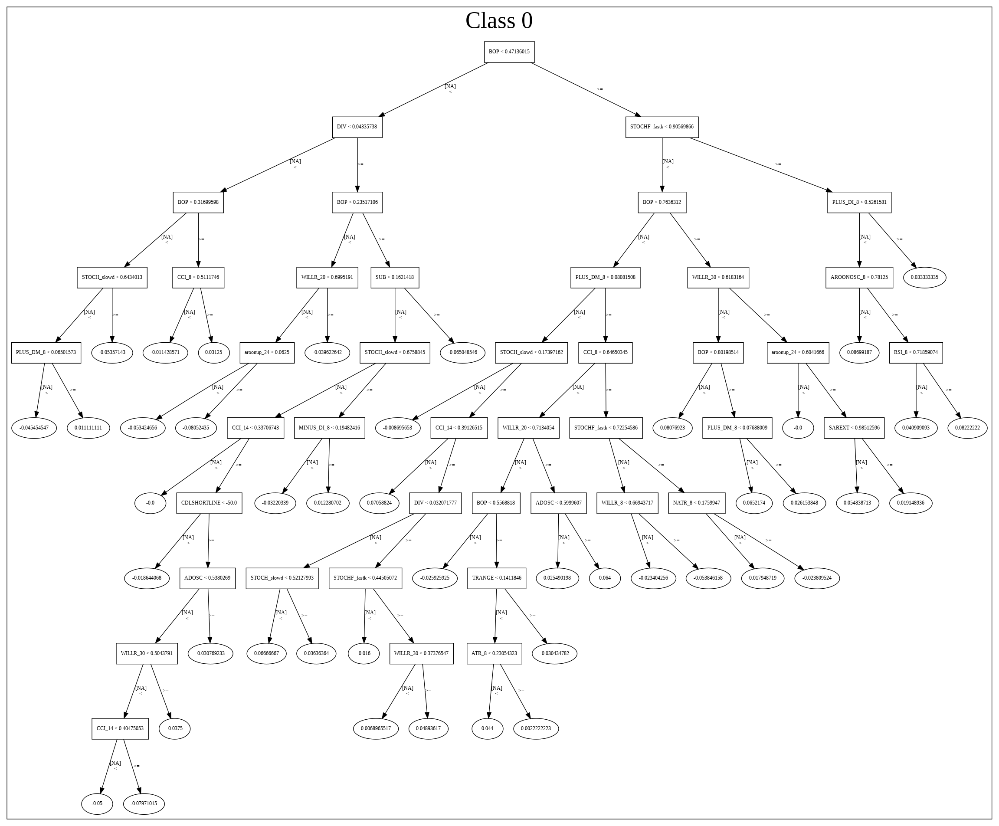

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190824_184124_model_6',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190824_184124_model_6',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_50_sid_ad7c',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'CDLLONGLINE',
 'CDLCLOSINGMARUBOZU',
 'CDLSHORTLINE',
 'SUB',
 'DIV',
 'TRANGE',
 'ULTOSC',
 'aroonup_12',
 'SAREXT',
 'STOCHRSI_fastk',
 'CDLHARAMI',
 'Volume',
 'STOCHF_fastk',
 'CDLTAKURI',
 'CORREL_24',
 'aroonup_24',
 'NATR_8',
 'ATR_8',
 'CDLSPINNINGTOP',
 'CDLENGULFING',
 'CDLDRAGONFLYDOJI',
 'STOCH_slowd',
 'WILLR_30',
 'MINUS_DI_8',
 'CCI_8',
 'is_month_end',
 'HT_TRENDMODE',
 'CDLHAMMER',
 'WILLR_12',
 'PLUS_DI_8',
 'CDLHANGINGMAN',
 'aroondown_8',
 'WILLR_14',
 'aroondown_30',
 'PLUS_DM_8',
 'ADOSC',
 'CCI_14',
 'quarter',
 'MFI_8',
 'is_month_start',
 'WILLR_8',
 'aroondown_24',
 'CDLMARUBOZU',
 'AROONOSC_8',
 'RSI_8',
 'CORREL_20',
 'WILLR_20',
 'CDLBELTHOLD',
 'CDLHIKKAKE']

In [20]:
# DeepLearning with top XGBoost features
model_train(feature_name='XGBF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190824_190525_model_1,0.745245,0.616868,0.36167,0.459749,0.211369


,variable,relative_importance,scaled_importance,percentage
0,SUB,2.019363,1.000000,0.192419
1,DIV,1.617843,0.801165,0.154159
2,BOP,0.849559,0.420706,0.080952
3,ATR_8,0.647895,0.320841,0.061736
4,NATR_8,0.417165,0.206583,0.039750
5,PLUS_DI_8,0.349141,0.172896,0.033269
6,PLUS_DM_8,0.329650,0.163245,0.031411
7,STOCHF_fastk,0.302257,0.149680,0.028801
8,STOCH_slowd,0.277344,0.137343,0.026427
9,RSI_8,0.235442,0.116592,0.022434


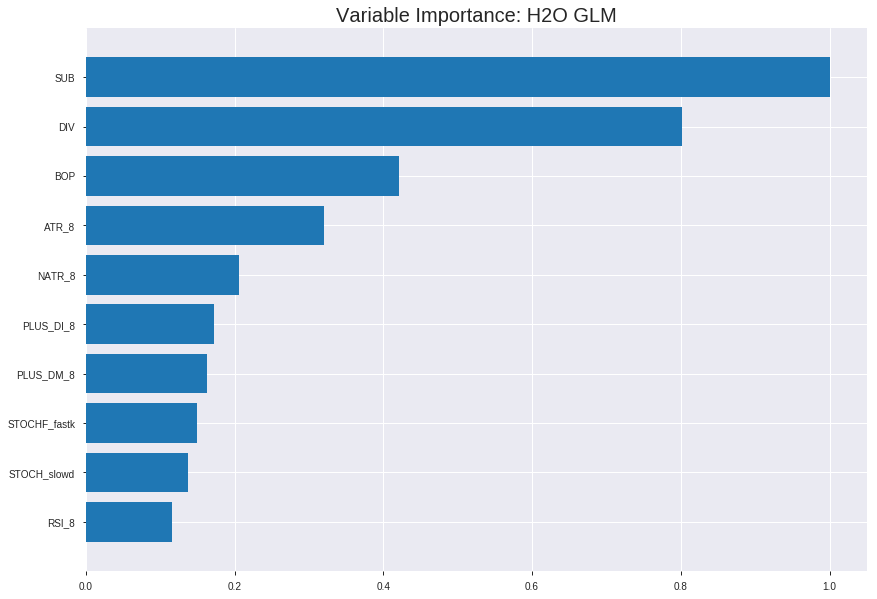

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190824_190525_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.18949243543363686
RMSE: 0.4353072885142596
LogLoss: 0.560485338970126
Null degrees of freedom: 4318
Residual degrees of freedom: 4268
Null deviance: 5985.886154969303
Residual deviance: 4841.472358023947
AIC: 4943.472358023947
AUC: 0.7839025698228153
pr_auc: 0.7635608581761156
Gini: 0.5678051396456305
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4049511475373628: 


,0,1,Error,Rate
0,1275.0,925.0,0.4205,(925.0/2200.0)
1,361.0,1758.0,0.1704,(361.0/2119.0)
Total,1636.0,2683.0,0.2978,(1286.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4049511,0.7321949,241.0
max f2,0.2514700,0.8404068,308.0
max f0point5,0.5386026,0.7181463,176.0
max accuracy,0.5353351,0.7184533,178.0
max precision,0.9826976,1.0,0.0
max recall,0.0304304,1.0,393.0
max specificity,0.9826976,1.0,0.0
max absolute_mcc,0.5353351,0.4368518,178.0
max min_per_class_accuracy,0.5069695,0.7159091,191.0
max mean_per_class_accuracy,0.5353351,0.7177983,178.0


Gains/Lift Table: Avg response rate: 49.06 %, avg score: 49.06 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.9262284,1.9455790,1.9455790,0.9545455,0.9430715,0.9545455,0.9430715,0.0198207,0.0198207,94.5578961,94.5578961
,2,0.0201436,0.8994581,1.9908250,1.9679419,0.9767442,0.9119273,0.9655172,0.9276784,0.0198207,0.0396413,99.0824983,96.7941937
,3,0.0300996,0.8783669,1.7538220,1.8971177,0.8604651,0.8895941,0.9307692,0.9150813,0.0174611,0.0571024,75.3822009,89.7117653
,4,0.0400556,0.8662603,1.8486232,1.8850641,0.9069767,0.8718331,0.9248555,0.9043317,0.0184049,0.0755073,84.8623199,88.5064118
,5,0.0500116,0.8557866,1.7064214,1.8495010,0.8372093,0.8607771,0.9074074,0.8956611,0.0169891,0.0924965,70.6421414,84.9500988
,6,0.1000232,0.8089078,1.6135952,1.7315481,0.7916667,0.8311366,0.8495370,0.8633989,0.0806984,0.1731949,61.3595249,73.1548118
,7,0.1500347,0.7701288,1.6419039,1.7016667,0.8055556,0.7883075,0.8348765,0.8383684,0.0821142,0.2553091,64.1903938,70.1666725
,8,0.2000463,0.7345036,1.5758503,1.6702126,0.7731481,0.7524967,0.8194444,0.8169005,0.0788108,0.3341199,57.5850331,67.0212627
,9,0.3000695,0.6635662,1.4484612,1.5962955,0.7106481,0.6992426,0.7831790,0.7776812,0.1448797,0.4789995,44.8461233,59.6295495
,10,0.4000926,0.5825416,1.3069178,1.5239511,0.6412037,0.6247195,0.7476852,0.7394408,0.1307220,0.6097216,30.6917790,52.3951069




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.19386912945674506
RMSE: 0.44030572271632473
LogLoss: 0.5724828002488458
Null degrees of freedom: 1233
Residual degrees of freedom: 1183
Null deviance: 1709.9209284159656
Residual deviance: 1412.8875510141518
AIC: 1514.8875510141518
AUC: 0.7761366653260889
pr_auc: 0.7724217746827511
Gini: 0.5522733306521779
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.38544571607578515: 


,0,1,Error,Rate
0,388.0,245.0,0.387,(245.0/633.0)
1,124.0,477.0,0.2063,(124.0/601.0)
Total,512.0,722.0,0.299,(369.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3854457,0.7210884,235.0
max f2,0.0973320,0.8380441,361.0
max f0point5,0.5547334,0.7113738,159.0
max accuracy,0.4948957,0.7115073,185.0
max precision,0.9644462,1.0,0.0
max recall,0.0140442,1.0,396.0
max specificity,0.9644462,1.0,0.0
max absolute_mcc,0.4948957,0.4228080,185.0
max min_per_class_accuracy,0.4601951,0.7030016,201.0
max mean_per_class_accuracy,0.4909119,0.7104720,187.0


Gains/Lift Table: Avg response rate: 48.70 %, avg score: 44.90 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.9267990,2.0532446,2.0532446,1.0,0.9441451,1.0,0.9441451,0.0216306,0.0216306,105.3244592,105.3244592
,2,0.0202593,0.8950191,1.8821409,1.9711148,0.9166667,0.9089651,0.96,0.9272587,0.0183028,0.0399334,88.2140876,97.1114809
,3,0.0299838,0.8612280,1.8821409,1.9422584,0.9166667,0.8763231,0.9459459,0.9107390,0.0183028,0.0582363,88.2140876,94.2258398
,4,0.0405186,0.8482650,2.0532446,1.9711148,1.0,0.8546321,0.96,0.8961512,0.0216306,0.0798669,105.3244592,97.1114809
,5,0.0502431,0.8379386,1.7110372,1.9207772,0.8333333,0.8439446,0.9354839,0.8860467,0.0166389,0.0965058,71.1037160,92.0777199
,6,0.1004862,0.7755241,1.8876604,1.9042188,0.9193548,0.8046334,0.9274194,0.8453400,0.0948419,0.1913478,88.7660351,90.4218775
,7,0.1499190,0.7347995,1.7166471,1.8423708,0.8360656,0.7566476,0.8972973,0.8160955,0.0848586,0.2762063,71.6647118,84.2370823
,8,0.2001621,0.6858837,1.3577908,1.7207353,0.6612903,0.7088764,0.8380567,0.7891822,0.0682196,0.3444260,35.7790779,72.0735347
,9,0.2998379,0.6000521,1.3688297,1.6037505,0.6666667,0.6430276,0.7810811,0.7405957,0.1364393,0.4808652,36.8829728,60.3750506
,10,0.4003241,0.5317297,1.2253234,1.5087607,0.5967742,0.5684983,0.7348178,0.6973971,0.1231281,0.6039933,22.5323386,50.8760702



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-24 19:05:25,0.000 sec,2,.21E2,51,1.3664831,1.3670820
,2019-08-24 19:05:25,0.027 sec,4,.13E2,51,1.3565900,1.3575617
,2019-08-24 19:05:25,0.054 sec,6,.8E1,51,1.3429044,1.3443215
,2019-08-24 19:05:25,0.082 sec,8,.5E1,51,1.3250034,1.3269028
,2019-08-24 19:05:25,0.109 sec,10,.31E1,51,1.3030055,1.3054153
---,---,---,---,---,---,---,---
,2019-08-24 19:05:26,0.630 sec,45,.14E-3,51,1.1214317,1.1485558
,2019-08-24 19:05:26,0.646 sec,46,.87E-4,51,1.1213169,1.1475548
,2019-08-24 19:05:26,0.662 sec,47,.54E-4,51,1.1212011,1.1465989
,2019-08-24 19:05:26,0.678 sec,48,.34E-4,51,1.1210853,1.1457384



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6758508914100486)

('F1', 0.7274969173859432)

('auc', 0.7452448507776376)

('logloss', 0.6168684338039258)

('mean_per_class_error', 0.324963219840269)

('rmse', 0.4597485588762724)

('mse', 0.21136873738880935)

glm prediction progress: |████████████████████████████████████████████████| 100%


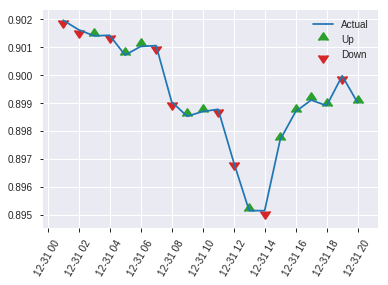


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.21136873738880935
RMSE: 0.4597485588762724
LogLoss: 0.6168684338039258
Null degrees of freedom: 616
Residual degrees of freedom: 566
Null deviance: 855.8232650727789
Residual deviance: 761.2156473140444
AIC: 863.2156473140444
AUC: 0.7452448507776376
pr_auc: 0.746755087842882
Gini: 0.49048970155527516
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.17224208602025626: 


,0,1,Error,Rate
0,101.0,204.0,0.6689,(204.0/305.0)
1,17.0,295.0,0.0545,(17.0/312.0)
Total,118.0,499.0,0.3582,(221.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1722421,0.7274969,326.0
max f2,0.0986279,0.8472222,358.0
max f0point5,0.5262177,0.6885246,158.0
max accuracy,0.3704480,0.6758509,234.0
max precision,0.9553320,1.0,0.0
max recall,0.0059657,1.0,398.0
max specificity,0.9553320,1.0,0.0
max absolute_mcc,0.3131287,0.3621720,257.0
max min_per_class_accuracy,0.4282450,0.6590164,205.0
max mean_per_class_accuracy,0.3704480,0.6750368,234.0


Gains/Lift Table: Avg response rate: 50.57 %, avg score: 42.68 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.9142321,1.9775641,1.9775641,1.0,0.9301793,1.0,0.9301793,0.0224359,0.0224359,97.7564103,97.7564103
,2,0.0210697,0.8828575,1.3183761,1.6733235,0.6666667,0.8990885,0.8461538,0.9158297,0.0128205,0.0352564,31.8376068,67.3323471
,3,0.0307942,0.8444247,1.9775641,1.7693995,1.0,0.8575882,0.8947368,0.8974376,0.0192308,0.0544872,97.7564103,76.9399460
,4,0.0405186,0.8280123,1.9775641,1.8193590,1.0,0.8361848,0.92,0.8827370,0.0192308,0.0737179,97.7564103,81.9358974
,5,0.0502431,0.8166270,1.9775641,1.8499793,1.0,0.8233576,0.9354839,0.8712442,0.0192308,0.0929487,97.7564103,84.9979322
,6,0.1004862,0.7626635,1.7861869,1.8180831,0.9032258,0.7925524,0.9193548,0.8318983,0.0897436,0.1826923,78.6186931,81.8083127
,7,0.1507293,0.7207605,1.4672250,1.7011304,0.7419355,0.7388255,0.8602151,0.8008740,0.0737179,0.2564103,46.7224979,70.1130411
,8,0.2009724,0.6572766,1.4672250,1.6426541,0.7419355,0.6903624,0.8306452,0.7732461,0.0737179,0.3301282,46.7224979,64.2654053
,9,0.2998379,0.5777158,1.1022488,1.4644664,0.5573770,0.6189130,0.7405405,0.7223579,0.1089744,0.4391026,10.2248844,46.4466389
,10,0.4003241,0.5044391,1.3077440,1.4251272,0.6612903,0.5410716,0.7206478,0.6768528,0.1314103,0.5705128,30.7744003,42.5127167


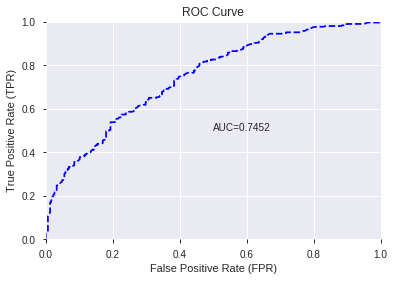

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


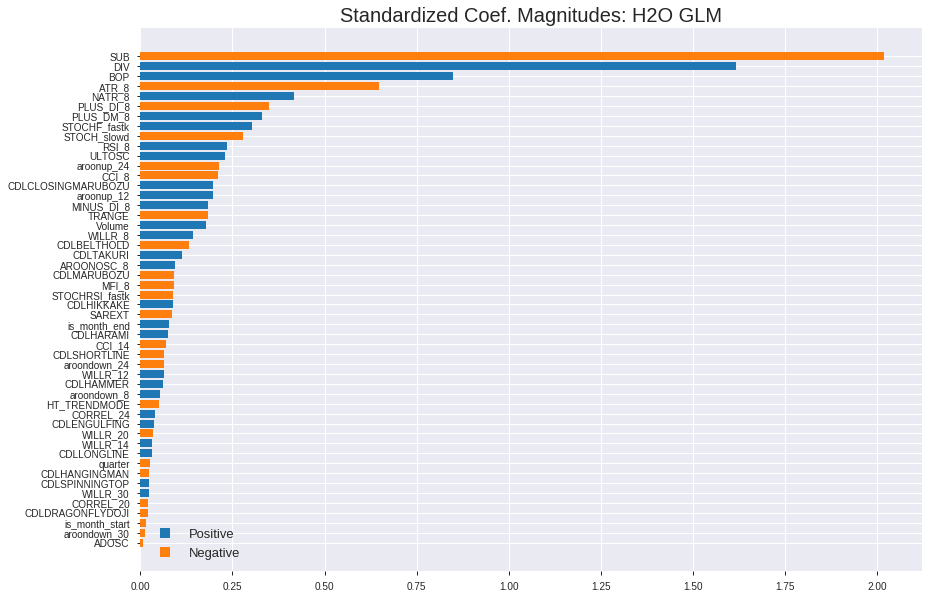

'log_likelihood'
--2019-08-24 19:05:35--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.93.163
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.93.163|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


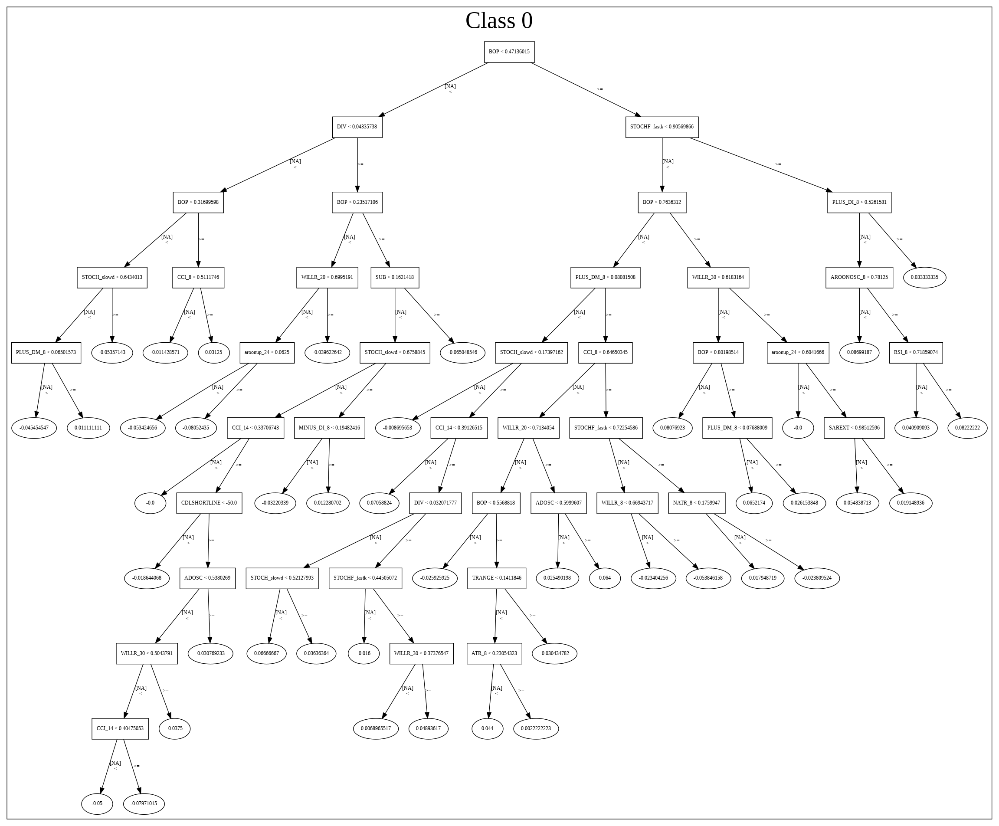

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190824_190525_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190824_190525_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_58_sid_ad7c',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_58_s

['SUB',
 'DIV',
 'BOP',
 'ATR_8',
 'NATR_8',
 'PLUS_DI_8',
 'PLUS_DM_8',
 'STOCHF_fastk',
 'STOCH_slowd',
 'RSI_8',
 'ULTOSC',
 'aroonup_24',
 'CCI_8',
 'CDLCLOSINGMARUBOZU',
 'aroonup_12',
 'MINUS_DI_8',
 'TRANGE',
 'Volume',
 'WILLR_8',
 'CDLBELTHOLD',
 'CDLTAKURI',
 'AROONOSC_8',
 'CDLMARUBOZU',
 'MFI_8',
 'STOCHRSI_fastk',
 'CDLHIKKAKE',
 'SAREXT',
 'is_month_end',
 'CDLHARAMI',
 'CCI_14',
 'CDLSHORTLINE',
 'aroondown_24',
 'WILLR_12',
 'CDLHAMMER',
 'aroondown_8',
 'HT_TRENDMODE',
 'CORREL_24',
 'CDLENGULFING',
 'WILLR_20',
 'WILLR_14',
 'CDLLONGLINE',
 'quarter',
 'CDLHANGINGMAN',
 'CDLSPINNINGTOP',
 'WILLR_30',
 'CORREL_20',
 'CDLDRAGONFLYDOJI',
 'is_month_start',
 'aroondown_30',
 'ADOSC']

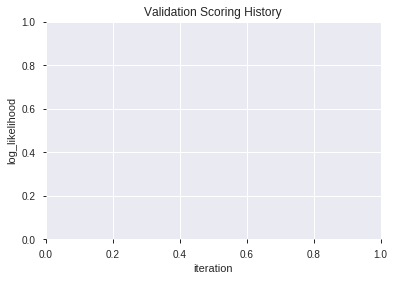

In [21]:
# GLM with top XGBoost features
model_train(feature_name='XGBF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_2_AutoML_20190824_190633,0.758423,0.599968,0.346401,0.453312,0.205492
1,XGBoost_1_AutoML_20190824_190633,0.756941,0.603700,0.284311,0.455734,0.207693
2,XGBoost_grid_1_AutoML_20190824_190633_model_2,0.754393,0.599509,0.333065,0.454031,0.206144
3,XGBoost_grid_1_AutoML_20190824_190633_model_1,0.751597,0.601535,0.321443,0.454382,0.206463
4,XGBoost_grid_1_AutoML_20190824_190633_model_3,0.750867,0.603539,0.319362,0.455409,0.207397
5,XGBoost_grid_1_AutoML_20190824_190633_model_7,0.749974,0.607930,0.328037,0.458003,0.209767
6,XGBoost_grid_1_AutoML_20190824_190633_model_4,0.749743,0.604198,0.322714,0.455920,0.207863
7,XGBoost_grid_1_AutoML_20190824_190633_model_6,0.749590,0.603244,0.336197,0.455388,0.207378
8,XGBoost_3_AutoML_20190824_190633,0.748550,0.603168,0.353105,0.456047,0.207979
9,XGBoost_grid_1_AutoML_20190824_190633_model_5,0.746243,0.619405,0.354745,0.461225,0.212728


,variable,relative_importance,scaled_importance,percentage
0,BOP,4917.768555,1.000000,0.245570
1,STOCHF_fastk,1316.057495,0.267613,0.065718
2,DIV,943.414246,0.191838,0.047110
3,CCI_8,834.834839,0.169759,0.041688
4,TRANGE,801.906555,0.163063,0.040043
5,STOCHRSI_fastk,780.783264,0.158768,0.038989
6,STOCH_slowd,654.284119,0.133045,0.032672
7,Volume,599.846130,0.121975,0.029953
8,CCI_14,556.645935,0.113191,0.027796
9,SAREXT,545.629578,0.110951,0.027246


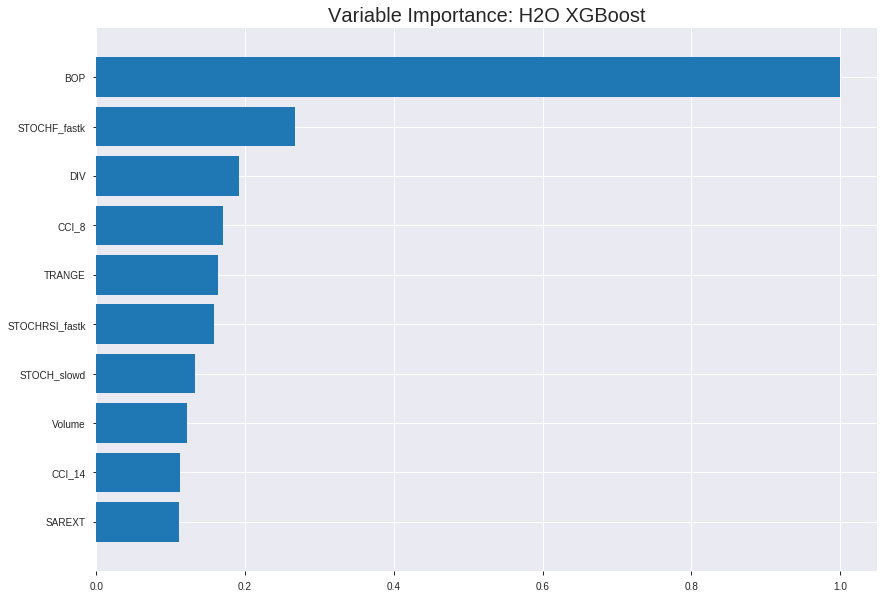

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_2_AutoML_20190824_190633


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.13268132696422769
RMSE: 0.36425448104893327
LogLoss: 0.427419675902129
Mean Per-Class Error: 0.16408876399673944
AUC: 0.9124724355399202
pr_auc: 0.9112291628707391
Gini: 0.8249448710798404
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5077677137321897: 


,0,1,Error,Rate
0,1858.0,342.0,0.1555,(342.0/2200.0)
1,366.0,1753.0,0.1727,(366.0/2119.0)
Total,2224.0,2095.0,0.1639,(708.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5077677,0.8319886,192.0
max f2,0.3229272,0.8910761,274.0
max f0point5,0.6089030,0.8476333,150.0
max accuracy,0.5077677,0.8360732,192.0
max precision,0.9579276,1.0,0.0
max recall,0.0855221,1.0,383.0
max specificity,0.9579276,1.0,0.0
max absolute_mcc,0.5077677,0.6720041,192.0
max min_per_class_accuracy,0.5021926,0.8319962,194.0
max mean_per_class_accuracy,0.5077677,0.8359112,192.0


Gains/Lift Table: Avg response rate: 49.06 %, avg score: 49.10 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.9236206,2.0382256,2.0382256,1.0,0.9361261,1.0,0.9361261,0.0207645,0.0207645,103.8225578,103.8225578
,2,0.0201436,0.9038097,2.0382256,2.0382256,1.0,0.9125657,1.0,0.9244813,0.0202926,0.0410571,103.8225578,103.8225578
,3,0.0300996,0.8929217,2.0382256,2.0382256,1.0,0.8984972,1.0,0.9158866,0.0202926,0.0613497,103.8225578,103.8225578
,4,0.0400556,0.8823690,1.9908250,2.0264439,0.9767442,0.8868787,0.9942197,0.9086765,0.0198207,0.0811704,99.0824983,102.6443927
,5,0.0500116,0.8730941,1.9908250,2.0193531,0.9767442,0.8775910,0.9907407,0.9024882,0.0198207,0.1009910,99.0824983,101.9353119
,6,0.1000232,0.8290467,1.9910444,2.0051988,0.9768519,0.8503464,0.9837963,0.8764173,0.0995753,0.2005663,99.1044430,100.5198775
,7,0.1500347,0.7955138,1.9816082,1.9973353,0.9722222,0.8120103,0.9799383,0.8549483,0.0991034,0.2996697,98.1608201,99.7335250
,8,0.2000463,0.7562149,1.9249908,1.9792491,0.9444444,0.7767333,0.9710648,0.8353945,0.0962718,0.3959415,92.4990824,97.9249144
,9,0.3000695,0.6770381,1.7504206,1.9029730,0.8587963,0.7176276,0.9336420,0.7961389,0.1750826,0.5710241,75.0420577,90.2972955
,10,0.4000926,0.5905962,1.5050786,1.8034994,0.7384259,0.6344342,0.8848380,0.7557127,0.1505427,0.7215668,50.5078610,80.3499369




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.19303542182427583
RMSE: 0.4393579654726608
LogLoss: 0.5663138993738035
Mean Per-Class Error: 0.291561194743884
AUC: 0.775334947283753
pr_auc: 0.7686079044380343
Gini: 0.5506698945675059
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36725615710020065: 


,0,1,Error,Rate
0,369.0,264.0,0.4171,(264.0/633.0)
1,112.0,489.0,0.1864,(112.0/601.0)
Total,481.0,753.0,0.3047,(376.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3672562,0.7223043,255.0
max f2,0.1565804,0.8421656,351.0
max f0point5,0.5735349,0.7096644,162.0
max accuracy,0.4962491,0.7090762,200.0
max precision,0.9559764,1.0,0.0
max recall,0.0704365,1.0,388.0
max specificity,0.9559764,1.0,0.0
max absolute_mcc,0.4962491,0.4174888,200.0
max min_per_class_accuracy,0.4685157,0.7038270,210.0
max mean_per_class_accuracy,0.4962491,0.7084388,200.0


Gains/Lift Table: Avg response rate: 48.70 %, avg score: 46.69 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.9232136,2.0532446,2.0532446,1.0,0.9334803,1.0,0.9334803,0.0216306,0.0216306,105.3244592,105.3244592
,2,0.0202593,0.8996070,2.0532446,2.0532446,1.0,0.9103335,1.0,0.9223698,0.0199667,0.0415973,105.3244592,105.3244592
,3,0.0299838,0.8791759,1.8821409,1.9977515,0.9166667,0.8903197,0.9729730,0.9119752,0.0183028,0.0599002,88.2140876,99.7751495
,4,0.0405186,0.8603572,1.8953027,1.9711148,0.9230769,0.8703689,0.96,0.9011576,0.0199667,0.0798669,89.5302701,97.1114809
,5,0.0502431,0.8518207,2.0532446,1.9870109,1.0,0.8558970,0.9677419,0.8923975,0.0199667,0.0998336,105.3244592,98.7010896
,6,0.1004862,0.7884393,1.7551930,1.8711019,0.8548387,0.8194717,0.9112903,0.8559346,0.0881864,0.1880200,75.5192958,87.1101927
,7,0.1499190,0.7503700,1.4137094,1.7202860,0.6885246,0.7693665,0.8378378,0.8273905,0.0698835,0.2579035,41.3709391,72.0286010
,8,0.2001621,0.7100261,1.5896087,1.6874844,0.7741935,0.7306670,0.8218623,0.8031117,0.0798669,0.3377704,58.9608717,68.7484422
,9,0.2998379,0.6355606,1.4356019,1.6037505,0.6991870,0.6744996,0.7810811,0.7603569,0.1430948,0.4808652,43.5601910,60.3750506
,10,0.4003241,0.5558979,1.2087650,1.5046043,0.5887097,0.5972148,0.7327935,0.7194062,0.1214642,0.6023295,20.8764962,50.4604337



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 19:06:37,0.003 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5093772,0.5,0.6931472,0.5,0.0,1.0,0.5129660
,2019-08-24 19:06:37,0.121 sec,5.0,0.4728452,0.6399732,0.8235942,0.8131419,1.9919023,0.2769160,0.4792538,0.6522601,0.7560582,0.7379547,2.0532446,0.3087520
,2019-08-24 19:06:37,0.240 sec,10.0,0.4528640,0.6015416,0.8361497,0.8310978,2.0382256,0.2681176,0.4649926,0.6242387,0.7648416,0.7528417,2.0532446,0.3055105
,2019-08-24 19:06:37,0.360 sec,15.0,0.4380745,0.5729607,0.8472772,0.8419194,2.0382256,0.2681176,0.4573398,0.6086781,0.7648574,0.7555272,2.0532446,0.3022690
,2019-08-24 19:06:37,0.493 sec,20.0,0.4263143,0.5499085,0.8548286,0.8504867,2.0382256,0.2556147,0.4512846,0.5959146,0.7683298,0.7615661,2.0532446,0.3022690
,2019-08-24 19:06:37,0.625 sec,25.0,0.4170374,0.5315522,0.8620422,0.8572468,2.0382256,0.2264413,0.4476636,0.5877521,0.7692721,0.7581080,2.0532446,0.3038898
,2019-08-24 19:06:37,0.762 sec,30.0,0.4087175,0.5147735,0.8685023,0.8622810,2.0382256,0.2269044,0.4451489,0.5815108,0.7693575,0.7569533,2.0532446,0.3119935
,2019-08-24 19:06:38,0.897 sec,35.0,0.4019216,0.5009988,0.8739554,0.8696621,2.0382256,0.2218106,0.4432864,0.5768922,0.7707362,0.7607986,2.0532446,0.3022690
,2019-08-24 19:06:38,1.032 sec,40.0,0.3959181,0.4889976,0.8801458,0.8762519,2.0382256,0.2137069,0.4420102,0.5737835,0.7719782,0.7604312,2.0532446,0.3192869
,2019-08-24 19:06:38,1.186 sec,45.0,0.3907289,0.4783408,0.8840164,0.8805865,2.0382256,0.2076870,0.4418707,0.5728792,0.7708861,0.7634388,2.0532446,0.3192869


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,4917.7685547,1.0,0.2455703
STOCHF_fastk,1316.0574951,0.2676127,0.0657177
DIV,943.4142456,0.1918379,0.0471097
CCI_8,834.8348389,0.1697589,0.0416877
TRANGE,801.9065552,0.1630631,0.0400434
---,---,---,---
CDLSPINNINGTOP,37.1203079,0.0075482,0.0018536
CDLHAMMER,24.3263016,0.0049466,0.0012147
CDLTAKURI,18.7826309,0.0038193,0.0009379
CDLBELTHOLD,17.7470589,0.0036088,0.0008862



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6985413290113452)

('F1', 0.7260981912144702)

('auc', 0.7584226565783942)

('logloss', 0.5999681368727492)

('mean_per_class_error', 0.30197562000840694)

('rmse', 0.4533122937694283)

('mse', 0.20549203568250046)

xgboost prediction progress: |████████████████████████████████████████████| 100%


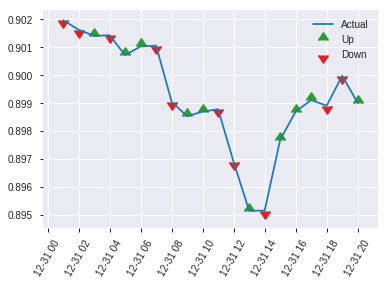


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.20549203568250046
RMSE: 0.4533122937694283
LogLoss: 0.5999681368727492
Mean Per-Class Error: 0.30197562000840694
AUC: 0.7584226565783942
pr_auc: 0.743945696666309
Gini: 0.5168453131567885
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2232656478881836: 


,0,1,Error,Rate
0,124.0,181.0,0.5934,(181.0/305.0)
1,31.0,281.0,0.0994,(31.0/312.0)
Total,155.0,462.0,0.3436,(212.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2232656,0.7260982,305.0
max f2,0.0705880,0.8487486,380.0
max f0point5,0.5359623,0.7026144,154.0
max accuracy,0.3949385,0.6985413,223.0
max precision,0.9174893,1.0,0.0
max recall,0.0705880,1.0,380.0
max specificity,0.9174893,1.0,0.0
max absolute_mcc,0.3896932,0.3982310,226.0
max min_per_class_accuracy,0.4355073,0.6852459,206.0
max mean_per_class_accuracy,0.3949385,0.6980244,223.0


Gains/Lift Table: Avg response rate: 50.57 %, avg score: 43.51 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8934352,1.6950549,1.6950549,0.8571429,0.9046418,0.8571429,0.9046418,0.0192308,0.0192308,69.5054945,69.5054945
,2,0.0210697,0.8649254,1.3183761,1.5212032,0.6666667,0.8773255,0.7692308,0.8920343,0.0128205,0.0320513,31.8376068,52.1203156
,3,0.0307942,0.8488734,1.6479701,1.5612348,0.8333333,0.8549649,0.7894737,0.8803282,0.0160256,0.0480769,64.7970085,56.1234818
,4,0.0405186,0.8391872,1.9775641,1.6611538,1.0,0.8441198,0.84,0.8716382,0.0192308,0.0673077,97.7564103,66.1153846
,5,0.0502431,0.8278982,1.9775641,1.7223945,1.0,0.8343018,0.8709677,0.8644118,0.0192308,0.0865385,97.7564103,72.2394541
,6,0.1004862,0.7646945,1.6586022,1.6904983,0.8387097,0.7911475,0.8548387,0.8277796,0.0833333,0.1698718,65.8602151,69.0498346
,7,0.1507293,0.7169659,1.6586022,1.6798663,0.8387097,0.7396649,0.8494624,0.7984081,0.0833333,0.2532051,65.8602151,67.9866281
,8,0.2009724,0.6836644,1.5948098,1.6586022,0.8064516,0.7009236,0.8387097,0.7740369,0.0801282,0.3333333,59.4809760,65.8602151
,9,0.2998379,0.5984846,1.2967633,1.5392931,0.6557377,0.6351332,0.7783784,0.7282362,0.1282051,0.4615385,29.6763346,53.9293139
,10,0.4003241,0.5174484,1.1801592,1.4491462,0.5967742,0.5555286,0.7327935,0.6848845,0.1185897,0.5801282,18.0159222,44.9146164


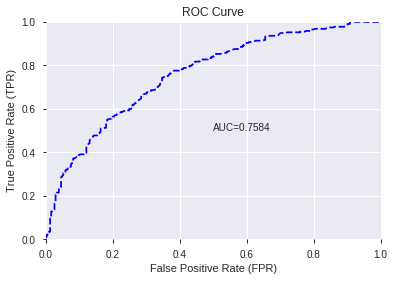

This function is available for GLM models only


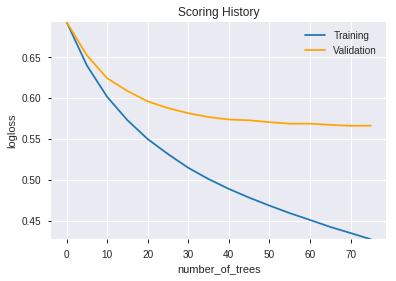

--2019-08-24 19:07:10--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.99.179
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.99.179|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip


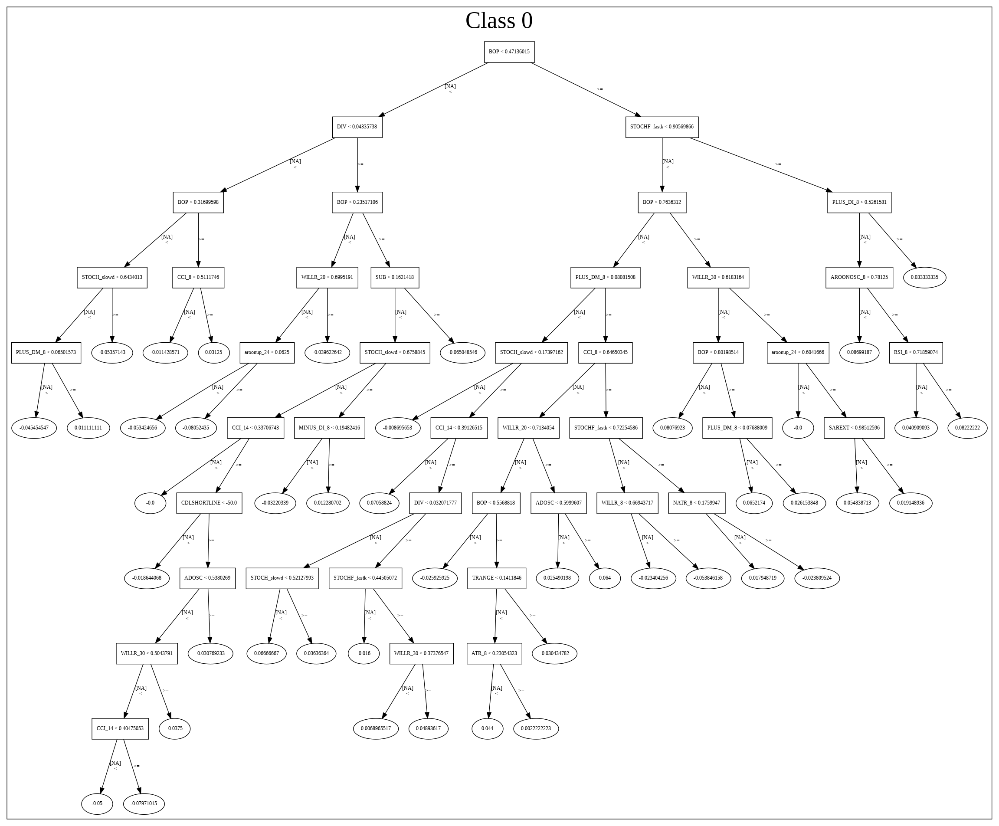

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_2_AutoML_20190824_190633',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_2_AutoML_20190824_190633',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_66_sid_ad7c',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_66_sid_ad7c',
   'type

['BOP',
 'STOCHF_fastk',
 'DIV',
 'CCI_8',
 'TRANGE',
 'STOCHRSI_fastk',
 'STOCH_slowd',
 'Volume',
 'CCI_14',
 'SAREXT',
 'ADOSC',
 'MFI_8',
 'ULTOSC',
 'WILLR_8',
 'aroonup_24',
 'PLUS_DM_8',
 'WILLR_12',
 'NATR_8',
 'MINUS_DI_8',
 'PLUS_DI_8',
 'SUB',
 'WILLR_30',
 'WILLR_20',
 'ATR_8',
 'aroonup_12',
 'RSI_8',
 'aroondown_30',
 'WILLR_14',
 'aroondown_24',
 'aroondown_8',
 'AROONOSC_8',
 'CDLCLOSINGMARUBOZU',
 'quarter',
 'CDLSHORTLINE',
 'HT_TRENDMODE',
 'CDLLONGLINE',
 'CORREL_24',
 'CDLDRAGONFLYDOJI',
 'CDLSPINNINGTOP',
 'CDLHAMMER',
 'CDLTAKURI',
 'CDLBELTHOLD',
 'CDLHIKKAKE']

In [22]:
# XGBoost with top XGBoost features
model_train(feature_name='XGBF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

In [0]:
# PCA
try:
  del xgb_features,glm_features,dl_features
except:
  pass
gc.collect()

if features_to_include is True or 'PCA' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.pca import H2OPrincipalComponentAnalysisEstimator
      h2o_model = H2OPrincipalComponentAnalysisEstimator(seed=1, k=PCA_k, pca_method="GramSVD", max_iterations=10000)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OPrincipalComponentAnalysisEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [24]:
# DeepLearning with PCA
model_train(feature_name='PCA',model_algo="DeepLearning",training_frame=training_frame)

[]

In [25]:
# GLM with PCA
model_train(feature_name='PCA',model_algo="GLM",training_frame=training_frame)

[]

In [26]:
# XGBoost with PCA
model_train(feature_name='PCA',model_algo="XGBoost",training_frame=training_frame)

[]

In [0]:
# Generalized Low Rank
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'GLRM' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.glrm import H2OGeneralizedLowRankEstimator

      h2o_model = H2OGeneralizedLowRankEstimator(seed=1, k=GLRM_k)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OGeneralizedLowRankEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [28]:
# DeepLearning with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="DeepLearning",training_frame=training_frame)

[]

In [29]:
# GLM with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="GLM",training_frame=training_frame)

[]

In [30]:
# XGBoost with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="XGBoost",training_frame=training_frame)

[]

In [0]:
# High Correlation Filter 
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'HCF' in features_to_include:
  corr_matrix = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).corr().abs()

  upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

  features_list = [column for column in upper.columns if not any(upper[column] > HCF_threshold)]

  del corr_matrix, upper
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [32]:
# DeepLearning with low correlation features
model_train(feature_name='HCF',model_algo="DeepLearning",features_list=features_list)

[]

In [33]:
# GLM with low correlation features
model_train(feature_name='HCF',model_algo="GLM",features_list=features_list)

[]

In [34]:
# XGBoost with low correlation features
model_train(feature_name='HCF',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
#	Low Variance Filter  
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'LVF' in features_to_include:
  df_variance = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).var()
  features_list = [column for column in df_variance.index if df_variance[column]  > LVF_threshold]

  del df_variance
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [36]:
# DeepLearning with Low Variance features  
model_train(feature_name='LVF',model_algo="DeepLearning",features_list=features_list)

[]

In [37]:
# GLM with Low Variance features  
model_train(feature_name='LVF',model_algo="GLM",features_list=features_list)

[]

In [38]:
# XGBoost with Low Variance features  
model_train(feature_name='LVF',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select k best features
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'KBest' in features_to_include:
  from sklearn.feature_selection import SelectKBest
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectKBest(score_func=f_classif, k=select_k).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectKBest, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [40]:
# DeepLearning with Select k best features 
model_train(feature_name='KBest',model_algo="DeepLearning",features_list=features_list)

[]

In [41]:
# GLM with Select k best features
model_train(feature_name='KBest',model_algo="GLM",features_list=features_list)

[]

In [42]:
# XGBoost with Select k best features
model_train(feature_name='KBest',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select Percentile
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Percentile' in features_to_include:
  from sklearn.feature_selection import SelectPercentile
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectPercentile(score_func=f_classif, percentile=select_percentile).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectPercentile, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [44]:
# DeepLearning with Select Percentile features  
model_train(feature_name='Percentile',model_algo="DeepLearning",features_list=features_list)

[]

In [45]:
# GLM with Select Percentile features  
model_train(feature_name='Percentile',model_algo="GLM",features_list=features_list)

[]

In [46]:
# XGBoost with Select Percentile features  
model_train(feature_name='Percentile',model_algo="XGBoost",features_list=features_list)

[]

In [47]:
# Select Family-wise error
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Fwe' in features_to_include:
  from sklearn.feature_selection import SelectFwe
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectFwe(score_func=f_classif, alpha=select_alpha).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectFwe, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:114: UserWarning: Features [12] are constant.
  UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:115: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:721: RuntimeWarning: invalid value encountered in less
  return (self.pvalues_ < self.alpha / len(self.pvalues_))


78

['Volume',
 'BOP',
 'CCI_8',
 'CMO_8',
 'MACDFIX_hist_8',
 'MINUS_DI_8',
 'MINUS_DM_8',
 'MOM_8',
 'ROC_8',
 'ROCP_8',
 'ROCR_8',
 'ROCR100_8',
 'RSI_8',
 'WILLR_8',
 'CCI_12',
 'CMO_12',
 'MINUS_DM_12',
 'MOM_12',
 'ROC_12',
 'ROCP_12',
 'ROCR_12',
 'ROCR100_12',
 'RSI_12',
 'WILLR_12',
 'aroondown_14',
 'CCI_14',
 'CMO_14',
 'MINUS_DM_14',
 'MOM_14',
 'ROC_14',
 'ROCP_14',
 'ROCR_14',
 'ROCR100_14',
 'RSI_14',
 'WILLR_14',
 'CCI_20',
 'CMO_20',
 'RSI_20',
 'WILLR_20',
 'CCI_24',
 'CMO_24',
 'RSI_24',
 'WILLR_24',
 'CCI_30',
 'CMO_30',
 'RSI_30',
 'WILLR_30',
 'MACD_hist',
 'STOCH_slowk',
 'STOCHF_fastk',
 'STOCHF_fastd',
 'STOCHRSI_fastk',
 'STOCHRSI_fastd',
 'ULTOSC',
 'ADOSC',
 'ATR_8',
 'NATR_8',
 'ATR_12',
 'NATR_12',
 'ATR_14',
 'NATR_14',
 'TRANGE',
 'CDL3OUTSIDE',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'CDLDRAGONFLYDOJI',
 'CDLENGULFING',
 'CDLHANGINGMAN',
 'CDLHARAMI',
 'CDLLONGLINE',
 'CDLMARUBOZU',
 'CDLSHORTLINE',
 'CDLSPINNINGTOP',
 'CDLTAKURI',
 'LINEARREG_ANGLE_8',
 'L

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190824_190810_model_8,0.743511,0.596332,0.358097,0.453090,0.205291
1,DeepLearning_1_AutoML_20190824_190810,0.737642,0.615067,0.353216,0.459584,0.211217
2,DeepLearning_grid_1_AutoML_20190824_190810_model_9,0.735850,0.614318,0.364617,0.459671,0.211297
3,DeepLearning_grid_1_AutoML_20190824_190810_model_7,0.733785,0.729302,0.383092,0.477432,0.227941
4,DeepLearning_grid_1_AutoML_20190824_190810_model_4,0.732204,0.669847,0.358244,0.474154,0.224822
5,DeepLearning_grid_1_AutoML_20190824_190810_model_5,0.729487,0.609429,0.348371,0.457980,0.209746
6,DeepLearning_grid_1_AutoML_20190824_190810_model_6,0.729266,0.624181,0.370917,0.463441,0.214777
7,DeepLearning_grid_1_AutoML_20190824_190810_model_2,0.726445,0.667037,0.335829,0.470196,0.221085
8,DeepLearning_grid_1_AutoML_20190824_190810_model_3,0.723713,0.714290,0.356384,0.481968,0.232293
9,DeepLearning_grid_1_AutoML_20190824_190810_model_1,0.701834,0.887586,0.379114,0.504103,0.254120


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.034717
1,CDLCLOSINGMARUBOZU,0.856830,0.856830,0.029746
2,DIV,0.646613,0.646613,0.022448
3,Volume,0.631325,0.631325,0.021918
4,SUB,0.622602,0.622602,0.021615
5,aroondown_14,0.591452,0.591452,0.020533
6,TRANGE,0.583450,0.583450,0.020255
7,STOCHF_fastk,0.583130,0.583130,0.020244
8,CDLLONGLINE,0.575186,0.575186,0.019969
9,ULTOSC,0.514072,0.514072,0.017847


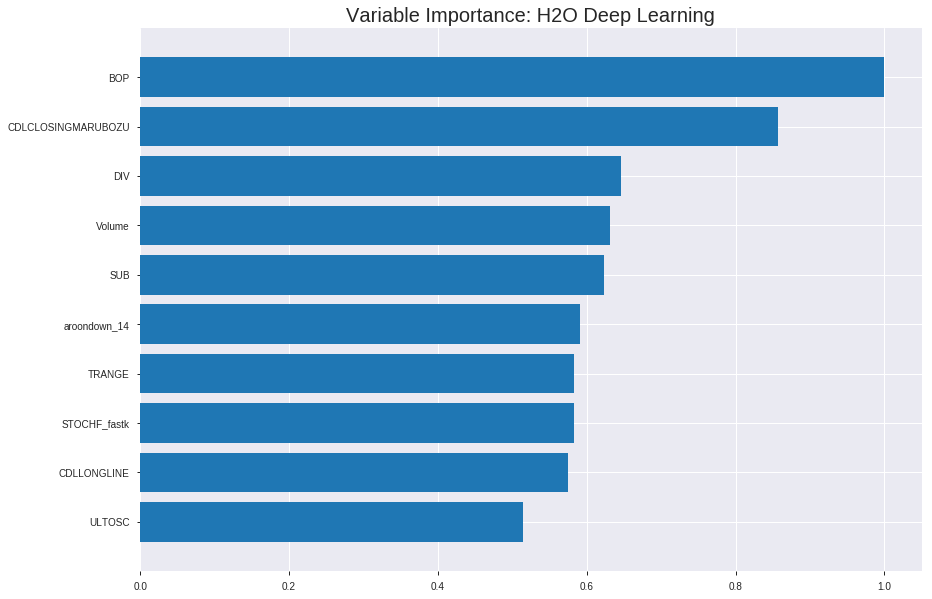

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190824_190810_model_8


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.18725007910581584
RMSE: 0.43272402187285125
LogLoss: 0.5556773414250107
Mean Per-Class Error: 0.2746607533570724
AUC: 0.8018440302029259
pr_auc: 0.7852737853777989
Gini: 0.6036880604058519
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.43459494194125664: 


,0,1,Error,Rate
0,1243.0,957.0,0.435,(957.0/2200.0)
1,304.0,1815.0,0.1435,(304.0/2119.0)
Total,1547.0,2772.0,0.292,(1261.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4345949,0.7421795,233.0
max f2,0.2771465,0.8472778,315.0
max f0point5,0.5896381,0.7301053,153.0
max accuracy,0.5530539,0.7253994,171.0
max precision,0.9507974,1.0,0.0
max recall,0.0538874,1.0,392.0
max specificity,0.9507974,1.0,0.0
max absolute_mcc,0.4847481,0.4532796,205.0
max min_per_class_accuracy,0.5307713,0.7229825,182.0
max mean_per_class_accuracy,0.4847481,0.7253392,205.0


Gains/Lift Table: Avg response rate: 49.06 %, avg score: 51.83 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.9213497,1.9455790,1.9455790,0.9545455,0.9337751,0.9545455,0.9337751,0.0198207,0.0198207,94.5578961,94.5578961
,2,0.0201436,0.8952150,1.9908250,1.9679419,0.9767442,0.9085788,0.9655172,0.9213217,0.0198207,0.0396413,99.0824983,96.7941937
,3,0.0300996,0.8655820,1.8486232,1.9284750,0.9069767,0.8805005,0.9461538,0.9078193,0.0184049,0.0580462,84.8623199,92.8474970
,4,0.0400556,0.8370611,1.9434244,1.9321907,0.9534884,0.8512458,0.9479769,0.8937577,0.0193487,0.0773950,94.3424388,93.2190721
,5,0.0500116,0.8111153,1.6590208,1.8778097,0.8139535,0.8236916,0.9212963,0.8798094,0.0165172,0.0939122,65.9020819,87.7809676
,6,0.1000232,0.7514606,1.7834474,1.8306285,0.875,0.7783801,0.8981481,0.8290947,0.0891930,0.1831052,78.3447381,83.0628528
,7,0.1500347,0.7212610,1.7551387,1.8054652,0.8611111,0.7358496,0.8858025,0.7980130,0.0877773,0.2708825,75.5138692,80.5465250
,8,0.2000463,0.6988386,1.5286692,1.7362662,0.75,0.7107460,0.8518519,0.7761962,0.0764512,0.3473336,52.8669184,73.6266233
,9,0.3000695,0.6538294,1.4012801,1.6246042,0.6875,0.6776975,0.7970679,0.7433633,0.1401605,0.4874941,40.1280085,62.4604184
,10,0.4000926,0.5947494,1.3305084,1.5510802,0.6527778,0.6260577,0.7609954,0.7140369,0.1330816,0.6205757,33.0508363,55.1080229




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.19375341819861874
RMSE: 0.44017430433706456
LogLoss: 0.5692174631710878
Mean Per-Class Error: 0.2763009518101742
AUC: 0.7778583876793023
pr_auc: 0.7703744591075198
Gini: 0.5557167753586045
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.43938001654983955: 


,0,1,Error,Rate
0,382.0,251.0,0.3965,(251.0/633.0)
1,124.0,477.0,0.2063,(124.0/601.0)
Total,506.0,728.0,0.3039,(375.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4393800,0.7178330,226.0
max f2,0.2991234,0.8391608,304.0
max f0point5,0.5313689,0.7225943,177.0
max accuracy,0.5313689,0.7244733,177.0
max precision,0.9557701,1.0,0.0
max recall,0.1218068,1.0,375.0
max specificity,0.9557701,1.0,0.0
max absolute_mcc,0.5313689,0.4486457,177.0
max min_per_class_accuracy,0.4993065,0.7171381,193.0
max mean_per_class_accuracy,0.5222273,0.7236990,182.0


Gains/Lift Table: Avg response rate: 48.70 %, avg score: 49.78 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.9130029,2.0532446,2.0532446,1.0,0.9291916,1.0,0.9291916,0.0216306,0.0216306,105.3244592,105.3244592
,2,0.0202593,0.8974538,2.0532446,2.0532446,1.0,0.9051887,1.0,0.9176702,0.0199667,0.0415973,105.3244592,105.3244592
,3,0.0299838,0.8739074,2.0532446,2.0532446,1.0,0.8847995,1.0,0.9070094,0.0199667,0.0615641,105.3244592,105.3244592
,4,0.0405186,0.8367482,1.7373608,1.9711148,0.8461538,0.8584283,0.96,0.8943783,0.0183028,0.0798669,73.7360809,97.1114809
,5,0.0502431,0.8003062,1.7110372,1.9207772,0.8333333,0.8190295,0.9354839,0.8797947,0.0166389,0.0965058,71.1037160,92.0777199
,6,0.1004862,0.7367394,1.8545435,1.8876604,0.9032258,0.7577702,0.9193548,0.8187824,0.0931780,0.1896839,85.4543503,88.7660351
,7,0.1499190,0.7018857,1.4137094,1.7313846,0.6885246,0.7196416,0.8432432,0.7860927,0.0698835,0.2595674,41.3709391,73.1384629
,8,0.2001621,0.6750816,1.5233750,1.6791717,0.7419355,0.6886747,0.8178138,0.7616396,0.0765391,0.3361065,52.3375020,67.9171691
,9,0.2998379,0.6261164,1.5023741,1.6203984,0.7317073,0.6508526,0.7891892,0.7248104,0.1497504,0.4858569,50.2374092,62.0398435
,10,0.4003241,0.5737381,1.2749987,1.5336989,0.6209677,0.6003165,0.7469636,0.6935609,0.1281198,0.6139767,27.4998658,53.3698896



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 19:22:51,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-24 19:22:53,4 min 15.723 sec,439 obs/sec,0.2257467,1,975.0,0.5611241,1.1830638,-0.2598840,0.6978845,0.6672340,1.8066090,0.3776337,0.5736240,1.2970555,-0.3170636,0.6902319,0.6598078,1.7373608,0.3914100
,2019-08-24 19:23:32,4 min 54.330 sec,887 obs/sec,7.6246816,32,32931.0,0.4507435,0.5997406,0.1870354,0.7690443,0.7437887,1.8529323,0.3047002,0.4469124,0.5892139,0.2005398,0.7709150,0.7580059,2.0532446,0.3168558
,2019-08-24 19:24:09,5 min 31.910 sec,1013 obs/sec,16.6645057,70,71974.0,0.4391427,0.5666745,0.2283434,0.7830232,0.7618019,1.8066090,0.3019217,0.4434971,0.5824575,0.2127120,0.7743019,0.7623483,1.8953027,0.3152350
,2019-08-24 19:24:47,6 min 9.568 sec,1078 obs/sec,26.1720306,110,113037.0,0.4445657,0.5974102,0.2091671,0.7902567,0.7578879,1.8066090,0.2889558,0.4436200,0.5878575,0.2122754,0.7809430,0.7626275,2.0532446,0.2811994
,2019-08-24 19:25:26,6 min 48.511 sec,1137 obs/sec,36.8786756,155,159279.0,0.4327240,0.5556773,0.2507361,0.8018440,0.7852738,1.9455790,0.2919657,0.4401743,0.5692175,0.2244648,0.7778584,0.7703745,2.0532446,0.3038898
,2019-08-24 19:26:04,7 min 26.883 sec,1177 obs/sec,47.6341746,200,205732.0,0.4257714,0.5371066,0.2746197,0.8095387,0.7925945,1.9919023,0.2817782,0.4421164,0.5750228,0.2176063,0.7771342,0.7625331,2.0532446,0.3055105
,2019-08-24 19:26:42,8 min 4.416 sec,1208 obs/sec,58.3510072,245,252018.0,0.4188253,0.5239940,0.2980946,0.8188166,0.7988812,1.9455790,0.2681176,0.4441675,0.5821075,0.2103297,0.7694509,0.7478349,2.0532446,0.2949757
,2019-08-24 19:27:19,8 min 41.839 sec,1231 obs/sec,69.0578838,290,298261.0,0.4165171,0.5186817,0.3058098,0.8295938,0.8156413,1.9919023,0.2651077,0.4463193,0.5819605,0.2026603,0.7639808,0.7487730,2.0532446,0.3249595
,2019-08-24 19:27:23,8 min 45.632 sec,1231 obs/sec,69.0578838,290,298261.0,0.4327240,0.5556773,0.2507361,0.8018440,0.7852738,1.9455790,0.2919657,0.4401743,0.5692175,0.2244648,0.7778584,0.7703745,2.0532446,0.3038898


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0347168
CDLCLOSINGMARUBOZU,0.8568295,0.8568295,0.0297464
DIV,0.6466132,0.6466132,0.0224483
Volume,0.6313251,0.6313251,0.0219176
SUB,0.6226022,0.6226022,0.0216147
---,---,---,---
CMO_14,0.2465267,0.2465267,0.0085586
CMO_8,0.2440410,0.2440410,0.0084723
RSI_8,0.2419389,0.2419389,0.0083993
CMO_12,0.2368619,0.2368619,0.0082231



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6823338735818476)

('F1', 0.7238335435056746)

('auc', 0.7435109289617486)

('logloss', 0.5963324680645975)

('mean_per_class_error', 0.3172288776796973)

('rmse', 0.45309021574552466)

('mse', 0.20529074360432606)

deeplearning prediction progress: |███████████████████████████████████████| 100%


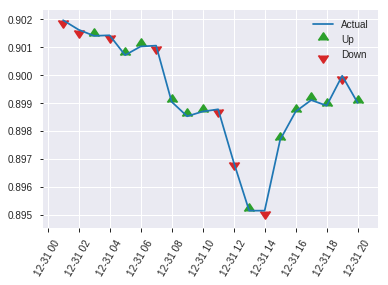


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.20529074360432606
RMSE: 0.45309021574552466
LogLoss: 0.5963324680645975
Mean Per-Class Error: 0.3172288776796973
AUC: 0.7435109289617486
pr_auc: 0.73221567473225
Gini: 0.4870218579234973
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.33649850251379115: 


,0,1,Error,Rate
0,111.0,194.0,0.6361,(194.0/305.0)
1,25.0,287.0,0.0801,(25.0/312.0)
Total,136.0,481.0,0.3549,(219.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3364985,0.7238335,296.0
max f2,0.2447828,0.8510045,340.0
max f0point5,0.5656583,0.6913183,152.0
max accuracy,0.5218153,0.6823339,179.0
max precision,0.9564681,1.0,0.0
max recall,0.0734966,1.0,392.0
max specificity,0.9564681,1.0,0.0
max absolute_mcc,0.5218153,0.3664948,179.0
max min_per_class_accuracy,0.4867095,0.6698718,193.0
max mean_per_class_accuracy,0.5218153,0.6827711,179.0


Gains/Lift Table: Avg response rate: 50.57 %, avg score: 48.78 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.9072128,1.6950549,1.6950549,0.8571429,0.9244065,0.8571429,0.9244065,0.0192308,0.0192308,69.5054945,69.5054945
,2,0.0210697,0.8740187,1.6479701,1.6733235,0.8333333,0.8909156,0.8461538,0.9089492,0.0160256,0.0352564,64.7970085,67.3323471
,3,0.0307942,0.8626836,1.6479701,1.6653171,0.8333333,0.8688264,0.8421053,0.8962788,0.0160256,0.0512821,64.7970085,66.5317139
,4,0.0405186,0.8318752,1.9775641,1.7402564,1.0,0.8518905,0.88,0.8856256,0.0192308,0.0705128,97.7564103,74.0256410
,5,0.0502431,0.8017755,1.9775641,1.7861869,1.0,0.8195513,0.9032258,0.8728371,0.0192308,0.0897436,97.7564103,78.6186931
,6,0.1004862,0.7255981,1.5310174,1.6586022,0.7741935,0.7606291,0.8387097,0.8167331,0.0769231,0.1666667,53.1017370,65.8602151
,7,0.1507293,0.6934203,1.4672250,1.5948098,0.7419355,0.7096266,0.8064516,0.7810309,0.0737179,0.2403846,46.7224979,59.4809760
,8,0.2009724,0.6645656,1.4672250,1.5629136,0.7419355,0.6800193,0.7903226,0.7557780,0.0737179,0.3141026,46.7224979,56.2913565
,9,0.2998379,0.6144249,1.3940206,1.5072245,0.7049180,0.6396370,0.7621622,0.7174829,0.1378205,0.4519231,39.4020597,50.7224532
,10,0.4003241,0.5532127,1.1801592,1.4251272,0.5967742,0.5829577,0.7206478,0.6837154,0.1185897,0.5705128,18.0159222,42.5127167


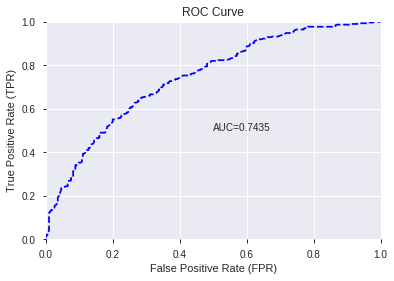

This function is available for GLM models only


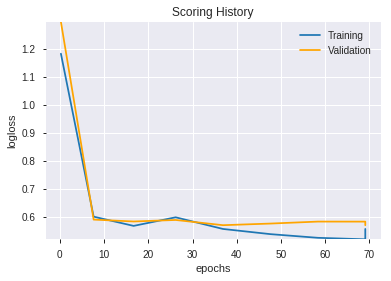

--2019-08-24 19:33:51--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.37.196
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.37.196|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


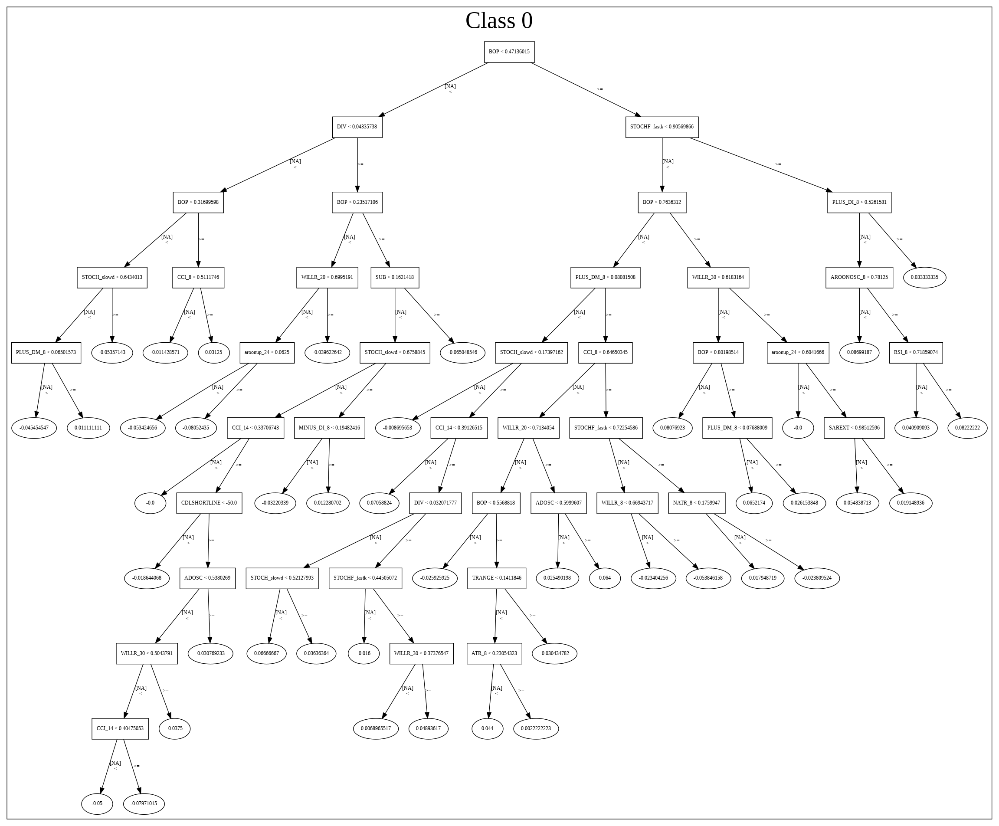

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190824_190810_model_8',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190824_190810_model_8',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_74_sid_ad7c',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'CDLCLOSINGMARUBOZU',
 'DIV',
 'Volume',
 'SUB',
 'aroondown_14',
 'TRANGE',
 'STOCHF_fastk',
 'CDLLONGLINE',
 'ULTOSC',
 'CDLSPINNINGTOP',
 'STOCHRSI_fastk',
 'CDLSHORTLINE',
 'CCI_8',
 'CDLHARAMI',
 'CDLENGULFING',
 'ADOSC',
 'CCI_30',
 'STOCH_slowk',
 'STOCHF_fastd',
 'MINUS_DI_8',
 'CCI_14',
 'STOCHRSI_fastd',
 'CCI_12',
 'WILLR_8',
 'CDLBELTHOLD',
 'WILLR_12',
 'WILLR_14',
 'WILLR_20',
 'WILLR_24',
 'MOM_8',
 'MINUS_DM_8',
 'ROCP_12',
 'ROC_8',
 'NATR_14',
 'ROCR_12',
 'MOM_12',
 'ATR_8',
 'MINUS_DM_14',
 'NATR_12',
 'ROCR100_12',
 'CCI_20',
 'ROC_12',
 'ROCR100_8',
 'CDLDRAGONFLYDOJI',
 'ATR_14',
 'NATR_8',
 'ROCP_8',
 'CDLTAKURI',
 'CDLHANGINGMAN',
 'MINUS_DM_12',
 'ROCR_8',
 'WILLR_30',
 'ROCR_14',
 'LINEARREG_ANGLE_8',
 'ATR_12',
 'MOM_14',
 'MACDFIX_hist_8',
 'MACD_hist',
 'LINEARREG_SLOPE_8',
 'ROCR100_14',
 'ROC_14',
 'ROCP_14',
 'RSI_30',
 'CDLMARUBOZU',
 'CCI_24',
 'CMO_30',
 'RSI_24',
 'CDL3OUTSIDE',
 'CMO_24',
 'RSI_20',
 'RSI_14',
 'CMO_20',
 'CMO_14',
 'CMO_8

In [48]:
# DeepLearning with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190824_193449_model_1,0.751245,0.606247,0.327853,0.454894,0.206928


,variable,relative_importance,scaled_importance,percentage
0,ATR_12,4.200220,1.000000,0.083920
1,MACD_hist,4.143524,0.986502,0.082787
2,MACDFIX_hist_8,4.118519,0.980549,0.082287
3,ATR_14,2.907441,0.692212,0.058090
4,SUB,2.574046,0.612836,0.051429
5,DIV,2.243412,0.534118,0.044823
6,MINUS_DM_12,2.147376,0.511253,0.042904
7,NATR_12,2.046329,0.487196,0.040885
8,NATR_14,1.979861,0.471371,0.039557
9,MOM_8,1.827674,0.435138,0.036517


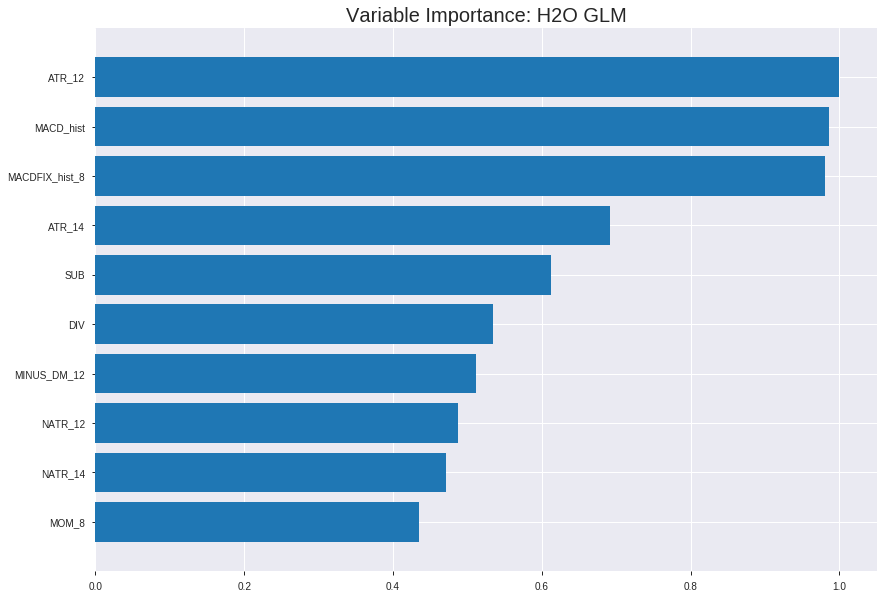

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190824_193449_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.1890912260276472
RMSE: 0.43484620962778
LogLoss: 0.5594733021481023
Null degrees of freedom: 4318
Residual degrees of freedom: 4240
Null deviance: 5985.886154969303
Residual deviance: 4832.730383955308
AIC: 4990.730383955308
AUC: 0.7844997640396414
pr_auc: 0.7622748392471714
Gini: 0.5689995280792828
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3580113257404484: 


,0,1,Error,Rate
0,1140.0,1060.0,0.4818,(1060.0/2200.0)
1,273.0,1846.0,0.1288,(273.0/2119.0)
Total,1413.0,2906.0,0.3086,(1333.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3580113,0.7347264,258.0
max f2,0.1807736,0.8416612,334.0
max f0point5,0.5843935,0.7181408,156.0
max accuracy,0.4976677,0.7166011,194.0
max precision,0.9713601,1.0,0.0
max recall,0.0322347,1.0,394.0
max specificity,0.9713601,1.0,0.0
max absolute_mcc,0.4976677,0.4337698,194.0
max min_per_class_accuracy,0.5110000,0.7140160,189.0
max mean_per_class_accuracy,0.4976677,0.7168749,194.0


Gains/Lift Table: Avg response rate: 49.06 %, avg score: 49.06 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.9186215,1.9919023,1.9919023,0.9772727,0.9331406,0.9772727,0.9331406,0.0202926,0.0202926,99.1902270,99.1902270
,2,0.0201436,0.8951945,1.8012226,1.8976583,0.8837209,0.9061144,0.9310345,0.9197828,0.0179330,0.0382256,80.1222604,89.7658297
,3,0.0300996,0.8775631,1.8486232,1.8814390,0.9069767,0.8849852,0.9230769,0.9082728,0.0184049,0.0566305,84.8623199,88.1438995
,4,0.0400556,0.8647667,1.8012226,1.8615008,0.8837209,0.8705721,0.9132948,0.8989021,0.0179330,0.0745635,80.1222604,86.1500817
,5,0.0500116,0.8531907,1.5642196,1.8023198,0.7674419,0.8589515,0.8842593,0.8909490,0.0155734,0.0901369,56.4219630,80.2319840
,6,0.1000232,0.8043685,1.6702126,1.7362662,0.8194444,0.8272015,0.8518519,0.8590752,0.0835300,0.1736668,67.0212627,73.6266233
,7,0.1500347,0.7670674,1.6324677,1.7016667,0.8009259,0.7852402,0.8348765,0.8344636,0.0816423,0.2553091,63.2467708,70.1666725
,8,0.2000463,0.7324474,1.5192330,1.6560583,0.7453704,0.7501335,0.8125,0.8133810,0.0759792,0.3312883,51.9232954,65.6058282
,9,0.3000695,0.6665972,1.4578975,1.5900047,0.7152778,0.6996915,0.7800926,0.7754845,0.1458235,0.4771118,45.7897462,59.0004676
,10,0.4000926,0.5858474,1.3305084,1.5251306,0.6527778,0.6264297,0.7482639,0.7382208,0.1330816,0.6101935,33.0508363,52.5130598




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.19398108112215975
RMSE: 0.4404328338375328
LogLoss: 0.5723412043518837
Null degrees of freedom: 1233
Residual degrees of freedom: 1155
Null deviance: 1709.9209284159656
Residual deviance: 1412.538092340449
AIC: 1570.538092340449
AUC: 0.7743295140011514
pr_auc: 0.7751872221560651
Gini: 0.5486590280023027
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3862534737525842: 


,0,1,Error,Rate
0,370.0,263.0,0.4155,(263.0/633.0)
1,119.0,482.0,0.198,(119.0/601.0)
Total,489.0,745.0,0.3096,(382.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3862535,0.7161961,238.0
max f2,0.1553302,0.8369346,339.0
max f0point5,0.5318083,0.7089151,173.0
max accuracy,0.5180102,0.7115073,179.0
max precision,0.9624517,1.0,0.0
max recall,0.0076481,1.0,397.0
max specificity,0.9624517,1.0,0.0
max absolute_mcc,0.5180102,0.4224441,179.0
max min_per_class_accuracy,0.4894358,0.7004992,193.0
max mean_per_class_accuracy,0.5133016,0.7107244,181.0


Gains/Lift Table: Avg response rate: 48.70 %, avg score: 46.80 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.9238968,2.0532446,2.0532446,1.0,0.9430407,1.0,0.9430407,0.0216306,0.0216306,105.3244592,105.3244592
,2,0.0202593,0.8977642,2.0532446,2.0532446,1.0,0.9130458,1.0,0.9286431,0.0199667,0.0415973,105.3244592,105.3244592
,3,0.0299838,0.8764640,1.8821409,1.9977515,0.9166667,0.8855760,0.9729730,0.9146754,0.0183028,0.0599002,88.2140876,99.7751495
,4,0.0405186,0.8580587,1.8953027,1.9711148,0.9230769,0.8668150,0.96,0.9022317,0.0199667,0.0798669,89.5302701,97.1114809
,5,0.0502431,0.8377984,2.0532446,1.9870109,1.0,0.8474506,0.9677419,0.8916289,0.0199667,0.0998336,105.3244592,98.7010896
,6,0.1004862,0.7912107,1.7883098,1.8876604,0.8709677,0.8143743,0.9193548,0.8530016,0.0898502,0.1896839,78.8309806,88.7660351
,7,0.1499190,0.7477208,1.7839666,1.8534694,0.8688525,0.7720934,0.9027027,0.8263237,0.0881864,0.2778702,78.3966613,85.3469443
,8,0.2001621,0.7088944,1.4902582,1.7622990,0.7258065,0.7279709,0.8582996,0.8016360,0.0748752,0.3527454,49.0258172,76.2299002
,9,0.2998379,0.6318544,1.2018993,1.5760040,0.5853659,0.6720468,0.7675676,0.7585564,0.1198003,0.4725458,20.1899274,57.6003957
,10,0.4003241,0.5614621,1.2749987,1.5004480,0.6209677,0.6001381,0.7307692,0.7187914,0.1281198,0.6006656,27.4998658,50.0447971



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-24 19:34:50,0.000 sec,2,.21E2,79,1.3628109,1.3640951
,2019-08-24 19:34:50,0.049 sec,4,.13E2,79,1.3530185,1.3547834
,2019-08-24 19:34:50,0.101 sec,6,.8E1,79,1.3402763,1.3424893
,2019-08-24 19:34:50,0.154 sec,8,.5E1,79,1.3240571,1.3266294
,2019-08-24 19:34:50,0.206 sec,10,.31E1,79,1.3041095,1.3069268
---,---,---,---,---,---,---,---
,2019-08-24 19:34:51,1.305 sec,52,.14E-3,79,1.1239334,1.1486647
,2019-08-24 19:34:51,1.360 sec,54,.87E-4,79,1.1228358,1.1475400
,2019-08-24 19:34:51,1.443 sec,57,.54E-4,79,1.1213593,1.1462758
,2019-08-24 19:34:51,1.525 sec,60,.34E-4,79,1.1200781,1.1453187



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6888168557536467)

('F1', 0.726530612244898)

('auc', 0.7512452711223203)

('logloss', 0.6062469080675496)

('mean_per_class_error', 0.3105243799915931)

('rmse', 0.45489350033553355)

('mse', 0.20692809664751405)

glm prediction progress: |████████████████████████████████████████████████| 100%


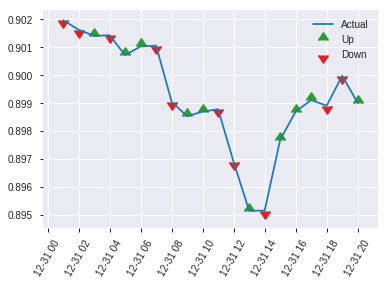


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.20692809664751405
RMSE: 0.45489350033553355
LogLoss: 0.6062469080675496
Null degrees of freedom: 616
Residual degrees of freedom: 538
Null deviance: 855.8232650727789
Residual deviance: 748.1086845553561
AIC: 906.1086845553561
AUC: 0.7512452711223203
pr_auc: 0.7405613826093413
Gini: 0.5024905422446406
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2966733323921302: 


,0,1,Error,Rate
0,149.0,156.0,0.5115,(156.0/305.0)
1,45.0,267.0,0.1442,(45.0/312.0)
Total,194.0,423.0,0.3258,(201.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2966733,0.7265306,275.0
max f2,0.1062280,0.8486366,355.0
max f0point5,0.5546000,0.7077815,149.0
max accuracy,0.4886092,0.6888169,181.0
max precision,0.8156150,0.9444444,31.0
max recall,0.0101563,1.0,398.0
max specificity,0.9452770,0.9967213,0.0
max absolute_mcc,0.5546000,0.3891654,149.0
max min_per_class_accuracy,0.4459783,0.6786885,202.0
max mean_per_class_accuracy,0.4886092,0.6894756,181.0


Gains/Lift Table: Avg response rate: 50.57 %, avg score: 44.23 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.9105501,1.4125458,1.4125458,0.7142857,0.9260654,0.7142857,0.9260654,0.0160256,0.0160256,41.2545788,41.2545788
,2,0.0210697,0.8748116,1.9775641,1.6733235,1.0,0.8872526,0.8461538,0.9081518,0.0192308,0.0352564,97.7564103,67.3323471
,3,0.0307942,0.8518752,1.9775641,1.7693995,1.0,0.8628569,0.8947368,0.8938482,0.0192308,0.0544872,97.7564103,76.9399460
,4,0.0405186,0.8338894,1.9775641,1.8193590,1.0,0.8422425,0.92,0.8814628,0.0192308,0.0737179,97.7564103,81.9358974
,5,0.0502431,0.8181647,1.9775641,1.8499793,1.0,0.8265296,0.9354839,0.8708306,0.0192308,0.0929487,97.7564103,84.9979322
,6,0.1004862,0.7663348,1.7223945,1.7861869,0.8709677,0.7976819,0.9032258,0.8342562,0.0865385,0.1794872,72.2394541,78.6186931
,7,0.1507293,0.7136625,1.4034326,1.6586022,0.7096774,0.7448323,0.8387097,0.8044483,0.0705128,0.25,40.3432589,65.8602151
,8,0.2009724,0.6747253,1.2758478,1.5629136,0.6451613,0.6964880,0.7903226,0.7774582,0.0641026,0.3141026,27.5847808,56.2913565
,9,0.2998379,0.6056653,1.3616015,1.4965350,0.6885246,0.6412023,0.7567568,0.7325306,0.1346154,0.4487179,36.1601513,49.6534997
,10,0.4003241,0.5200527,1.3077440,1.4491462,0.6612903,0.5641858,0.7327935,0.6902740,0.1314103,0.5801282,30.7744003,44.9146164


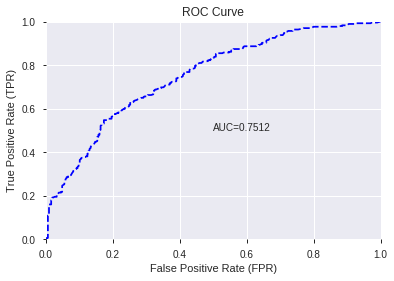

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


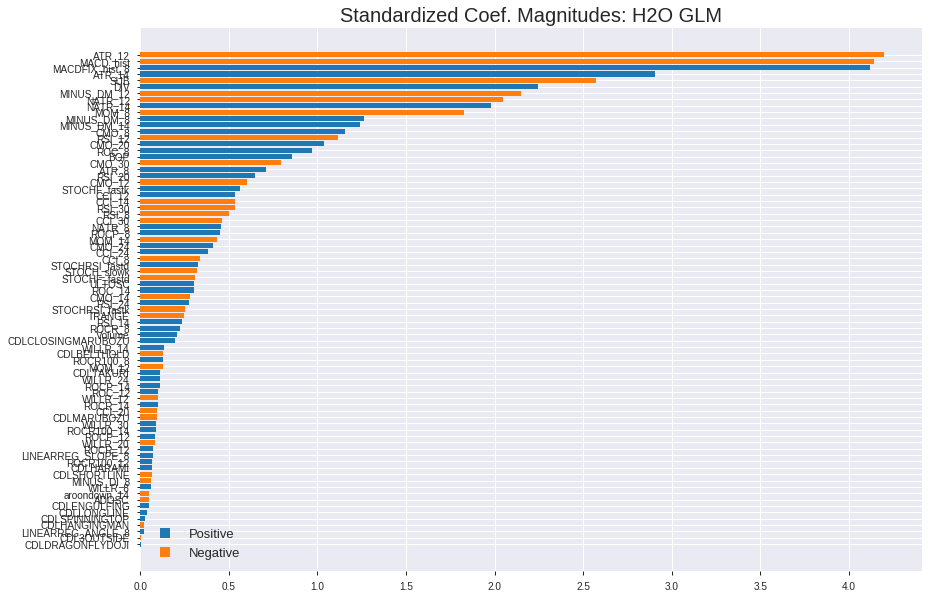

'log_likelihood'
--2019-08-24 19:35:01--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 54.231.41.83
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|54.231.41.83|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


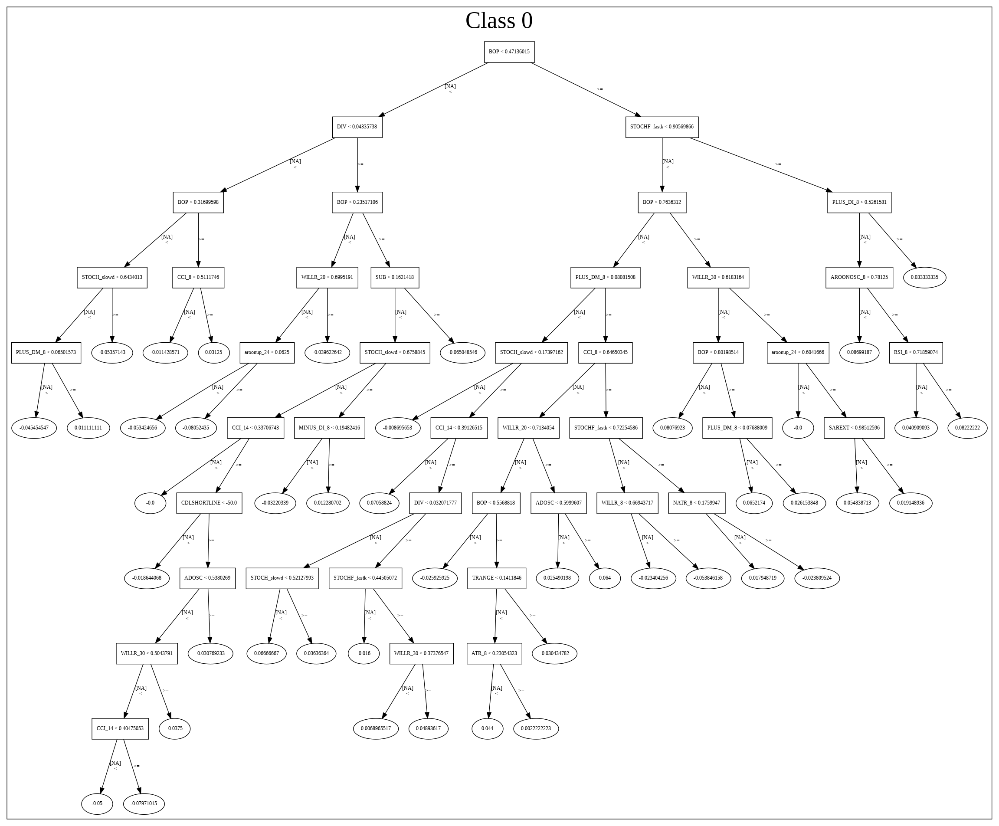

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190824_193449_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190824_193449_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_82_sid_ad7c',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_82_s

['ATR_12',
 'MACD_hist',
 'MACDFIX_hist_8',
 'ATR_14',
 'SUB',
 'DIV',
 'MINUS_DM_12',
 'NATR_12',
 'NATR_14',
 'MOM_8',
 'MINUS_DM_8',
 'MINUS_DM_14',
 'CMO_8',
 'RSI_12',
 'CMO_20',
 'ROC_8',
 'BOP',
 'CMO_30',
 'ATR_8',
 'RSI_20',
 'CMO_12',
 'STOCHF_fastk',
 'CCI_12',
 'CCI_14',
 'RSI_30',
 'RSI_8',
 'CCI_30',
 'NATR_8',
 'ROCP_8',
 'MOM_14',
 'CMO_24',
 'CCI_24',
 'CCI_8',
 'STOCHRSI_fastd',
 'STOCH_slowk',
 'STOCHF_fastd',
 'ULTOSC',
 'ROC_14',
 'CMO_14',
 'RSI_24',
 'STOCHRSI_fastk',
 'TRANGE',
 'RSI_14',
 'ROCR_8',
 'Volume',
 'CDLCLOSINGMARUBOZU',
 'WILLR_14',
 'CDLBELTHOLD',
 'ROCR100_8',
 'MOM_12',
 'CDLTAKURI',
 'WILLR_24',
 'ROCP_14',
 'ROC_12',
 'WILLR_12',
 'ROCR_14',
 'CCI_20',
 'CDLMARUBOZU',
 'WILLR_30',
 'ROCR100_14',
 'ROCP_12',
 'WILLR_20',
 'ROCR_12',
 'LINEARREG_SLOPE_8',
 'ROCR100_12',
 'CDLHARAMI',
 'CDLSHORTLINE',
 'MINUS_DI_8',
 'WILLR_8',
 'aroondown_14',
 'ADOSC',
 'CDLENGULFING',
 'CDLLONGLINE',
 'CDLSPINNINGTOP',
 'CDLHANGINGMAN',
 'LINEARREG_ANGLE_8',
 '

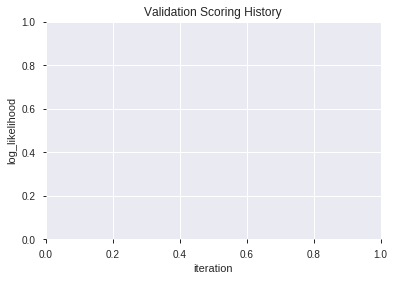

In [49]:
# GLM with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_2_AutoML_20190824_193559,0.757498,0.597954,0.334815,0.452229,0.204511
1,XGBoost_grid_1_AutoML_20190824_193559_model_7,0.755091,0.600911,0.302785,0.453010,0.205218
2,XGBoost_1_AutoML_20190824_193559,0.753442,0.598899,0.351540,0.453130,0.205327
3,XGBoost_grid_1_AutoML_20190824_193559_model_6,0.752906,0.600001,0.333176,0.453602,0.205755
4,XGBoost_3_AutoML_20190824_193559,0.752653,0.599612,0.328111,0.453345,0.205522
5,XGBoost_grid_1_AutoML_20190824_193559_model_4,0.752622,0.600133,0.333029,0.453407,0.205578
6,XGBoost_grid_1_AutoML_20190824_193559_model_2,0.750268,0.602109,0.339512,0.454789,0.206833
7,XGBoost_grid_1_AutoML_20190824_193559_model_1,0.749695,0.603460,0.346658,0.454505,0.206574
8,XGBoost_grid_1_AutoML_20190824_193559_model_3,0.749454,0.601642,0.336381,0.454445,0.206521
9,XGBoost_grid_1_AutoML_20190824_193559_model_5,0.737432,0.628473,0.356494,0.465112,0.216329


,variable,relative_importance,scaled_importance,percentage
0,BOP,4084.848145,1.000000,0.194727
1,STOCHF_fastk,1218.230713,0.298232,0.058074
2,STOCHRSI_fastk,980.768982,0.240099,0.046754
3,DIV,952.686096,0.233224,0.045415
4,CCI_8,725.649231,0.177644,0.034592
5,TRANGE,700.171936,0.171407,0.033378
6,Volume,683.007812,0.167205,0.032559
7,WILLR_8,458.993500,0.112365,0.021880
8,ADOSC,448.210480,0.109725,0.021366
9,SUB,417.733307,0.102264,0.019914


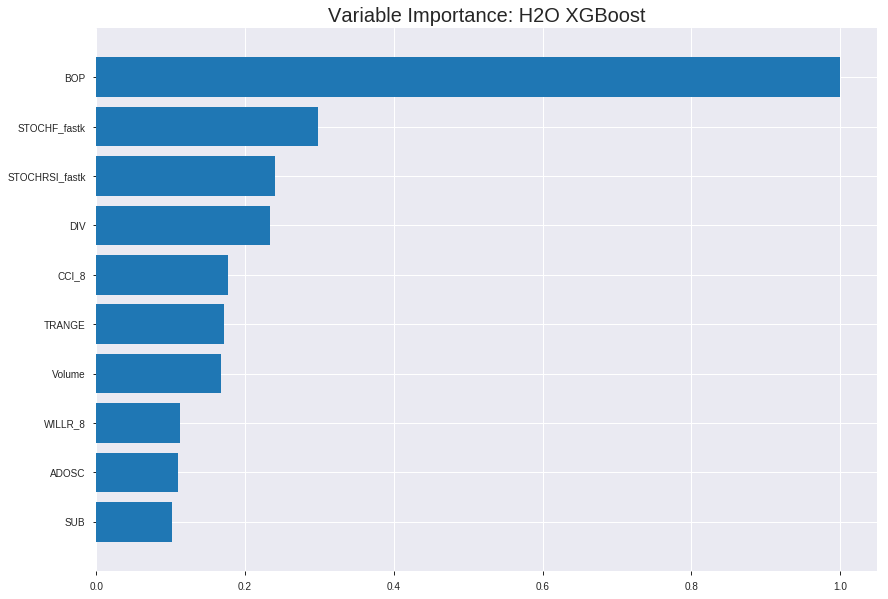

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_2_AutoML_20190824_193559


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.12729605050297504
RMSE: 0.3567857207105899
LogLoss: 0.41498653127025625
Mean Per-Class Error: 0.15636567420309744
AUC: 0.923640010296452
pr_auc: 0.9232289399717752
Gini: 0.8472800205929041
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.47191497931877774: 


,0,1,Error,Rate
0,1795.0,405.0,0.1841,(405.0/2200.0)
1,276.0,1843.0,0.1303,(276.0/2119.0)
Total,2071.0,2248.0,0.1577,(681.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4719150,0.8440577,204.0
max f2,0.3245747,0.8953722,269.0
max f0point5,0.6288177,0.8600024,139.0
max accuracy,0.4944738,0.8434823,195.0
max precision,0.9515686,1.0,0.0
max recall,0.1012835,1.0,376.0
max specificity,0.9515686,1.0,0.0
max absolute_mcc,0.4791375,0.6874176,201.0
max min_per_class_accuracy,0.4999522,0.8414346,193.0
max mean_per_class_accuracy,0.4791375,0.8436343,201.0


Gains/Lift Table: Avg response rate: 49.06 %, avg score: 49.08 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.9191491,2.0382256,2.0382256,1.0,0.9317192,1.0,0.9317192,0.0207645,0.0207645,103.8225578,103.8225578
,2,0.0201436,0.9028603,2.0382256,2.0382256,1.0,0.9108891,1.0,0.9214239,0.0202926,0.0410571,103.8225578,103.8225578
,3,0.0300996,0.8912382,2.0382256,2.0382256,1.0,0.8972654,1.0,0.9134330,0.0202926,0.0613497,103.8225578,103.8225578
,4,0.0400556,0.8817311,2.0382256,2.0382256,1.0,0.8863465,1.0,0.9067005,0.0202926,0.0816423,103.8225578,103.8225578
,5,0.0500116,0.8749330,2.0382256,2.0382256,1.0,0.8784209,1.0,0.9010708,0.0202926,0.1019349,103.8225578,103.8225578
,6,0.1000232,0.8318475,2.0193531,2.0287893,0.9907407,0.8524743,0.9953704,0.8767726,0.1009910,0.2029259,101.9353119,102.8789349
,7,0.1500347,0.7963397,1.9344271,1.9973353,0.9490741,0.8149107,0.9799383,0.8561519,0.0967437,0.2996697,93.4427053,99.7335250
,8,0.2000463,0.7595986,1.9816082,1.9934035,0.9722222,0.7790282,0.9780093,0.8368710,0.0991034,0.3987730,98.1608201,99.3403488
,9,0.3000695,0.6815255,1.8495010,1.9454360,0.9074074,0.7203948,0.9544753,0.7980456,0.1849929,0.5837659,84.9500988,94.5435988
,10,0.4000926,0.5867573,1.4201525,1.8141151,0.6967593,0.6347482,0.8900463,0.7572212,0.1420481,0.7258141,42.0152544,81.4115127




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.19280963793967454
RMSE: 0.43910094276791817
LogLoss: 0.5672000060510275
Mean Per-Class Error: 0.28863558103529396
AUC: 0.7764915241317131
pr_auc: 0.7675795108824218
Gini: 0.5529830482634261
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.38221322000026703: 


,0,1,Error,Rate
0,367.0,266.0,0.4202,(266.0/633.0)
1,115.0,486.0,0.1913,(115.0/601.0)
Total,482.0,752.0,0.3088,(381.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3822132,0.7184035,248.0
max f2,0.1358304,0.8373545,357.0
max f0point5,0.5185221,0.7122040,184.0
max accuracy,0.5185221,0.7123177,184.0
max precision,0.9416730,1.0,0.0
max recall,0.0651274,1.0,391.0
max specificity,0.9416730,1.0,0.0
max absolute_mcc,0.5185221,0.4250514,184.0
max min_per_class_accuracy,0.4708019,0.7045814,207.0
max mean_per_class_accuracy,0.4551632,0.7113644,214.0


Gains/Lift Table: Avg response rate: 48.70 %, avg score: 46.82 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.9090637,2.0532446,2.0532446,1.0,0.9254151,1.0,0.9254151,0.0216306,0.0216306,105.3244592,105.3244592
,2,0.0202593,0.8921885,2.0532446,2.0532446,1.0,0.9032316,1.0,0.9147670,0.0199667,0.0415973,105.3244592,105.3244592
,3,0.0299838,0.8723390,1.8821409,1.9977515,0.9166667,0.8836713,0.9729730,0.9046819,0.0183028,0.0599002,88.2140876,99.7751495
,4,0.0405186,0.8539228,1.5794189,1.8889850,0.7692308,0.8647416,0.92,0.8942974,0.0166389,0.0765391,57.9418917,88.8985025
,5,0.0502431,0.8425626,1.8821409,1.8876604,0.9166667,0.8473608,0.9193548,0.8852129,0.0183028,0.0948419,88.2140876,88.7660351
,6,0.1004862,0.8001129,1.8214267,1.8545435,0.8870968,0.8184620,0.9032258,0.8518375,0.0915141,0.1863561,82.1426655,85.4543503
,7,0.1499190,0.7548273,1.5820081,1.7646805,0.7704918,0.7758820,0.8594595,0.8267927,0.0782030,0.2645591,58.2008129,76.4680487
,8,0.2001621,0.7146838,1.5896087,1.7207353,0.7741935,0.7318869,0.8380567,0.8029702,0.0798669,0.3444260,58.9608717,72.0735347
,9,0.2998379,0.6293224,1.3521367,1.5982012,0.6585366,0.6710022,0.7783784,0.7590998,0.1347754,0.4792013,35.2136683,59.8201196
,10,0.4003241,0.5502149,1.2087650,1.5004480,0.5887097,0.5883264,0.7307692,0.7162336,0.1214642,0.6006656,20.8764962,50.0447971



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 19:36:02,0.004 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5093772,0.5,0.6931472,0.5,0.0,1.0,0.5129660
,2019-08-24 19:36:02,0.197 sec,5.0,0.4736502,0.6415211,0.8297428,0.8217326,2.0382256,0.2500579,0.4803951,0.6544527,0.7524597,0.7284818,1.9065843,0.3468395
,2019-08-24 19:36:03,0.370 sec,10.0,0.4526254,0.6012151,0.8490436,0.8432386,2.0382256,0.2401019,0.4661842,0.6265100,0.7651426,0.7456034,2.0532446,0.3379254
,2019-08-24 19:36:03,0.541 sec,15.0,0.4363057,0.5698279,0.8572488,0.8524748,2.0382256,0.2396388,0.4573531,0.6085504,0.7646774,0.7531403,2.0532446,0.3241491
,2019-08-24 19:36:03,0.738 sec,20.0,0.4237650,0.5454883,0.8653353,0.8611912,2.0382256,0.2303774,0.4512602,0.5958040,0.7688331,0.7604343,2.0532446,0.3427877
,2019-08-24 19:36:03,0.913 sec,25.0,0.4139471,0.5261249,0.8713705,0.8690889,2.0382256,0.2285251,0.4470355,0.5865373,0.7712804,0.7600858,2.0532446,0.3379254
,2019-08-24 19:36:03,1.119 sec,30.0,0.4058285,0.5099113,0.8769398,0.8748852,2.0382256,0.2227367,0.4443209,0.5802999,0.7727537,0.7619754,2.0532446,0.3322528
,2019-08-24 19:36:04,1.399 sec,35.0,0.3985628,0.4955093,0.8831563,0.8805654,2.0382256,0.2185691,0.4426119,0.5760253,0.7732452,0.7647059,2.0532446,0.3200972
,2019-08-24 19:36:04,1.611 sec,40.0,0.3923195,0.4828659,0.8880491,0.8866344,2.0382256,0.2095392,0.4414150,0.5730417,0.7735436,0.7632358,2.0532446,0.3087520
,2019-08-24 19:36:04,1.825 sec,45.0,0.3859645,0.4701944,0.8935419,0.8909422,2.0382256,0.2021301,0.4407163,0.5709852,0.7738143,0.7646771,2.0532446,0.3144246


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,4084.8481445,1.0,0.1947267
STOCHF_fastk,1218.2307129,0.2982316,0.0580736
STOCHRSI_fastk,980.7689819,0.2400993,0.0467537
DIV,952.6860962,0.2332244,0.0454150
CCI_8,725.6492310,0.1776441,0.0345920
---,---,---,---
CDLBELTHOLD,14.1063194,0.0034533,0.0006725
ROCR100_12,13.6507168,0.0033418,0.0006507
CDLTAKURI,10.5937519,0.0025934,0.0005050
RSI_20,6.5698242,0.0016083,0.0003132



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6888168557536467)

('F1', 0.7306176084099869)

('auc', 0.7574978982765869)

('logloss', 0.5979538218840749)

('mean_per_class_error', 0.31092896174863394)

('rmse', 0.45222875015207914)

('mse', 0.20451084246411164)

xgboost prediction progress: |████████████████████████████████████████████| 100%


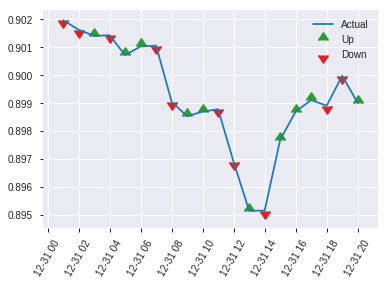


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.20451084246411164
RMSE: 0.45222875015207914
LogLoss: 0.5979538218840749
Mean Per-Class Error: 0.31092896174863394
AUC: 0.7574978982765869
pr_auc: 0.7348330878026608
Gini: 0.5149957965531737
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.26456119120121: 


,0,1,Error,Rate
0,134.0,171.0,0.5607,(171.0/305.0)
1,34.0,278.0,0.109,(34.0/312.0)
Total,168.0,449.0,0.3323,(205.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2645612,0.7306176,294.0
max f2,0.0916069,0.8465753,374.0
max f0point5,0.5469695,0.7061688,153.0
max accuracy,0.4658934,0.6888169,193.0
max precision,0.8043889,0.8666667,35.0
max recall,0.0608387,1.0,394.0
max specificity,0.9280075,0.9967213,0.0
max absolute_mcc,0.5469695,0.3867933,153.0
max min_per_class_accuracy,0.4449020,0.6858974,202.0
max mean_per_class_accuracy,0.4658934,0.6890710,193.0


Gains/Lift Table: Avg response rate: 50.57 %, avg score: 44.73 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.9081277,1.4125458,1.4125458,0.7142857,0.9172120,0.7142857,0.9172120,0.0160256,0.0160256,41.2545788,41.2545788
,2,0.0210697,0.8887523,1.6479701,1.5212032,0.8333333,0.8976479,0.7692308,0.9081824,0.0160256,0.0320513,64.7970085,52.1203156
,3,0.0307942,0.8702562,1.6479701,1.5612348,0.8333333,0.8782362,0.7894737,0.8987257,0.0160256,0.0480769,64.7970085,56.1234818
,4,0.0405186,0.8456709,1.6479701,1.5820513,0.8333333,0.8583895,0.8,0.8890450,0.0160256,0.0641026,64.7970085,58.2051282
,5,0.0502431,0.8313182,1.9775641,1.6586022,1.0,0.8384702,0.8387097,0.8792563,0.0192308,0.0833333,97.7564103,65.8602151
,6,0.1004862,0.7788856,1.5948098,1.6267060,0.8064516,0.8044943,0.8225806,0.8418753,0.0801282,0.1634615,59.4809760,62.6705955
,7,0.1507293,0.7341151,1.6586022,1.6373380,0.8387097,0.7541535,0.8279570,0.8126347,0.0833333,0.2467949,65.8602151,63.7338020
,8,0.2009724,0.6773249,1.5310174,1.6107579,0.7741935,0.7073768,0.8145161,0.7863203,0.0769231,0.3237179,53.1017370,61.0757858
,9,0.2998379,0.6100436,1.4588588,1.5606722,0.7377049,0.6429494,0.7891892,0.7390466,0.1442308,0.4679487,45.8858764,56.0672211
,10,0.4003241,0.5299364,1.1163668,1.4491462,0.5645161,0.5706524,0.7327935,0.6967776,0.1121795,0.5801282,11.6366832,44.9146164


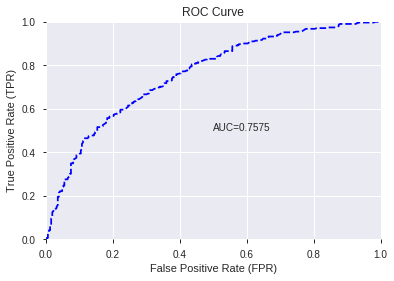

This function is available for GLM models only


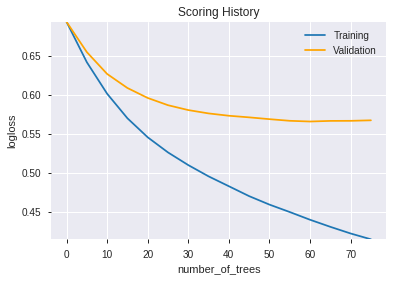

--2019-08-24 19:36:38--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.133.139
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.133.139|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip


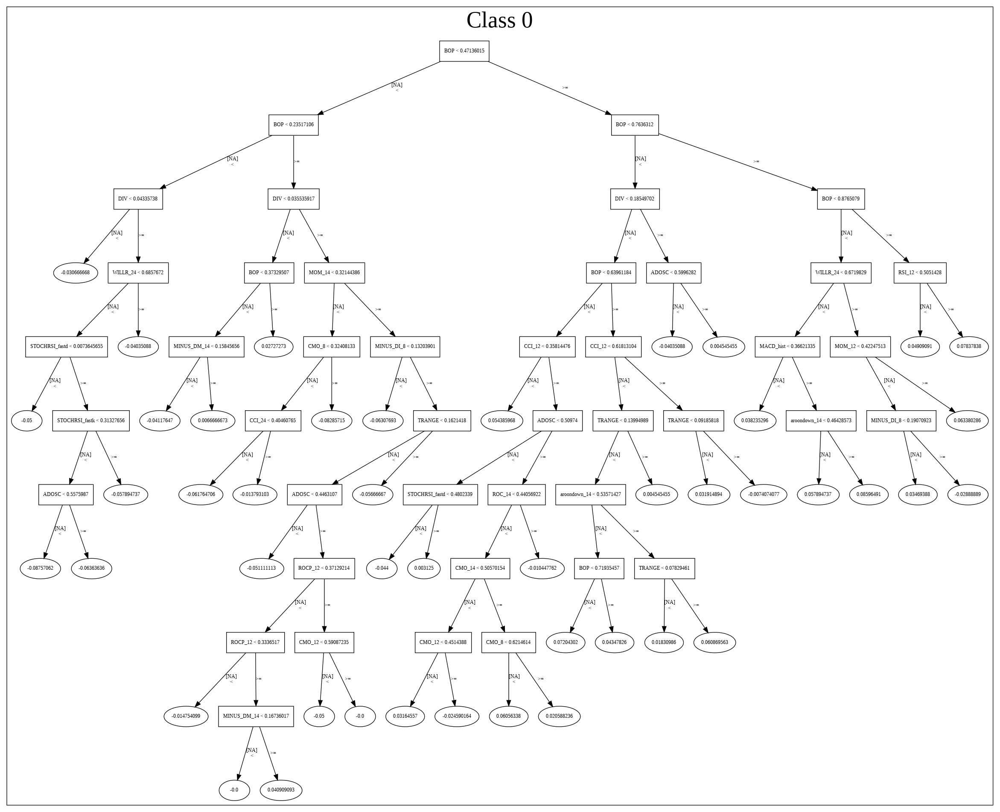

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_2_AutoML_20190824_193559',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_2_AutoML_20190824_193559',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_90_sid_ad7c',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_90_sid_ad7c',
   'type

['BOP',
 'STOCHF_fastk',
 'STOCHRSI_fastk',
 'DIV',
 'CCI_8',
 'TRANGE',
 'Volume',
 'WILLR_8',
 'ADOSC',
 'SUB',
 'CCI_12',
 'STOCH_slowk',
 'ULTOSC',
 'STOCHRSI_fastd',
 'CCI_20',
 'LINEARREG_ANGLE_8',
 'MINUS_DM_14',
 'MOM_12',
 'CCI_30',
 'WILLR_12',
 'CCI_24',
 'MINUS_DI_8',
 'ROC_8',
 'WILLR_14',
 'MINUS_DM_8',
 'CCI_14',
 'MOM_8',
 'MACD_hist',
 'ATR_8',
 'WILLR_30',
 'NATR_8',
 'MACDFIX_hist_8',
 'MOM_14',
 'CDLCLOSINGMARUBOZU',
 'MINUS_DM_12',
 'CMO_30',
 'WILLR_24',
 'WILLR_20',
 'NATR_14',
 'aroondown_14',
 'NATR_12',
 'STOCHF_fastd',
 'ATR_14',
 'ROC_12',
 'ATR_12',
 'CMO_20',
 'ROC_14',
 'CMO_8',
 'CDLLONGLINE',
 'CMO_14',
 'RSI_24',
 'CMO_12',
 'LINEARREG_SLOPE_8',
 'CDLSHORTLINE',
 'RSI_12',
 'ROCP_14',
 'ROCP_12',
 'ROCP_8',
 'RSI_14',
 'RSI_30',
 'RSI_8',
 'CMO_24',
 'ROCR100_14',
 'ROCR_8',
 'CDLSPINNINGTOP',
 'ROCR_14',
 'ROCR100_8',
 'CDLDRAGONFLYDOJI',
 'CDLBELTHOLD',
 'ROCR100_12',
 'CDLTAKURI',
 'RSI_20',
 'ROCR_12']

In [50]:
# XGBoost with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="XGBoost",features_list=features_list)

In [51]:
# recursive feature elimination with cross validation
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'RFE' in features_to_include:
  from sklearn.feature_selection import RFECV
  from sklearn.svm import LinearSVC
  from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
  from sklearn.linear_model import LogisticRegression, LinearRegression

  bestfeatures = RFECV(ExtraTreeClassifier(random_state=1,criterion='entropy'), min_features_to_select=select_rfe, step=1,cv=5).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, RFECV, LinearSVC, DecisionTreeClassifier,ExtraTreeClassifier, LogisticRegression, LinearRegression
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list = []

51

['BBANDS_lowerband_8_8_4',
 'BBANDS_middleband_20_2_2',
 'BBANDS_lowerband_20_3_4',
 'BBANDS_lowerband_24_7_5',
 'BOP',
 'aroondown_8',
 'aroonup_8',
 'CCI_8',
 'CMO_8',
 'MOM_8',
 'ROC_8',
 'ROCR100_8',
 'WILLR_8',
 'ADXR_12',
 'aroonup_12',
 'CMO_12',
 'DX_12',
 'MACDFIX_hist_12',
 'MFI_12',
 'MINUS_DM_12',
 'PLUS_DM_12',
 'WILLR_12',
 'AROONOSC_14',
 'CCI_14',
 'ADX_20',
 'CCI_20',
 'MINUS_DM_20',
 'ROCP_20',
 'aroondown_24',
 'aroonup_24',
 'CCI_24',
 'MFI_24',
 'PLUS_DI_24',
 'WILLR_24',
 'MINUS_DI_30',
 'ROC_30',
 'STOCH_slowk',
 'STOCH_slowd',
 'STOCHF_fastk',
 'STOCHRSI_fastk',
 'ULTOSC',
 'ADOSC',
 'ATR_8',
 'ATR_12',
 'NATR_12',
 'TRANGE',
 'CDLSHORTLINE',
 'BETA_12',
 'STDDEV_14',
 'LINEARREG_ANGLE_24',
 'DIV']

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190824_194222_model_6,0.747220,0.598769,0.360104,0.453979,0.206097
1,DeepLearning_grid_1_AutoML_20190824_194222_model_5,0.745308,0.606741,0.343269,0.456010,0.207945
2,DeepLearning_grid_1_AutoML_20190824_194222_model_9,0.743537,0.607486,0.328368,0.457276,0.209101
3,DeepLearning_grid_1_AutoML_20190824_194222_model_2,0.742907,0.691985,0.349716,0.475074,0.225696
4,DeepLearning_grid_1_AutoML_20190824_194222_model_3,0.737222,0.669530,0.349863,0.471451,0.222266
5,DeepLearning_1_AutoML_20190824_194222,0.736029,0.609958,0.357913,0.458748,0.210450
6,DeepLearning_grid_1_AutoML_20190824_194222_model_4,0.733071,0.699135,0.361633,0.482367,0.232678
7,DeepLearning_grid_1_AutoML_20190824_194222_model_8,0.730817,0.611418,0.348114,0.459111,0.210783
8,DeepLearning_grid_1_AutoML_20190824_194222_model_7,0.730575,0.739402,0.332587,0.488095,0.238237
9,DeepLearning_grid_1_AutoML_20190824_194222_model_1,0.699853,0.824472,0.337285,0.502445,0.252451


,variable,relative_importance,scaled_importance,percentage
0,BOP,1.000000,1.000000,0.056610
1,TRANGE,0.500611,0.500611,0.028340
2,DIV,0.491906,0.491906,0.027847
3,CDLSHORTLINE,0.470551,0.470551,0.026638
4,STOCHF_fastk,0.448211,0.448211,0.025373
5,ULTOSC,0.418269,0.418269,0.023678
6,aroonup_12,0.377044,0.377044,0.021344
7,WILLR_8,0.374906,0.374906,0.021223
8,aroondown_8,0.367819,0.367819,0.020822
9,CCI_8,0.366532,0.366532,0.020749


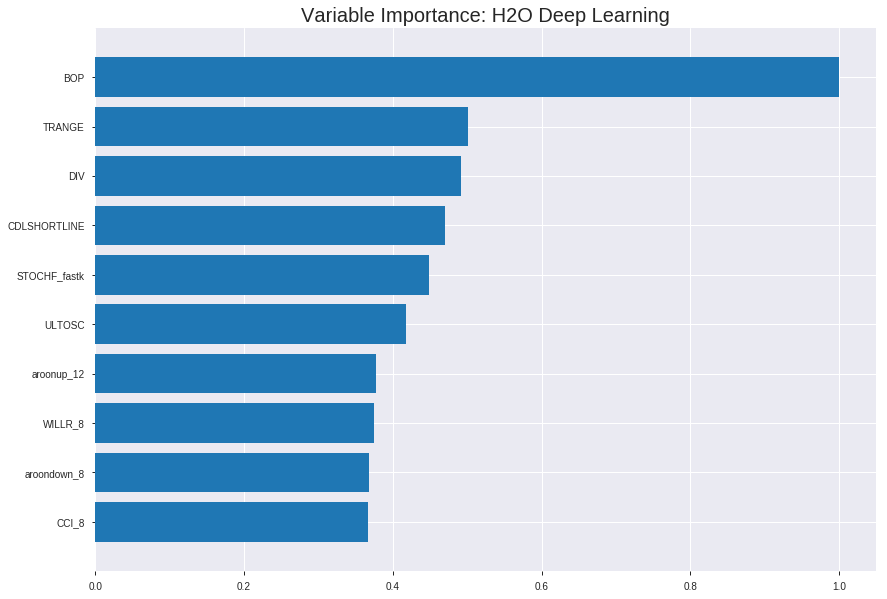

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190824_194222_model_6


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.19637274792674245
RMSE: 0.4431396483353103
LogLoss: 0.5773147174250036
Mean Per-Class Error: 0.28424825174825175
AUC: 0.7765584109142392
pr_auc: 0.7509246888449328
Gini: 0.5531168218284783
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4382108428348372: 


,0,1,Error,Rate
0,1176.0,1024.0,0.4655,(1024.0/2200.0)
1,298.0,1821.0,0.1406,(298.0/2119.0)
Total,1474.0,2845.0,0.3061,(1322.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4382108,0.7336825,242.0
max f2,0.2493309,0.8424834,334.0
max f0point5,0.5625284,0.7088608,178.0
max accuracy,0.5003103,0.7147488,208.0
max precision,0.9563126,1.0,0.0
max recall,0.0867100,1.0,388.0
max specificity,0.9563126,1.0,0.0
max absolute_mcc,0.5003103,0.4335517,208.0
max min_per_class_accuracy,0.5304734,0.71,193.0
max mean_per_class_accuracy,0.5003103,0.7157517,208.0


Gains/Lift Table: Avg response rate: 49.06 %, avg score: 54.10 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.9100486,1.9919023,1.9919023,0.9772727,0.9257209,0.9772727,0.9257209,0.0202926,0.0202926,99.1902270,99.1902270
,2,0.0201436,0.8955475,1.7064214,1.8508025,0.8372093,0.9025405,0.9080460,0.9142639,0.0169891,0.0372817,70.6421414,85.0802536
,3,0.0300996,0.8880675,1.7064214,1.8030457,0.8372093,0.8917502,0.8846154,0.9068171,0.0169891,0.0542709,70.6421414,80.3045704
,4,0.0400556,0.8784623,1.8960238,1.8261559,0.9302326,0.8841625,0.8959538,0.9011862,0.0188768,0.0731477,89.6023794,82.6155865
,5,0.0500116,0.8694001,1.7538220,1.8117561,0.8604651,0.8736541,0.8888889,0.8957053,0.0174611,0.0906088,75.3822009,81.1756069
,6,0.1000232,0.8331992,1.6796489,1.7457025,0.8240741,0.8498565,0.8564815,0.8727809,0.0840019,0.1746107,67.9648856,74.5702463
,7,0.1500347,0.7968653,1.5003605,1.6639218,0.7361111,0.8151555,0.8163580,0.8535724,0.0750354,0.2496461,50.0360495,66.3921807
,8,0.2000463,0.7649687,1.4720518,1.6159543,0.7222222,0.7813472,0.7928241,0.8355161,0.0736196,0.3232657,47.2051806,61.5954307
,9,0.3000695,0.6825548,1.4154344,1.5491143,0.6944444,0.7244668,0.7600309,0.7984996,0.1415762,0.4648419,41.5434429,54.9114348
,10,0.4000926,0.5971143,1.3776895,1.5062581,0.6759259,0.6402598,0.7390046,0.7589397,0.1378008,0.6026428,37.7689511,50.6258138




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.19726004234300948
RMSE: 0.4441396653565289
LogLoss: 0.5806006908793985
Mean Per-Class Error: 0.28543396603344084
AUC: 0.7703787526318694
pr_auc: 0.7329289663127025
Gini: 0.5407575052637388
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4180518992473343: 


,0,1,Error,Rate
0,337.0,296.0,0.4676,(296.0/633.0)
1,88.0,513.0,0.1464,(88.0/601.0)
Total,425.0,809.0,0.3112,(384.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4180519,0.7276596,251.0
max f2,0.2446933,0.8364206,337.0
max f0point5,0.5628446,0.7140085,170.0
max accuracy,0.4933572,0.7139384,210.0
max precision,0.9323871,1.0,0.0
max recall,0.1057427,1.0,387.0
max specificity,0.9323871,1.0,0.0
max absolute_mcc,0.4933572,0.4292861,210.0
max min_per_class_accuracy,0.5078040,0.7071547,202.0
max mean_per_class_accuracy,0.4933572,0.7145660,210.0


Gains/Lift Table: Avg response rate: 48.70 %, avg score: 51.65 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8999006,1.5794189,1.5794189,0.7692308,0.9141497,0.7692308,0.9141497,0.0166389,0.0166389,57.9418917,57.9418917
,2,0.0202593,0.8835438,2.0532446,1.8068552,1.0,0.8906520,0.88,0.9028708,0.0199667,0.0366057,105.3244592,80.6855241
,3,0.0299838,0.8685373,1.5399334,1.7202860,0.75,0.8760866,0.8378378,0.8941840,0.0149750,0.0515807,53.9933444,72.0286010
,4,0.0405186,0.8593132,1.7373608,1.7247255,0.8461538,0.8632633,0.84,0.8861446,0.0183028,0.0698835,73.7360809,72.4725458
,5,0.0502431,0.8506932,1.7110372,1.7220761,0.8333333,0.8557354,0.8387097,0.8802590,0.0166389,0.0865225,71.1037160,72.2076110
,6,0.1004862,0.8068235,1.5233750,1.6227256,0.7419355,0.8289973,0.7903226,0.8546281,0.0765391,0.1630616,52.3375020,62.2725565
,7,0.1499190,0.7708916,1.6493276,1.6314971,0.8032787,0.7883592,0.7945946,0.8327773,0.0815308,0.2445923,64.9327623,63.1497054
,8,0.2001621,0.7364880,1.4902582,1.5960444,0.7258065,0.7539202,0.7773279,0.8129832,0.0748752,0.3194676,49.0258172,59.6044379
,9,0.2998379,0.6450300,1.5357602,1.5760040,0.7479675,0.6954257,0.7675676,0.7739033,0.1530782,0.4725458,53.5760183,57.6003957
,10,0.4003241,0.5626994,1.3909076,1.5295425,0.6774194,0.6019549,0.7449393,0.7307421,0.1397671,0.6123128,39.0907627,52.9542530



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 19:50:05,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-24 19:50:08,5 min 35.035 sec,694 obs/sec,0.4524195,1,1954.0,0.5160386,0.9408577,-0.0655581,0.7183836,0.6676443,1.7139624,0.3491549,0.5148712,0.9266960,-0.0610830,0.7149380,0.6739875,1.5794189,0.3800648
,2019-08-24 19:50:28,5 min 54.693 sec,1840 obs/sec,8.7374392,19,37737.0,0.4431396,0.5773147,0.2142326,0.7765584,0.7509247,1.9919023,0.3060894,0.4441397,0.5806007,0.2104289,0.7703788,0.7329290,1.5794189,0.3111831
,2019-08-24 19:50:48,6 min 14.720 sec,2168 obs/sec,19.3398935,42,83529.0,0.4428165,0.5795331,0.2153781,0.7778212,0.7536059,1.9919023,0.3153508,0.4491797,0.5954789,0.1924074,0.7603836,0.7272406,1.7373608,0.3371151
,2019-08-24 19:51:08,6 min 34.791 sec,2324 obs/sec,30.4887705,66,131681.0,0.4346221,0.5600322,0.2441486,0.7879218,0.7631981,1.8992557,0.2982172,0.4487333,0.5963595,0.1940116,0.7630082,0.7206079,1.2635351,0.2990276
,2019-08-24 19:51:27,6 min 54.316 sec,2445 obs/sec,42.0430655,91,181584.0,0.4276005,0.5437035,0.2683738,0.8001789,0.7783567,1.9919023,0.2833989,0.4481359,0.5959735,0.1961563,0.7625101,0.7125611,1.2635351,0.3063209
,2019-08-24 19:51:47,7 min 13.864 sec,2524 obs/sec,53.6369530,116,231658.0,0.4256100,0.5395966,0.2751695,0.8037218,0.7815222,1.9455790,0.2947442,0.4491878,0.5982652,0.1923782,0.7613877,0.7249620,1.5794189,0.3265802
,2019-08-24 19:52:07,7 min 34.045 sec,2595 obs/sec,66.0826580,143,285411.0,0.4211238,0.5293463,0.2903694,0.8123031,0.7957131,1.9455790,0.2859458,0.4495351,0.5940631,0.1911288,0.7569007,0.7218604,1.8953027,0.3200972
,2019-08-24 19:52:09,7 min 36.012 sec,2595 obs/sec,66.0826580,143,285411.0,0.4431396,0.5773147,0.2142326,0.7765584,0.7509247,1.9919023,0.3060894,0.4441397,0.5806007,0.2104289,0.7703788,0.7329290,1.5794189,0.3111831


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,1.0,1.0,0.0566101
TRANGE,0.5006107,0.5006107,0.0283396
DIV,0.4919058,0.4919058,0.0278468
CDLSHORTLINE,0.4705514,0.4705514,0.0266379
STOCHF_fastk,0.4482109,0.4482109,0.0253732
---,---,---,---
ROC_30,0.2926574,0.2926574,0.0165674
MINUS_DM_20,0.2897042,0.2897042,0.0164002
ROCR100_8,0.2873147,0.2873147,0.0162649
ROCP_20,0.2858002,0.2858002,0.0161792



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6904376012965965)

('F1', 0.7297297297297297)

('auc', 0.7472204707860446)

('logloss', 0.5987693198696932)

('mean_per_class_error', 0.31061370323665405)

('rmse', 0.45397929710950574)

('mse', 0.2060972022040409)

deeplearning prediction progress: |███████████████████████████████████████| 100%


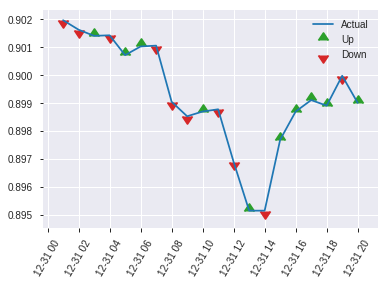


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.2060972022040409
RMSE: 0.45397929710950574
LogLoss: 0.5987693198696932
Mean Per-Class Error: 0.31061370323665405
AUC: 0.7472204707860446
pr_auc: 0.7199128199835771
Gini: 0.4944409415720892
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.24206636077222698: 


,0,1,Error,Rate
0,100.0,205.0,0.6721,(205.0/305.0)
1,15.0,297.0,0.0481,(15.0/312.0)
Total,115.0,502.0,0.3566,(220.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2420664,0.7297297,321.0
max f2,0.2131456,0.8531073,334.0
max f0point5,0.4752553,0.6898907,193.0
max accuracy,0.4016690,0.6904376,237.0
max precision,0.9051978,1.0,0.0
max recall,0.0656929,1.0,395.0
max specificity,0.9051978,1.0,0.0
max absolute_mcc,0.3945939,0.3880677,242.0
max min_per_class_accuracy,0.4520975,0.6794872,207.0
max mean_per_class_accuracy,0.4016690,0.6893863,237.0


Gains/Lift Table: Avg response rate: 50.57 %, avg score: 46.30 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8719261,1.6950549,1.6950549,0.8571429,0.8893555,0.8571429,0.8893555,0.0192308,0.0192308,69.5054945,69.5054945
,2,0.0210697,0.8595179,1.6479701,1.6733235,0.8333333,0.8652319,0.8461538,0.8782216,0.0160256,0.0352564,64.7970085,67.3323471
,3,0.0307942,0.8444590,1.6479701,1.6653171,0.8333333,0.8513270,0.8421053,0.8697285,0.0160256,0.0512821,64.7970085,66.5317139
,4,0.0405186,0.8371457,1.6479701,1.6611538,0.8333333,0.8416853,0.84,0.8629982,0.0160256,0.0673077,64.7970085,66.1153846
,5,0.0502431,0.8305948,1.3183761,1.5948098,0.6666667,0.8358128,0.8064516,0.8577365,0.0128205,0.0801282,31.8376068,59.4809760
,6,0.1004862,0.7580556,1.5948098,1.5948098,0.8064516,0.7907603,0.8064516,0.8242484,0.0801282,0.1602564,59.4809760,59.4809760
,7,0.1507293,0.7140987,1.5310174,1.5735456,0.7741935,0.7396456,0.7956989,0.7960475,0.0769231,0.2371795,53.1017370,57.3545630
,8,0.2009724,0.6811116,1.4672250,1.5469655,0.7419355,0.6978126,0.7822581,0.7714887,0.0737179,0.3108974,46.7224979,54.6965467
,9,0.2998379,0.5957750,1.4912778,1.5286036,0.7540984,0.6342144,0.7729730,0.7262253,0.1474359,0.4583333,49.1277848,52.8603604
,10,0.4003241,0.5165457,0.8930935,1.3690828,0.4516129,0.5562582,0.6923077,0.6835615,0.0897436,0.5480769,-10.6906534,36.9082840


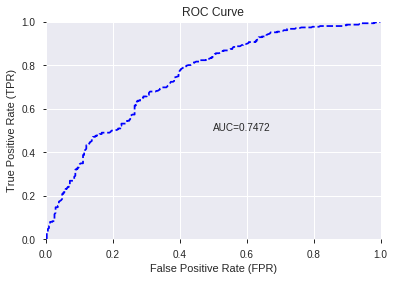

This function is available for GLM models only


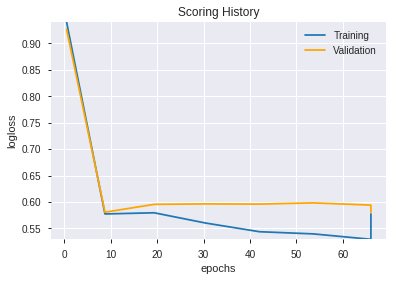

--2019-08-24 20:06:20--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.229.59
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.229.59|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


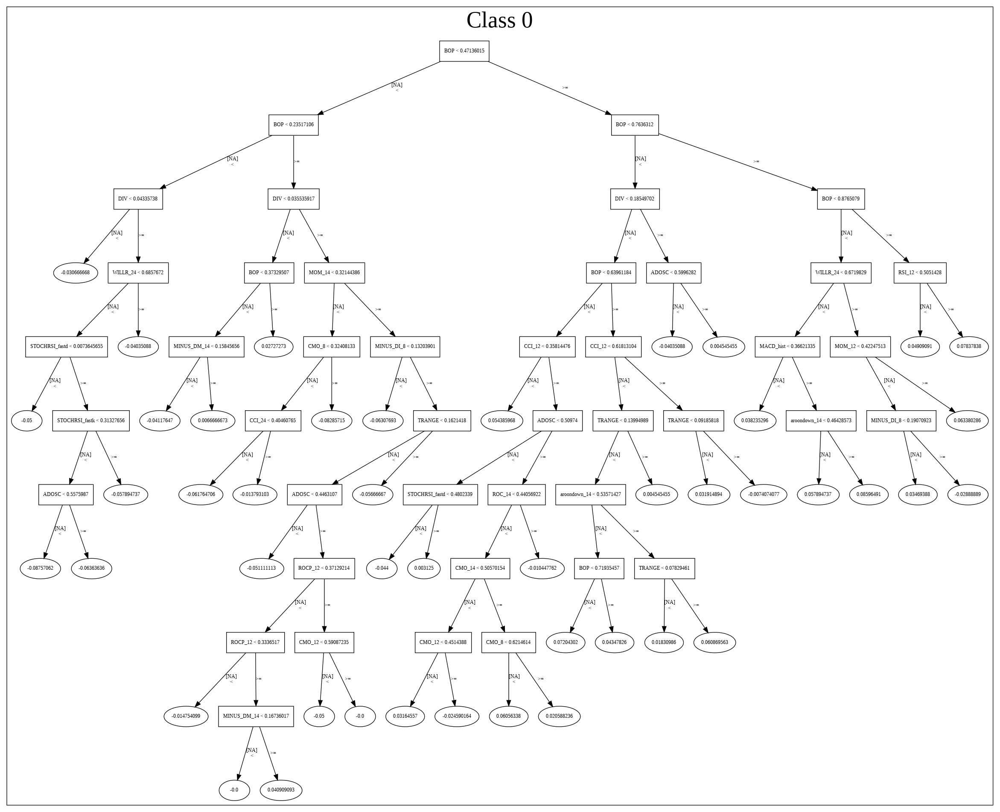

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190824_194222_model_6',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190824_194222_model_6',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_98_sid_ad7c',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['BOP',
 'TRANGE',
 'DIV',
 'CDLSHORTLINE',
 'STOCHF_fastk',
 'ULTOSC',
 'aroonup_12',
 'WILLR_8',
 'aroondown_8',
 'CCI_8',
 'WILLR_12',
 'aroonup_24',
 'STOCH_slowd',
 'STOCHRSI_fastk',
 'ADOSC',
 'MACDFIX_hist_12',
 'WILLR_24',
 'BBANDS_lowerband_8_8_4',
 'CMO_8',
 'STOCH_slowk',
 'LINEARREG_ANGLE_24',
 'MFI_24',
 'ATR_12',
 'aroonup_8',
 'CMO_12',
 'BBANDS_middleband_20_2_2',
 'DX_12',
 'PLUS_DM_12',
 'ADXR_12',
 'CCI_14',
 'MOM_8',
 'NATR_12',
 'BBANDS_lowerband_20_3_4',
 'STDDEV_14',
 'aroondown_24',
 'MINUS_DM_12',
 'MINUS_DI_30',
 'ADX_20',
 'ATR_8',
 'MFI_12',
 'CCI_20',
 'PLUS_DI_24',
 'CCI_24',
 'AROONOSC_14',
 'BETA_12',
 'BBANDS_lowerband_24_7_5',
 'ROC_30',
 'MINUS_DM_20',
 'ROCR100_8',
 'ROCP_20',
 'ROC_8']

In [52]:
# DeepLearning with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190824_200718_model_1,0.749643,0.604179,0.36167,0.455275,0.207276


,variable,relative_importance,scaled_importance,percentage
0,BOP,0.712232,1.000000,0.165651
1,STOCHF_fastk,0.285360,0.400655,0.066369
2,TRANGE,0.225031,0.315952,0.052338
3,CCI_8,0.222190,0.311962,0.051677
4,DIV,0.206743,0.290275,0.048084
5,ULTOSC,0.201790,0.283321,0.046932
6,STOCH_slowd,0.189175,0.265608,0.043998
7,aroonup_12,0.137494,0.193047,0.031978
8,WILLR_12,0.128516,0.180441,0.029890
9,WILLR_8,0.126634,0.177799,0.029453


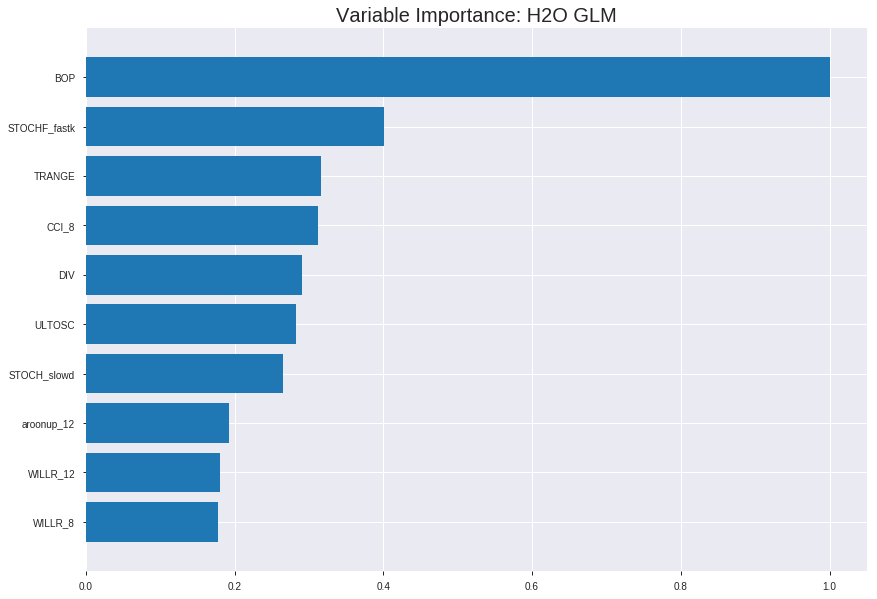

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190824_200718_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.1932333519907983
RMSE: 0.43958315708270523
LogLoss: 0.5694765724712987
Null degrees of freedom: 4318
Residual degrees of freedom: 4267
Null deviance: 5985.886154969303
Residual deviance: 4919.138633007078
AIC: 5023.138633007078
AUC: 0.7753251962761165
pr_auc: 0.7508526948463898
Gini: 0.550650392552233
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.39764263493741947: 


,0,1,Error,Rate
0,1226.0,974.0,0.4427,(974.0/2200.0)
1,349.0,1770.0,0.1647,(349.0/2119.0)
Total,1575.0,2744.0,0.3063,(1323.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3976426,0.7279457,239.0
max f2,0.2202905,0.8381930,323.0
max f0point5,0.5784889,0.7119705,152.0
max accuracy,0.4906951,0.7098865,195.0
max precision,0.9354780,1.0,0.0
max recall,0.0306014,1.0,394.0
max specificity,0.9354780,1.0,0.0
max absolute_mcc,0.4906951,0.4205660,195.0
max min_per_class_accuracy,0.5062348,0.7055215,188.0
max mean_per_class_accuracy,0.4906951,0.7102319,195.0


Gains/Lift Table: Avg response rate: 49.06 %, avg score: 49.06 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8801739,1.9455790,1.9455790,0.9545455,0.8982852,0.9545455,0.8982852,0.0198207,0.0198207,94.5578961,94.5578961
,2,0.0201436,0.8627434,1.8012226,1.8742304,0.8837209,0.8717255,0.9195402,0.8851580,0.0179330,0.0377537,80.1222604,87.4230417
,3,0.0300996,0.8490346,1.9434244,1.8971177,0.9534884,0.8553044,0.9307692,0.8752833,0.0193487,0.0571024,94.3424388,89.7117653
,4,0.0400556,0.8366710,1.7064214,1.8497192,0.8372093,0.8441209,0.9075145,0.8675378,0.0169891,0.0740916,70.6421414,84.9719166
,5,0.0500116,0.8240296,1.7064214,1.8211923,0.8372093,0.8291127,0.8935185,0.8598883,0.0169891,0.0910807,70.6421414,82.1192299
,6,0.1000232,0.7805713,1.5286692,1.6749307,0.75,0.8001171,0.8217593,0.8300027,0.0764512,0.1675319,52.8669184,67.4930741
,7,0.1500347,0.7446901,1.6796489,1.6765034,0.8240741,0.7639681,0.8225309,0.8079912,0.0840019,0.2515337,67.9648856,67.6503446
,8,0.2000463,0.7135904,1.5758503,1.6513402,0.7731481,0.7299785,0.8101852,0.7884880,0.0788108,0.3303445,57.5850331,65.1340167
,9,0.3000695,0.6464821,1.4295888,1.5774230,0.7013889,0.6804134,0.7739198,0.7524631,0.1429920,0.4733365,42.9588774,57.7423036
,10,0.4000926,0.5738849,1.3352265,1.5168739,0.6550926,0.6103512,0.7442130,0.7169352,0.1335536,0.6068900,33.5226478,51.6873897




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.19978628407834584
RMSE: 0.44697458996943645
LogLoss: 0.5857901874046793
Null degrees of freedom: 1233
Residual degrees of freedom: 1182
Null deviance: 1709.9209284159656
Residual deviance: 1445.7301825147483
AIC: 1549.7301825147483
AUC: 0.7595595019359519
pr_auc: 0.7430243622005435
Gini: 0.5191190038719038
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3715515879201783: 


,0,1,Error,Rate
0,337.0,296.0,0.4676,(296.0/633.0)
1,109.0,492.0,0.1814,(109.0/601.0)
Total,446.0,788.0,0.3282,(405.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3715516,0.7084233,249.0
max f2,0.1732723,0.8345221,342.0
max f0point5,0.5602754,0.7089109,155.0
max accuracy,0.5602754,0.7034036,155.0
max precision,0.9150974,1.0,0.0
max recall,0.0322966,1.0,393.0
max specificity,0.9150974,1.0,0.0
max absolute_mcc,0.5602754,0.4113432,155.0
max min_per_class_accuracy,0.4862785,0.6888519,194.0
max mean_per_class_accuracy,0.5602754,0.7006805,155.0


Gains/Lift Table: Avg response rate: 48.70 %, avg score: 47.13 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8644081,1.7373608,1.7373608,0.8461538,0.8851095,0.8461538,0.8851095,0.0183028,0.0183028,73.7360809,73.7360809
,2,0.0202593,0.8444614,2.0532446,1.8889850,1.0,0.8523993,0.92,0.8694086,0.0199667,0.0382696,105.3244592,88.8985025
,3,0.0299838,0.8306834,2.0532446,1.9422584,1.0,0.8369837,0.9459459,0.8588924,0.0199667,0.0582363,105.3244592,94.2258398
,4,0.0405186,0.8210322,1.7373608,1.8889850,0.8461538,0.8247070,0.92,0.8500042,0.0183028,0.0765391,73.7360809,88.8985025
,5,0.0502431,0.8119617,1.5399334,1.8214267,0.75,0.8169866,0.8870968,0.8436137,0.0149750,0.0915141,53.9933444,82.1426655
,6,0.1004862,0.7737998,1.6558424,1.7386345,0.8064516,0.7914535,0.8467742,0.8175336,0.0831947,0.1747088,65.5842413,73.8634534
,7,0.1499190,0.7378585,1.7503069,1.7424832,0.8524590,0.7550616,0.8486486,0.7969347,0.0865225,0.2612313,75.0306866,74.2483249
,8,0.2001621,0.6965206,1.3909076,1.6542335,0.6774194,0.7161467,0.8056680,0.7766560,0.0698835,0.3311148,39.0907627,65.4233497
,9,0.2998379,0.6200417,1.4856810,1.5982012,0.7235772,0.6582083,0.7783784,0.7372801,0.1480865,0.4792013,48.5681046,59.8201196
,10,0.4003241,0.5531722,1.2253234,1.5046043,0.5967742,0.5834876,0.7327935,0.6986763,0.1231281,0.6023295,22.5323386,50.4604337



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-24 20:07:18,0.000 sec,2,.21E2,52,1.3709231,1.3716103
,2019-08-24 20:07:18,0.027 sec,4,.13E2,52,1.3634288,1.3645582
,2019-08-24 20:07:18,0.054 sec,6,.8E1,52,1.3530353,1.3547453
,2019-08-24 20:07:18,0.079 sec,8,.5E1,52,1.3392228,1.3416659
,2019-08-24 20:07:18,0.106 sec,10,.31E1,52,1.3216717,1.3250390
---,---,---,---,---,---,---,---
,2019-08-24 20:07:19,0.455 sec,34,.1E-1,52,1.1368578,1.1720325
,2019-08-24 20:07:19,0.483 sec,36,.63E-2,52,1.1355882,1.1727266
,2019-08-24 20:07:19,0.510 sec,38,.39E-2,52,1.1347800,1.1733571
,2019-08-24 20:07:19,0.539 sec,40,.24E-2,52,1.1342195,1.1738396



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6904376012965965)

('F1', 0.7274969173859432)

('auc', 0.7496427070197562)

('logloss', 0.6041793344749405)

('mean_per_class_error', 0.3094735182849937)

('rmse', 0.45527538498461234)

('mse', 0.207275676172887)

glm prediction progress: |████████████████████████████████████████████████| 100%


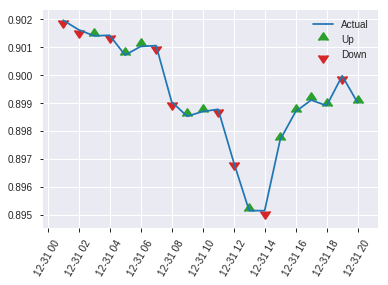


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.207275676172887
RMSE: 0.45527538498461234
LogLoss: 0.6041793344749405
Null degrees of freedom: 616
Residual degrees of freedom: 565
Null deviance: 855.8232650727789
Residual deviance: 745.5572987420767
AIC: 849.5572987420767
AUC: 0.7496427070197562
pr_auc: 0.7481740176427505
Gini: 0.49928541403951243
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.20833836155927143: 


,0,1,Error,Rate
0,101.0,204.0,0.6689,(204.0/305.0)
1,17.0,295.0,0.0545,(17.0/312.0)
Total,118.0,499.0,0.3582,(221.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2083384,0.7274969,323.0
max f2,0.1978929,0.8494318,331.0
max f0point5,0.5087483,0.7017544,170.0
max accuracy,0.4591201,0.6904376,197.0
max precision,0.8942480,1.0,0.0
max recall,0.0315177,1.0,397.0
max specificity,0.8942480,1.0,0.0
max absolute_mcc,0.5087483,0.3833033,170.0
max min_per_class_accuracy,0.4535217,0.6891026,199.0
max mean_per_class_accuracy,0.4591201,0.6905265,197.0


Gains/Lift Table: Avg response rate: 50.57 %, avg score: 44.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8465747,1.9775641,1.9775641,1.0,0.8603046,1.0,0.8603046,0.0224359,0.0224359,97.7564103,97.7564103
,2,0.0210697,0.8262668,1.9775641,1.9775641,1.0,0.8351259,1.0,0.8486837,0.0192308,0.0416667,97.7564103,97.7564103
,3,0.0307942,0.8114821,1.6479701,1.8734818,0.8333333,0.8188915,0.9473684,0.8392756,0.0160256,0.0576923,64.7970085,87.3481781
,4,0.0405186,0.8011844,1.6479701,1.8193590,0.8333333,0.8057714,0.92,0.8312346,0.0160256,0.0737179,64.7970085,81.9358974
,5,0.0502431,0.7916319,1.6479701,1.7861869,0.8333333,0.7973130,0.9032258,0.8246691,0.0160256,0.0897436,64.7970085,78.6186931
,6,0.1004862,0.7448218,1.5948098,1.6904983,0.8064516,0.7673189,0.8548387,0.7959940,0.0801282,0.1698718,59.4809760,69.0498346
,7,0.1507293,0.7040775,1.5310174,1.6373380,0.7741935,0.7267936,0.8279570,0.7729272,0.0769231,0.2467949,53.1017370,63.7338020
,8,0.2009724,0.6631816,1.6586022,1.6426541,0.8387097,0.6822719,0.8306452,0.7502634,0.0833333,0.3301282,65.8602151,64.2654053
,9,0.2998379,0.5863283,1.2319252,1.5072245,0.6229508,0.6232632,0.7621622,0.7083877,0.1217949,0.4519231,23.1925179,50.7224532
,10,0.4003241,0.5244092,1.2120554,1.4331335,0.6129032,0.5543775,0.7246964,0.6697292,0.1217949,0.5737179,21.2055418,43.3133499


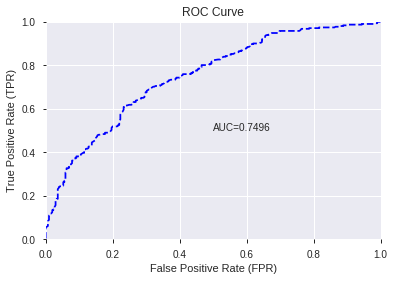

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


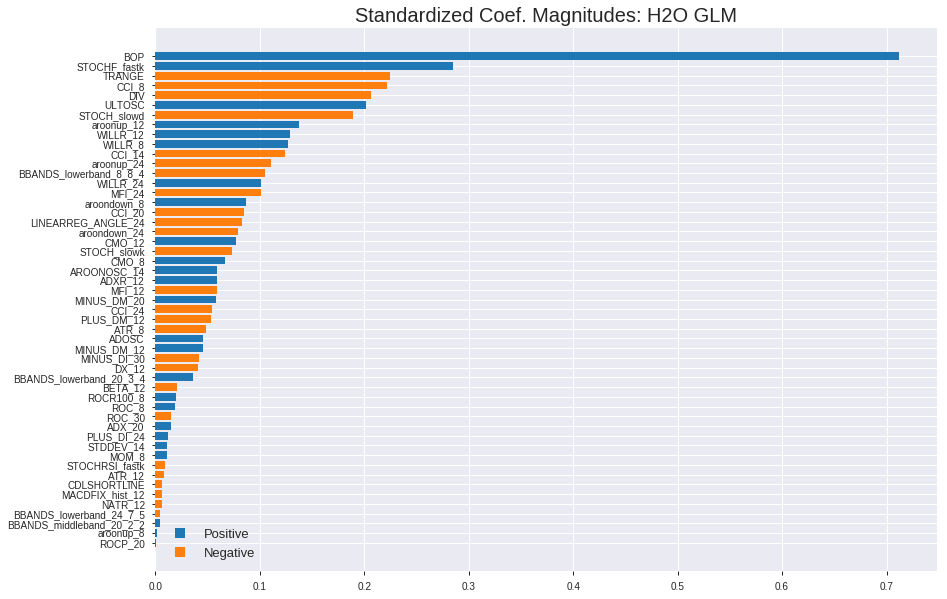

'log_likelihood'
--2019-08-24 20:07:28--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.164.219
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.164.219|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


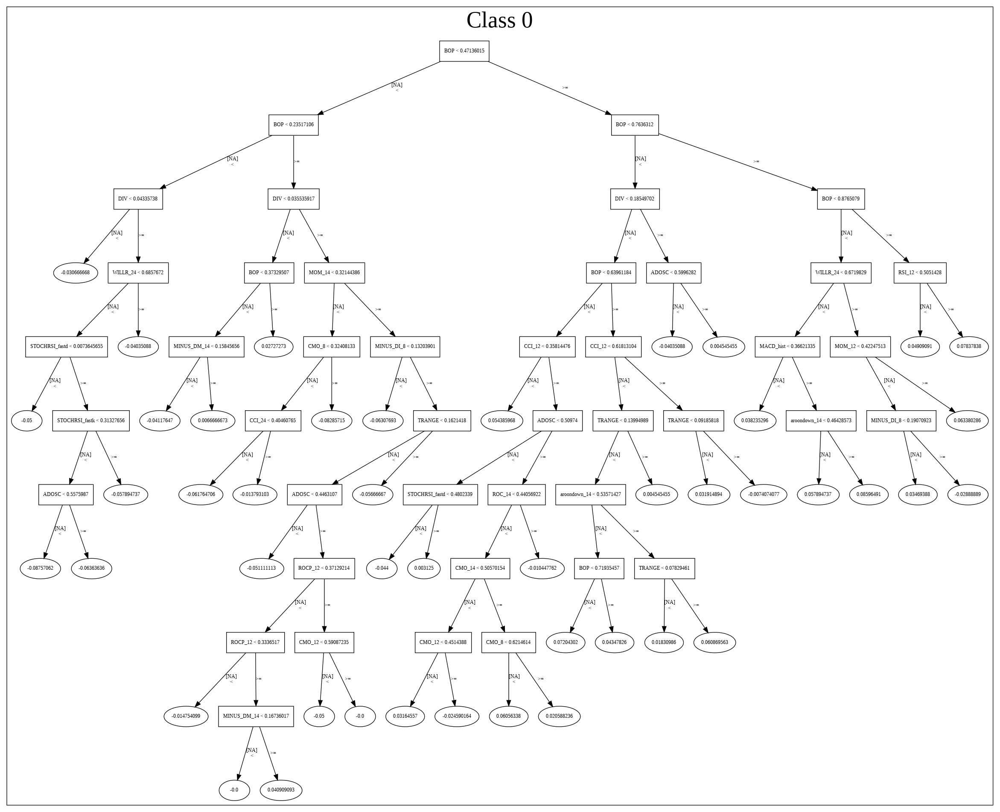

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190824_200718_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190824_200718_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_106_sid_ad7c',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_106

['BOP',
 'STOCHF_fastk',
 'TRANGE',
 'CCI_8',
 'DIV',
 'ULTOSC',
 'STOCH_slowd',
 'aroonup_12',
 'WILLR_12',
 'WILLR_8',
 'CCI_14',
 'aroonup_24',
 'BBANDS_lowerband_8_8_4',
 'WILLR_24',
 'MFI_24',
 'aroondown_8',
 'CCI_20',
 'LINEARREG_ANGLE_24',
 'aroondown_24',
 'CMO_12',
 'STOCH_slowk',
 'CMO_8',
 'AROONOSC_14',
 'ADXR_12',
 'MFI_12',
 'MINUS_DM_20',
 'CCI_24',
 'PLUS_DM_12',
 'ATR_8',
 'ADOSC',
 'MINUS_DM_12',
 'MINUS_DI_30',
 'DX_12',
 'BBANDS_lowerband_20_3_4',
 'BETA_12',
 'ROCR100_8',
 'ROC_8',
 'ROC_30',
 'ADX_20',
 'PLUS_DI_24',
 'STDDEV_14',
 'MOM_8',
 'STOCHRSI_fastk',
 'ATR_12',
 'CDLSHORTLINE',
 'MACDFIX_hist_12',
 'NATR_12',
 'BBANDS_lowerband_24_7_5',
 'BBANDS_middleband_20_2_2',
 'aroonup_8',
 'ROCP_20']

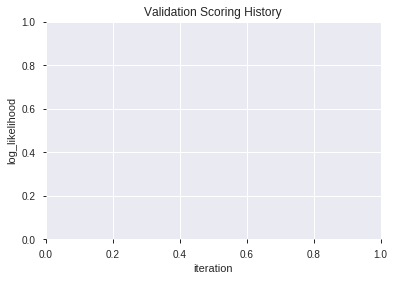

In [53]:
# GLM with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190824_200826_model_2,0.752270,0.600346,0.325956,0.453894,0.206020
1,XGBoost_grid_1_AutoML_20190824_200826_model_4,0.752096,0.599047,0.342975,0.453678,0.205823
2,XGBoost_grid_1_AutoML_20190824_200826_model_1,0.750725,0.601652,0.348077,0.454686,0.206739
3,XGBoost_grid_1_AutoML_20190824_200826_model_7,0.748918,0.608690,0.363052,0.458019,0.209781
4,XGBoost_3_AutoML_20190824_200826,0.748324,0.605525,0.351282,0.456353,0.208258
5,XGBoost_2_AutoML_20190824_200826,0.747189,0.610587,0.373292,0.459355,0.211007
6,XGBoost_1_AutoML_20190824_200826,0.745854,0.609479,0.363015,0.458047,0.209807
7,XGBoost_grid_1_AutoML_20190824_200826_model_3,0.744683,0.607863,0.339696,0.458017,0.209779
8,XGBoost_grid_1_AutoML_20190824_200826_model_6,0.739018,0.612436,0.357656,0.459067,0.210742
9,XGBoost_grid_1_AutoML_20190824_200826_model_5,0.730843,0.631735,0.328720,0.467155,0.218233


,variable,relative_importance,scaled_importance,percentage
0,BOP,6495.967773,1.000000,0.368451
1,TRANGE,1024.204956,0.157668,0.058093
2,STOCHF_fastk,927.157104,0.142728,0.052588
3,DIV,746.421570,0.114905,0.042337
4,CCI_8,707.408264,0.108900,0.040124
5,STOCHRSI_fastk,427.347961,0.065787,0.024239
6,ULTOSC,386.761810,0.059539,0.021937
7,PLUS_DM_12,302.690338,0.046597,0.017169
8,aroonup_8,290.993622,0.044796,0.016505
9,WILLR_8,288.586334,0.044425,0.016369


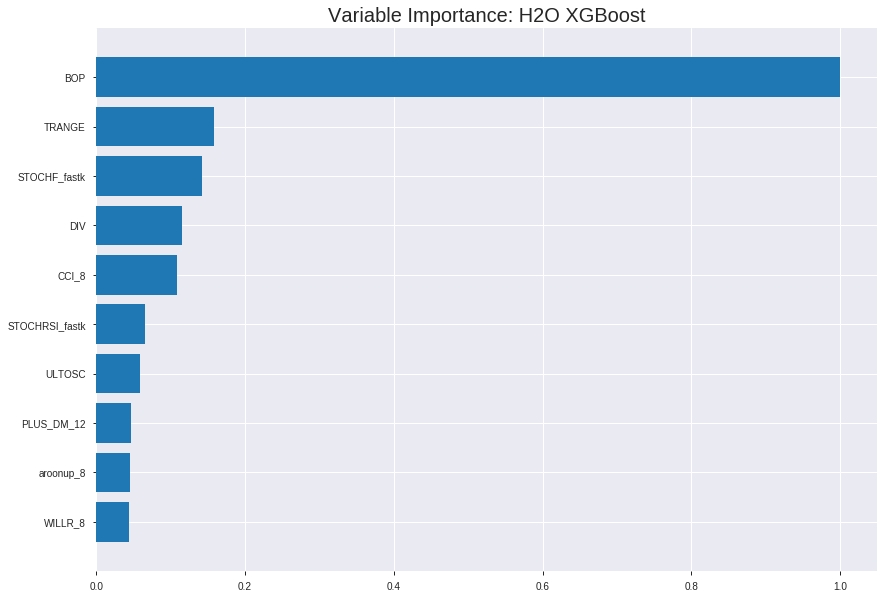

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190824_200826_model_2


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.1603646206877698
RMSE: 0.4004555164906207
LogLoss: 0.4927973789178847
Mean Per-Class Error: 0.2294060234244284
AUC: 0.8601931657299755
pr_auc: 0.8597098386127864
Gini: 0.720386331459951
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.38180415970938547: 


,0,1,Error,Rate
0,1356.0,844.0,0.3836,(844.0/2200.0)
1,239.0,1880.0,0.1128,(239.0/2119.0)
Total,1595.0,2724.0,0.2508,(1083.0/4319.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3818042,0.7763783,250.0
max f2,0.2684636,0.8641923,305.0
max f0point5,0.6348179,0.7933579,132.0
max accuracy,0.5042273,0.7705487,195.0
max precision,0.9160968,1.0,0.0
max recall,0.1116735,1.0,380.0
max specificity,0.9160968,1.0,0.0
max absolute_mcc,0.5042273,0.5411004,195.0
max min_per_class_accuracy,0.5055320,0.7697027,194.0
max mean_per_class_accuracy,0.5042273,0.7705940,195.0


Gains/Lift Table: Avg response rate: 49.06 %, avg score: 49.07 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0101875,0.8868508,2.0382256,2.0382256,1.0,0.8983371,1.0,0.8983371,0.0207645,0.0207645,103.8225578,103.8225578
,2,0.0201436,0.8716670,2.0382256,2.0382256,1.0,0.8784636,1.0,0.8885145,0.0202926,0.0410571,103.8225578,103.8225578
,3,0.0300996,0.8576801,2.0382256,2.0382256,1.0,0.8640343,1.0,0.8804172,0.0202926,0.0613497,103.8225578,103.8225578
,4,0.0400556,0.8446970,1.9434244,2.0146623,0.9534884,0.8510546,0.9884393,0.8731190,0.0193487,0.0806984,94.3424388,101.4662277
,5,0.0500116,0.8347459,2.0382256,2.0193531,1.0,0.8403300,0.9907407,0.8665916,0.0202926,0.1009910,103.8225578,101.9353119
,6,0.1000232,0.7875406,1.9721720,1.9957625,0.9675926,0.8100752,0.9791667,0.8383334,0.0986314,0.1996225,97.2171971,99.5762545
,7,0.1500347,0.7528393,1.8778097,1.9564449,0.9212963,0.7705953,0.9598765,0.8157540,0.0939122,0.2935347,87.7809676,95.6444922
,8,0.2000463,0.7209229,1.8211923,1.9226318,0.8935185,0.7359400,0.9432870,0.7958005,0.0910807,0.3846154,82.1192299,92.2631766
,9,0.3000695,0.6565031,1.5428235,1.7960290,0.7569444,0.6901587,0.8811728,0.7605866,0.1543181,0.5389335,54.2823528,79.6029020
,10,0.4000926,0.5819454,1.3069178,1.6737512,0.6412037,0.6208196,0.8211806,0.7256448,0.1307220,0.6696555,30.6917790,67.3751213




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.19774705799598352
RMSE: 0.44468759595471463
LogLoss: 0.5786523262318857
Mean Per-Class Error: 0.29736642194552
AUC: 0.7633196909836949
pr_auc: 0.7493167889434296
Gini: 0.5266393819673898
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.38175783554712933: 


,0,1,Error,Rate
0,361.0,272.0,0.4297,(272.0/633.0)
1,115.0,486.0,0.1913,(115.0/601.0)
Total,476.0,758.0,0.3136,(387.0/1234.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3817578,0.7152318,241.0
max f2,0.1313276,0.8375350,371.0
max f0point5,0.5661948,0.6967692,156.0
max accuracy,0.4668927,0.7017828,204.0
max precision,0.9119158,1.0,0.0
max recall,0.0981829,1.0,385.0
max specificity,0.9119158,1.0,0.0
max absolute_mcc,0.4668927,0.4057474,204.0
max min_per_class_accuracy,0.4998991,0.6951027,189.0
max mean_per_class_accuracy,0.4668927,0.7026336,204.0


Gains/Lift Table: Avg response rate: 48.70 %, avg score: 47.43 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0105348,0.8751960,2.0532446,2.0532446,1.0,0.8944702,1.0,0.8944702,0.0216306,0.0216306,105.3244592,105.3244592
,2,0.0202593,0.8582592,1.8821409,1.9711148,0.9166667,0.8670634,0.96,0.8813150,0.0183028,0.0399334,88.2140876,97.1114809
,3,0.0299838,0.8367731,1.8821409,1.9422584,0.9166667,0.8485808,0.9459459,0.8706985,0.0183028,0.0582363,88.2140876,94.2258398
,4,0.0405186,0.8256336,1.8953027,1.9300499,0.9230769,0.8321005,0.94,0.8606630,0.0199667,0.0782030,89.5302701,93.0049917
,5,0.0502431,0.8145810,1.8821409,1.9207772,0.9166667,0.8191111,0.9354839,0.8526207,0.0183028,0.0965058,88.2140876,92.0777199
,6,0.1004862,0.7650811,1.6558424,1.7883098,0.8064516,0.7876774,0.8709677,0.8201491,0.0831947,0.1797005,65.5842413,78.8309806
,7,0.1499190,0.7266328,1.6156679,1.7313846,0.7868852,0.7448225,0.8432432,0.7953116,0.0798669,0.2595674,61.5667876,73.1384629
,8,0.2001621,0.6925642,1.3577908,1.6376080,0.6612903,0.7090287,0.7975709,0.7736536,0.0682196,0.3277870,35.7790779,63.7608035
,9,0.2998379,0.6273710,1.4856810,1.5871026,0.7235772,0.6601741,0.7729730,0.7359293,0.1480865,0.4758735,48.5681046,58.7102577
,10,0.4003241,0.5637238,1.1922065,1.4879789,0.5806452,0.5936400,0.7246964,0.7002130,0.1198003,0.5956739,19.2206537,48.7978875



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-24 20:08:36,1.544 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.5093772,0.5,0.6931472,0.5,0.0,1.0,0.5129660
,2019-08-24 20:08:36,1.641 sec,5.0,0.4788186,0.6515015,0.7944633,0.7315563,1.8471419,0.2896504,0.4824823,0.6585673,0.7491871,0.6926980,1.8747016,0.3581848
,2019-08-24 20:08:37,1.715 sec,10.0,0.4621595,0.6192850,0.8055910,0.7605959,1.9088144,0.2810836,0.4695281,0.6331738,0.7562370,0.7134174,1.7794786,0.3500810
,2019-08-24 20:08:37,1.791 sec,15.0,0.4501114,0.5958515,0.8113257,0.7716177,1.9309505,0.2766844,0.4616501,0.6174313,0.7560740,0.7124278,1.7794786,0.3549433
,2019-08-24 20:08:37,1.874 sec,20.0,0.4416555,0.5790184,0.8157738,0.7866095,1.9939163,0.2898819,0.4566359,0.6069901,0.7568297,0.7244281,1.8953027,0.3525122
,2019-08-24 20:08:37,1.963 sec,25.0,0.4344496,0.5644946,0.8224151,0.8099529,2.0382256,0.2769160,0.4532754,0.5996882,0.7580468,0.7386601,1.8953027,0.3144246
,2019-08-24 20:08:37,2.056 sec,30.0,0.4291709,0.5534153,0.8263055,0.8188730,2.0382256,0.2729799,0.4507342,0.5938832,0.7592309,0.7424154,2.0532446,0.3103728
,2019-08-24 20:08:37,2.152 sec,35.0,0.4242051,0.5430414,0.8310554,0.8263915,2.0382256,0.2706645,0.4489180,0.5896470,0.7601733,0.7440983,2.0532446,0.3184765
,2019-08-24 20:08:37,2.248 sec,40.0,0.4201205,0.5343538,0.8349270,0.8305536,2.0382256,0.2750637,0.4477613,0.5868027,0.7605925,0.7455173,2.0532446,0.3200972
,2019-08-24 20:08:37,2.344 sec,45.0,0.4166881,0.5269716,0.8389897,0.8352699,2.0382256,0.2704330,0.4468465,0.5845252,0.7614429,0.7418588,2.0532446,0.3225284


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,6495.9677734,1.0,0.3684508
TRANGE,1024.2049561,0.1576678,0.0580928
STOCHF_fastk,927.1571045,0.1427281,0.0525883
DIV,746.4215698,0.1149054,0.0423370
CCI_8,707.4082642,0.1088996,0.0401241
---,---,---,---
CCI_24,86.3299103,0.0132898,0.0048966
CDLSHORTLINE,82.2271347,0.0126582,0.0046639
AROONOSC_14,80.3066559,0.0123625,0.0045550
NATR_12,55.8310623,0.0085947,0.0031667



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.6904376012965965)

('F1', 0.7222222222222222)

('auc', 0.7522698612862547)

('logloss', 0.6003463405483251)

('mean_per_class_error', 0.30943673812526273)

('rmse', 0.4538942683342274)

('mse', 0.20602000682666363)

xgboost prediction progress: |████████████████████████████████████████████| 100%


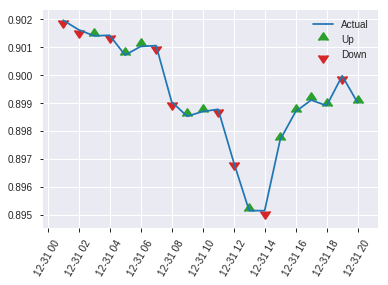


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.20602000682666363
RMSE: 0.4538942683342274
LogLoss: 0.6003463405483251
Mean Per-Class Error: 0.30943673812526273
AUC: 0.7522698612862547
pr_auc: 0.7398972138892607
Gini: 0.5045397225725095
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3128747045993805: 


,0,1,Error,Rate
0,157.0,148.0,0.4852,(148.0/305.0)
1,52.0,260.0,0.1667,(52.0/312.0)
Total,209.0,408.0,0.3241,(200.0/617.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3128747,0.7222222,263.0
max f2,0.1329125,0.8425110,367.0
max f0point5,0.5222719,0.7007576,157.0
max accuracy,0.4598132,0.6904376,191.0
max precision,0.8477787,0.9090909,8.0
max recall,0.0832758,1.0,392.0
max specificity,0.8839054,0.9967213,0.0
max absolute_mcc,0.4598132,0.3811626,191.0
max min_per_class_accuracy,0.4536857,0.6891026,195.0
max mean_per_class_accuracy,0.4598132,0.6905633,191.0


Gains/Lift Table: Avg response rate: 50.57 %, avg score: 44.64 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0113452,0.8545641,1.6950549,1.6950549,0.8571429,0.8721692,0.8571429,0.8721692,0.0192308,0.0192308,69.5054945,69.5054945
,2,0.0210697,0.8400575,1.6479701,1.6733235,0.8333333,0.8477539,0.8461538,0.8609006,0.0160256,0.0352564,64.7970085,67.3323471
,3,0.0307942,0.8191356,1.9775641,1.7693995,1.0,0.8257184,0.8947368,0.8497904,0.0192308,0.0544872,97.7564103,76.9399460
,4,0.0405186,0.8075584,1.3183761,1.6611538,0.6666667,0.8124901,0.84,0.8408383,0.0128205,0.0673077,31.8376068,66.1153846
,5,0.0502431,0.7857818,1.6479701,1.6586022,0.8333333,0.7980228,0.8387097,0.8325515,0.0160256,0.0833333,64.7970085,65.8602151
,6,0.1004862,0.7420635,1.7223945,1.6904983,0.8709677,0.7631886,0.8548387,0.7978700,0.0865385,0.1698718,72.2394541,69.0498346
,7,0.1507293,0.6998878,1.6586022,1.6798663,0.8387097,0.7175971,0.8494624,0.7711124,0.0833333,0.2532051,65.8602151,67.9866281
,8,0.2009724,0.6694829,1.4672250,1.6267060,0.7419355,0.6837437,0.8225806,0.7492702,0.0737179,0.3269231,46.7224979,62.6705955
,9,0.2998379,0.5946646,1.3940206,1.5499827,0.7049180,0.6345593,0.7837838,0.7114466,0.1378205,0.4647436,39.4020597,54.9982675
,10,0.4003241,0.5306535,1.1482630,1.4491462,0.5806452,0.5651377,0.7327935,0.6747213,0.1153846,0.5801282,14.8263027,44.9146164


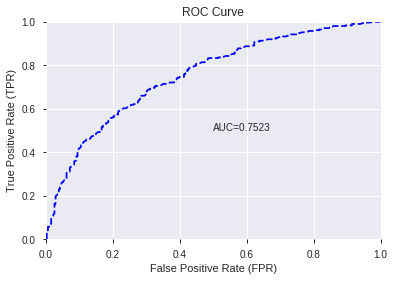

This function is available for GLM models only


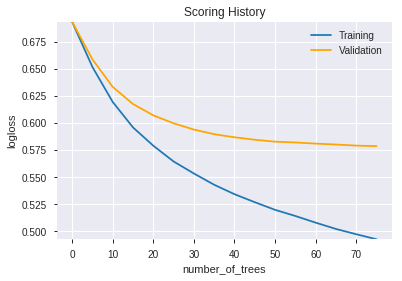

--2019-08-24 20:09:04--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.139.59
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.139.59|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.indexOf(String.java:1578)
	at java.base/java.lang.String.indexOf(String.java:1535)
	at java.base/java.lang.String.split(String.java:2274)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.j

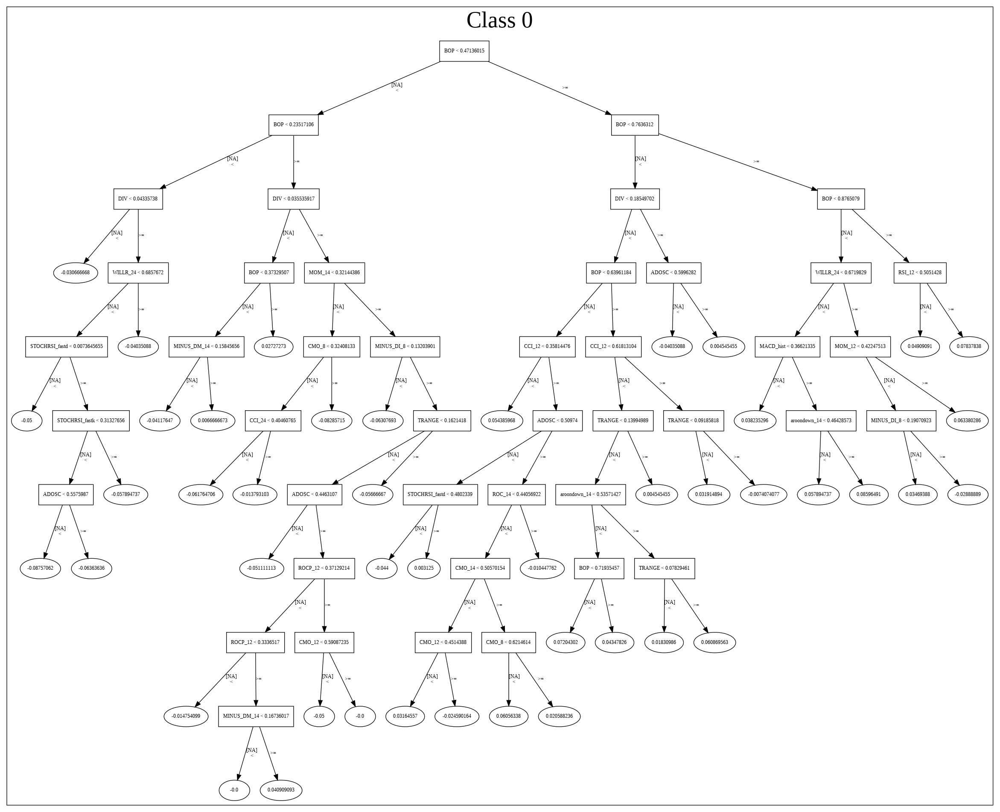

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190824_200826_model_2',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190824_200826_model_2',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_114_sid_ad7c',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_trainin

['BOP',
 'TRANGE',
 'STOCHF_fastk',
 'DIV',
 'CCI_8',
 'STOCHRSI_fastk',
 'ULTOSC',
 'PLUS_DM_12',
 'aroonup_8',
 'WILLR_8',
 'ADOSC',
 'ATR_8',
 'WILLR_12',
 'MFI_24',
 'CCI_14',
 'ADXR_12',
 'MINUS_DM_12',
 'BBANDS_middleband_20_2_2',
 'ADX_20',
 'DX_12',
 'STOCH_slowd',
 'MFI_12',
 'aroonup_12',
 'aroonup_24',
 'CCI_20',
 'LINEARREG_ANGLE_24',
 'ROC_30',
 'BBANDS_lowerband_8_8_4',
 'BBANDS_lowerband_24_7_5',
 'MINUS_DM_20',
 'STDDEV_14',
 'aroondown_24',
 'BETA_12',
 'MOM_8',
 'CMO_12',
 'PLUS_DI_24',
 'CMO_8',
 'STOCH_slowk',
 'ATR_12',
 'aroondown_8',
 'MACDFIX_hist_12',
 'BBANDS_lowerband_20_3_4',
 'WILLR_24',
 'MINUS_DI_30',
 'ROCP_20',
 'CCI_24',
 'CDLSHORTLINE',
 'AROONOSC_14',
 'NATR_12',
 'ROC_8']

In [54]:
# XGBoost with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="XGBoost",features_list=features_list)

In [55]:
# Experiment Summary
pd.set_option('precision', 3) 

for k in models_summary:
  print(k)
  display(models_summary[k].max())
  print('\n'*3)
  display(models_summary[k].groupby(models_summary[k].index).max())
  print('\n'*3)
  
display(models_summary)

pd.set_option('precision', 6) 

accuracy


DeepLearning    0.695
GLM             0.690
XGBoost         0.699
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.681,0.690,0.697
DLF,0.684,0.676,0.699
Fwe,0.682,0.689,0.689
RFE,0.690,0.690,0.690
XGBF,0.695,0.676,0.699






F1


DeepLearning    0.747
GLM             0.729
XGBoost         0.732
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.725,0.729,0.732
DLF,0.724,0.727,0.726
Fwe,0.724,0.727,0.731
RFE,0.730,0.727,0.722
XGBF,0.747,0.727,0.726






auc


DeepLearning    0.753
GLM             0.755
XGBoost         0.760
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.734,0.755,0.760
DLF,0.750,0.745,0.758
Fwe,0.744,0.751,0.757
RFE,0.747,0.750,0.752
XGBF,0.753,0.745,0.758






logloss


DeepLearning    0.663
GLM             0.617
XGBoost         0.600
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.663,0.598,0.594
DLF,0.589,0.617,0.600
Fwe,0.596,0.606,0.598
RFE,0.599,0.604,0.600
XGBF,0.610,0.617,0.600






mean_per_class_error


DeepLearning    0.320
GLM             0.325
XGBoost         0.311
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.320,0.308,0.303
DLF,0.316,0.325,0.302
Fwe,0.317,0.311,0.311
RFE,0.311,0.309,0.309
XGBF,0.307,0.325,0.302






rmse


DeepLearning    0.484
GLM             0.460
XGBoost         0.454
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.484,0.452,0.452
DLF,0.450,0.460,0.453
Fwe,0.453,0.455,0.452
RFE,0.454,0.455,0.454
XGBF,0.456,0.460,0.453






mse


DeepLearning    0.234
GLM             0.211
XGBoost         0.206
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.234,0.204,0.204
DLF,0.202,0.211,0.205
Fwe,0.205,0.207,0.205
RFE,0.206,0.207,0.206
XGBF,0.208,0.211,0.205


{'F1':       DeepLearning    GLM  XGBoost
 All          0.725    NaN      NaN
 DLF          0.724    NaN      NaN
 DLF            NaN  0.727      NaN
 DLF            NaN    NaN    0.726
 All            NaN  0.729      NaN
 All            NaN    NaN    0.732
 XGBF         0.747    NaN      NaN
 XGBF           NaN  0.727      NaN
 XGBF           NaN    NaN    0.726
 Fwe          0.724    NaN      NaN
 Fwe            NaN  0.727      NaN
 Fwe            NaN    NaN    0.731
 RFE          0.730    NaN      NaN
 RFE            NaN  0.727      NaN
 RFE            NaN    NaN    0.722,
 'accuracy':       DeepLearning    GLM  XGBoost
 All          0.681    NaN      NaN
 DLF          0.684    NaN      NaN
 DLF            NaN  0.676      NaN
 DLF            NaN    NaN    0.699
 All            NaN  0.690      NaN
 All            NaN    NaN    0.697
 XGBF         0.695    NaN      NaN
 XGBF           NaN  0.676      NaN
 XGBF           NaN    NaN    0.699
 Fwe          0.682    NaN      NaN
 Fwe     